# Problem Statement:

### A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you may expect — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighborhood and based on gathered data you will try to assess your house price.

# Problem Definition:

Real estate transactions, whether buying or selling, often present challenges for individuals and businesses. Determining an appropriate market value for a property can be complex and involves considering numerous factors. Offering a price that is either too low or too high can significantly impact the success of the transaction.

This project aims to develop a predictive model that accurately estimates the market price of a residential property based on its attributes. By analyzing historical property data, we seek to understand the influence of various factors on property prices.

### Key Objectives:

* Develop a predictive model: Create a machine learning model capable of accurately estimating property prices.

* Identify key factors: Determine the most influential attributes that impact property prices.

* Provide valuable insights: Gain a deeper understanding of the real estate market dynamics and how different factors contribute to property values.

### Significance:
Accurate property pricing is crucial for both buyers and sellers. This model will empower stakeholders to make informed decisions, optimize their investment strategies, and achieve successful real estate transactions.

## Understanding Business/Social Opportunity

### Social Opportunity:

* Empowering Homeowners: By providing accessible and affordable guidance, we can empower individuals to make informed decisions about their property transactions.

* Reducing Financial Risk: Our services can help homeowners avoid potential financial losses due to mispricing, ensuring they receive fair market value for their property.

* Promoting Fair Market Practices: By providing accurate and transparent information, we can contribute to a more equitable and transparent real estate market.

### Business Opportunity:

* Addressing a Market Need: There is a significant demand for expert guidance in the real estate market, especially among individuals who lack the knowledge and expertise to navigate the complexities of property transactions.

* Revenue Generation: By charging fees for our services, we can generate revenue and build a profitable business.

* Building a Sustainable Business: By providing valuable services and building strong client relationships, we can establish a sustainable and successful business in the real estate sector.

In [622]:
!pip install factor_analyzer

In [623]:
!pip install xgboost

In [624]:
#conda install -c conda-forge xgboost

### Import the Libraries

In [625]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.decomposition import PCA
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans, HDBSCAN
from sklearn.cluster import AgglomerativeClustering

# Perform statistical tests before PCA
from factor_analyzer import FactorAnalyzer

Version of Libraries

In [626]:
print('Numpy Version:', np.__version__)
print('Pandas Version:', pd.__version__)
print('Seaborn Version:', sns.__version__)
print('Matplotlib Version:', matplotlib.__version__)

Numpy Version: 1.26.4
Pandas Version: 2.1.3
Seaborn Version: 0.13.0
Matplotlib Version: 3.8.2


import the dataset into DataFrame

In [627]:
data = pd.read_excel(r'C:\Users\DEEP\Desktop\innercity.xlsx')
data.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


# Data Report

Checking the shape of the data: Number of columns and rows



In [628]:
data.shape

(21613, 23)

We have 21613 rows and 23 columns in dataset.

In [629]:
data.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

#### Given above columns details mentioned with their defination.

1. cid: a notation for a house. we Will drop this column.

2. dayhours: Date house was sold. we will convert into date and time.

3. price: The target feature that we aim to predict based on the other features.

4. room_bed: Indicates the number of bedrooms in the house.

5. room_bath: Indicates the number of bathrooms in the house.

6. living_measure: Represents the square footage of the house's living area.

7. lot_measure: Represents the square footage of the lot.

8. ceil: Indicates the number of floors in the house.

9. coast: Indicates whether the house has a waterfront view. It looks a categorical variable, which will be explored further in data analysis.

10. sight: Represents the number of times the house has been viewed.

11. condition: Indicates the overall condition of the house, similar to a rating assigned to it.

12. quality: Represents the grade assigned to the house based on a grading system.

13. ceil_measure: Represents the square footage of the house, excluding the basement.

14. basement: Represents the square footage of the basement.

15. yr_built: Indicates the year the house was originally built.

16. yr_renovated: Indicates the year the house was most recently renovated.

17. zipcode: Represents the zip code of the house's location, as the name implies.

18. lat: It is repersenting the Latitude coordinates.

19. long: It is repersenting the Longitude coordinates.

20. living_measure15: Represents the square footage of the house as measured in 2015. This value reflects the house area, which may or may not have changed due to renovations, if any were carried out after that year.

21. lot_measure15: lot_measure15: Represents the square footage of the lot as measured in 2015. This value reflects the lot area, which is unlikely to change but may vary if any modifications were made after that year.

22. furnished: It is showing house is furnished or not. It seems to be categorical variable as per info.

23. total_area: Measure of both living and lot

In [630]:
pd.get_option('display.max_columns')
pd.set_option('display.max_columns', None)
data.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,3,8.0,1800.0,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,4,6.0,670.0,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,3,8.0,3040.0,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,3,8.0,1740.0,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,3,7.0,1120.0,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


Check the Data Types of the columns for the dataset

In [631]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

We have below features in our dataset.
* 4 features are of integer type
* 12 features are of float type
* 7 feature is of object type

Check the Statistical Summary of data

In [632]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21505.0,3.371355e+00,9.302886e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21505.0,2.115171e+00,7.702481e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21596.0,2.079861e+03,9.184961e+02,2.900000e+02,1.429250e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21571.0,1.510458e+04,4.142362e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068450e+04,1.651359e+06
sight,21556.0,2.343663e-01,7.664376e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
quality,21612.0,7.656857e+00,1.175484e+00,1.000000e+00,7.000000e+00,7.000000e+00,8.000000e+00,1.300000e+01
ceil_measure,21612.0,1.788367e+03,8.281025e+02,2.900000e+02,1.190000e+03,1.560000e+03,2.210000e+03,9.410000e+03
basement,21612.0,2.915225e+02,4.425808e+02,0.000000e+00,0.000000e+00,0.000000e+00,5.600000e+02,4.820000e+03


Convert the dayhours column into date and time

In [633]:
data['dayhours'] = pd.to_datetime(data['dayhours'])

In [634]:
data['dayhours'].value_counts()

dayhours
2014-06-23    142
2014-06-25    131
2014-06-26    131
2014-07-08    127
2015-04-27    126
             ... 
2015-05-15      1
2015-01-10      1
2014-08-03      1
2015-01-31      1
2014-08-30      1
Name: count, Length: 372, dtype: int64

Find out all speical charactor in all columns.

In [635]:
# Characters to search for
special_chars = r'[$@\-_]'

# Check for anomalies in column names
anomalous_columns = [col for col in data.columns if pd.Series(col).str.contains(special_chars).any()]
print("Columns with anomalies:", anomalous_columns)

# Check for anomalies in data
anomalous_data = {}
for col in data.columns:
    # Ensure the column is converted to strings before applying .str.contains
    matches = data[col].astype(str).str.contains(special_chars, regex=True, na=False)
    if matches.any():
        anomalous_data[col] = data[col][matches].tolist()

print("\nData anomalies by columns:")
for col, anomalies in anomalous_data.items():
    print(f"{col}: {anomalies}")

Columns with anomalies: ['room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil_measure', 'yr_built', 'yr_renovated', 'living_measure15', 'lot_measure15', 'total_area']

Data anomalies by columns:
dayhours: [Timestamp('2015-04-27 00:00:00'), Timestamp('2015-03-17 00:00:00'), Timestamp('2014-08-20 00:00:00'), Timestamp('2014-10-10 00:00:00'), Timestamp('2015-02-18 00:00:00'), Timestamp('2014-07-09 00:00:00'), Timestamp('2014-07-15 00:00:00'), Timestamp('2014-06-18 00:00:00'), Timestamp('2014-07-21 00:00:00'), Timestamp('2014-10-28 00:00:00'), Timestamp('2014-05-02 00:00:00'), Timestamp('2015-01-23 00:00:00'), Timestamp('2014-10-29 00:00:00'), Timestamp('2015-01-23 00:00:00'), Timestamp('2015-03-11 00:00:00'), Timestamp('2014-08-22 00:00:00'), Timestamp('2014-05-22 00:00:00'), Timestamp('2014-07-09 00:00:00'), Timestamp('2014-08-19 00:00:00'), Timestamp('2015-04-28 00:00:00'), Timestamp('2015-02-12 00:00:00'), Timestamp('2014-09-09 00:00:00'), Timestamp('2014-11-25 00:00:00'), T

Replace the dollar sign value with null

In [636]:
from pickle import DEFAULT_PROTOCOL

# Check if there are any non-integer entries that might contain a dollar sign

data['ceil'] = data['ceil'].apply(lambda x: str(x).replace('$', '') if isinstance(x, str) else x)

data['coast'] = data['coast'].apply(lambda x: str(x).replace('$', '') if isinstance(x, str) else x)

data['condition'] = data['condition'].apply(lambda x: str(x).replace('$', '') if isinstance(x, str) else x)

data['yr_built'] = data['yr_built'].apply(lambda x: str(x).replace('$', '') if isinstance(x, str) else x)

data['long'] = data['long'].apply(lambda x: str(x).replace('$', '') if isinstance(x, str) else x)

data['total_area'] = data['total_area'].apply(lambda x: str(x).replace('$', '') if isinstance(x, str) else x)


#### Convert the columns back to a numeric type

In [637]:
data['ceil'] = pd.to_numeric(data['ceil'])
data['coast'] = pd.to_numeric(data['coast'])
data['condition'] = pd.to_numeric(data['condition'])
data['yr_built'] = pd.to_numeric(data['yr_built'])
data['long'] = pd.to_numeric(data['long'])
data['total_area'] = pd.to_numeric(data['total_area'])

# Check Dollar Sign values replaced with null value
print('ceil :',data['ceil'].unique())
print('\ncoast :',data['coast'].unique())
print('\ncondition  :',data['condition'].unique())
print('\nYear Built :',data['yr_built'].unique())
print('\nLongnitude :',data['long'].unique())
print('\total_area :',data['total_area'].unique())

ceil : [1.  2.  3.  1.5 2.5 nan 3.5]

coast : [ 0.  1. nan]

condition  : [ 3.  4.  5.  2. nan  1.]

Year Built : [1966. 1948. 2009. 1924. 1994. 2005. 1978. 1983. 2012. 1912. 1990. 1967.
 1919. 1908. 1950. 2000. 2013. 1943. 1922. 1977. 2004. 1935. 1964. 1945.
 1987. 2008. 1940. 2003. 1988. 1985. 1998. 1995. 1946. 1984. 1958. 1963.
 1942. 2014. 1971. 1936. 1954. 1923. 2002. 1972. 2007. 1930. 1962. 1999.
 1953. 1965. 2010. 1997. 2006. 1979. 1996. 1992. 1968. 1980. 1981. 1969.
 2001. 1929. 1952. 1916. 1976. 1974. 1920. 1931. 1975. 1960. 1900.   nan
 1986. 1989. 1906. 1955. 1956. 1915. 1941. 1993. 2011. 1925. 1947. 1991.
 1926. 1927. 1951. 1961. 1932. 1917. 1928. 1959. 1921. 1911. 1949. 1982.
 1913. 1957. 1914. 1938. 1973. 1937. 1944. 1970. 1901. 1907. 1939. 1918.
 1934. 1904. 2015. 1909. 1910. 1905. 1902. 1933. 1903.]

Longnitude : [-122.183 -122.274 -122.256 -122.213 -122.285      nan -122.333 -122.165
 -122.15  -122.178 -121.87  -122.352 -122.122 -122.275 -122.234 -122.324
 -122.321 -12

Replace Null Value with mode and change the some columns datatypes integer and ceil data types also changed from object to float

In [638]:
data['ceil'] = data['ceil'].fillna(data['ceil'].mode()[0]).astype(int)
data['coast'] = data['coast'].fillna(data['coast'].mode()[0]).astype(int)
data['condition'] = data['condition'].fillna(data['condition'].mode()[0]).astype(int)
data['yr_built'] = data['yr_built'].fillna(data['yr_built'].mode()[0]).astype(int)
data['long'] = data['long'].fillna(data['long'].mode()[0])

In [639]:
data[['ceil', 'coast', 'condition', 'yr_built', 'lat','long']].head()

,ceil,coast,condition,yr_built,lat,long
0,1,0,3,1966,47.7228,-122.183
1,1,0,4,1948,47.5546,-122.274
2,2,1,3,1966,47.5188,-122.256
3,2,0,3,2009,47.3363,-122.213
4,1,0,3,1924,47.5663,-122.285


In [640]:
# Find out the rows where 'total_area' is null or 0
Filtered  = data[(data['total_area'].isnull()) | (data['total_area'] == 0)]

# Display the indices
Filtered[['living_measure', 'lot_measure', 'total_area']]

,living_measure,lot_measure,total_area
128,1830.0,8022.0,NaN
402,2700.0,6120.0,NaN
455,1700.0,4125.0,NaN
578,2160.0,9525.0,NaN
843,2530.0,9200.0,NaN
...,...,...,...
19981,1250.0,5880.0,NaN
20199,2860.0,12293.0,NaN
20251,1140.0,10320.0,NaN
21152,3490.0,6906.0,NaN


Replace null values in 'total_area' column using the formula: total_area = living + lot.

The total_area column is updated only where its value is null.

In [641]:
data.loc[data['total_area'].isnull(), 'total_area'] = data['living_measure'] + data['lot_measure']

#### Explanation:
* The 'total_area' represents the combined measure of 'living' and 'lot'.
* To handle null values in 'total_area', we compute the sum of 'living' and 'lot'
* for those rows and update the 'total_area' column accordingly.

In [642]:
# Check the details forumla is working correctly.
data[['living_measure', 'lot_measure', 'total_area']].loc[[128, 402, 455, 578, 843, 21172]]

,living_measure,lot_measure,total_area
128,1830.0,8022.0,9852.0
402,2700.0,6120.0,8820.0
455,1700.0,4125.0,5825.0
578,2160.0,9525.0,11685.0
843,2530.0,9200.0,11730.0
21172,3390.0,4500.0,7890.0


Check the Null values in all dataset.

In [643]:
data.isnull().sum().sort_values(ascending=False)

living_measure15    166
room_bed            108
room_bath           108
sight                57
lot_measure          42
furnished            29
lot_measure15        29
living_measure       17
quality               1
ceil_measure          1
basement              1
yr_renovated          0
long                  0
lat                   0
zipcode               0
cid                   0
yr_built              0
dayhours              0
condition             0
coast                 0
ceil                  0
price                 0
total_area            0
dtype: int64

* (Furnished: Based on the quality of room ) we are considering Null value replaced with 0. 0 means home is not furnished and 1 means furnished.

* (Sight: Has been viewed ) - We are considering Null value should replaced with 0. It Means Has not seen once.

* Basement - Replaced with mode. Because Null value. Here we are considering No Basement in Home. Hence replace with Null.




In [644]:
data['furnished'] = data['furnished'].fillna(0).astype(int)
data['sight'] = data['sight'].fillna(0).astype(int)
data['basement'] = data['basement'].fillna(data['basement'].mode()[0])

Find out the null values in living_measure


In [645]:
data.loc[data['living_measure'].isnull()].head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
1451,2419600075,2014-12-01,465000,NaN,NaN,NaN,6360.0,1,0,0,3,7.0,1480.0,0.0,1954,0,98133,47.7311,-122.353,1480.0,6360.0,0,7840.0
1817,7443000480,2015-05-07,865000,NaN,NaN,NaN,5527.0,2,0,0,3,8.0,2130.0,620.0,1901,1987,98119,47.6513,-122.368,1290.0,1764.0,0,8277.0
3770,1310430130,2014-10-09,459000,NaN,NaN,NaN,6600.0,2,0,0,3,9.0,2790.0,0.0,2000,0,98058,47.4362,-122.109,2900.0,6752.0,1,9390.0
4384,5072100095,2014-11-17,554000,NaN,NaN,NaN,12900.0,1,0,2,4,8.0,1720.0,1720.0,1958,0,98166,47.4426,-122.342,2100.0,10751.0,0,16340.0
4962,3034200666,2014-11-07,808100,NaN,NaN,NaN,13457.0,1,0,0,5,9.0,3020.0,0.0,1956,0,98133,47.7174,-122.336,2120.0,7553.0,1,16477.0


The 'living_measure' can be calculated by subtracting the 'lot_measure' from the 'total_area'. This is based on the understanding that 'total_area' encompasses both the 'living_measure' and the 'lot_measure'.

In [646]:
data.loc[data['living_measure'].isnull(), 'living_measure'] = data['total_area'] - data['lot_measure']

Re-check the details

In [647]:
data[['living_measure', 'lot_measure', 'total_area']].loc[[1451, 1817, 1817, 4384, 4962, 6884]]

,living_measure,lot_measure,total_area
1451,1480.0,6360.0,7840.0
1817,2750.0,5527.0,8277.0
1817,2750.0,5527.0,8277.0
4384,3440.0,12900.0,16340.0
4962,3020.0,13457.0,16477.0
6884,1130.0,7400.0,8530.0


Find out the rows where lot_measure value is null

In [648]:
data.loc[data['lot_measure'].isnull()].head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
271,9187200275,2015-04-20,905000,4.0,2.25,2240.0,NaN,1,0,0,3,8.0,1770.0,470.0,1900,2014,98122,47.6027,-122.295,2120.0,5000.0,0,7240.0
834,3066200440,2014-06-08,684680,4.0,2.25,2370.0,NaN,1,0,0,4,8.0,2370.0,0.0,1979,0,98052,47.6518,-122.123,2370.0,9720.0,0,11730.0
929,1455600030,2015-01-08,645000,4.0,2.00,2780.0,NaN,1,0,3,3,8.0,1190.0,1590.0,1955,0,98125,47.7293,-122.284,2580.0,10241.0,0,14363.0
1041,4058801065,2014-08-08,272000,3.0,2.00,1200.0,NaN,1,0,0,5,7.0,1200.0,0.0,1942,0,98178,47.5031,-122.242,1190.0,6384.0,0,6900.0
1529,240000058,2015-04-08,469000,4.0,2.75,3550.0,NaN,1,0,0,5,8.0,2100.0,1450.0,1966,0,98188,47.4250,-122.283,2050.0,9000.0,0,17488.0


The 'lot_measure' can be calculated by subtracting the 'living_measure' from the 'total_area'. This is based on the understanding that the 'total_area' encompasses both the 'living_measure' and the 'lot_measure'.

In [649]:
data.loc[data['lot_measure'].isnull(), 'lot_measure'] = data['total_area'] - data['living_measure']

Re-check the details

In [650]:
data[['living_measure', 'lot_measure', 'total_area']].loc[[834, 929, 1041, 1529, 1835]]

,living_measure,lot_measure,total_area
834,2370.0,9360.0,11730.0
929,2780.0,11583.0,14363.0
1041,1200.0,5700.0,6900.0
1529,3550.0,13938.0,17488.0
1835,2350.0,266151.0,268501.0


Find out the rows where ceil_measure value is null

In [651]:
data.loc[data['ceil_measure'].isnull()].head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
21226,2474400250,2014-06-30,327500,3.0,2.25,2310.0,7200.0,1,0,0,3,NaN,NaN,0.0,2014,0,98031,47.4051,-122.193,1960.0,7201.0,0,9510.0


Replace null values with the median of the column

In [652]:
data['ceil_measure'] = data['ceil_measure'].fillna(data['ceil_measure'].median())

Re-check the details

In [653]:
data.loc[[21226]]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
21226,2474400250,2014-06-30,327500,3.0,2.25,2310.0,7200.0,1,0,0,3,NaN,1560.0,0.0,2014,0,98031,47.4051,-122.193,1960.0,7201.0,0,9510.0


Find out the rows wherein quality column value is null

In [654]:
data.loc[data['quality'].isnull()].head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
21226,2474400250,2014-06-30,327500,3.0,2.25,2310.0,7200.0,1,0,0,3,NaN,1560.0,0.0,2014,0,98031,47.4051,-122.193,1960.0,7201.0,0,9510.0


Replace null values with the median of the column

In [655]:
data['quality'] = data['quality'].fillna(data['quality'].median())

Recheck the details

In [656]:
data['quality'].unique()

array([ 8.,  6.,  7., 10.,  9.,  5., 11., 13.,  4., 12.,  1.,  3.])

Replace the Null value with Median.

In [657]:
data['living_measure15'] = data['living_measure15'].fillna(data['living_measure15'].median())
data['lot_measure15'] = data['lot_measure15'].fillna(data['lot_measure15'].median())

Check the value of bathroom.

In [658]:
data['room_bath'].unique()

array([1.75, 1.  , 2.75, 2.5 , 1.5 , 3.5 , 2.  , 2.25, 3.  , 4.  , 3.25,
       3.75,  nan, 5.  , 0.75, 5.5 , 4.25, 4.5 , 4.75, 8.  , 6.75, 5.25,
       6.  , 0.  , 1.25, 5.75, 7.5 , 6.5 , 0.5 , 7.75, 6.25])

In [659]:
data['room_bath'] = round(data['room_bath'])

The number of bathrooms in a property is typically represented as an integer (e.g., 1, 2, 3). To ensure data accuracy and consistency, we round the values in the 'room_bath' column to the nearest integer. This step ensures that the number of bathrooms is represented realistically and aligns with common industry practices.

In [660]:
data['room_bath'].unique()

array([ 2.,  1.,  3.,  4., nan,  5.,  6.,  8.,  7.,  0.])

Find out the rows wherein room_bed column value is null

In [661]:
data.loc[data['room_bed'].isnull()].head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
131,2768100510,2015-04-02,649000,NaN,NaN,1530.0,1442.0,3,0,0,3,9.0,1530.0,0.0,2014,0,98107,47.6692,-122.372,1840.0,1456.0,1,2972.0
300,8813400245,2015-02-27,635000,NaN,NaN,1210.0,4400.0,1,0,0,4,8.0,1210.0,0.0,1930,0,98105,47.6621,-122.288,1840.0,3750.0,0,5610.0
571,3881900321,2014-05-14,339950,NaN,NaN,1050.0,5402.0,1,0,0,3,7.0,1050.0,0.0,1906,0,98144,47.5867,-122.311,1840.0,4685.0,0,6452.0
660,9368700006,2015-03-24,375000,NaN,NaN,2230.0,7560.0,1,0,0,3,7.0,1230.0,1000.0,1959,0,98178,47.5055,-122.260,1840.0,6570.0,0,9790.0
1451,2419600075,2014-12-01,465000,NaN,NaN,1480.0,6360.0,1,0,0,3,7.0,1480.0,0.0,1954,0,98133,47.7311,-122.353,1480.0,6360.0,0,7840.0


The median is robust to outliers and provides a central value unaffected by extreme values. We replaced the Null value with Median.

In [662]:
data['room_bed'] = data['room_bed'].fillna(data['room_bed'].median())      # For Bedroom column
data['room_bath'] = data['room_bath'].fillna(data['room_bath'].median())   # For Bathroom column

Recheck the details

In [663]:
data.loc[[131, 300, 571, 660, 1451]].head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
131,2768100510,2015-04-02,649000,3.0,2.0,1530.0,1442.0,3,0,0,3,9.0,1530.0,0.0,2014,0,98107,47.6692,-122.372,1840.0,1456.0,1,2972.0
300,8813400245,2015-02-27,635000,3.0,2.0,1210.0,4400.0,1,0,0,4,8.0,1210.0,0.0,1930,0,98105,47.6621,-122.288,1840.0,3750.0,0,5610.0
571,3881900321,2014-05-14,339950,3.0,2.0,1050.0,5402.0,1,0,0,3,7.0,1050.0,0.0,1906,0,98144,47.5867,-122.311,1840.0,4685.0,0,6452.0
660,9368700006,2015-03-24,375000,3.0,2.0,2230.0,7560.0,1,0,0,3,7.0,1230.0,1000.0,1959,0,98178,47.5055,-122.260,1840.0,6570.0,0,9790.0
1451,2419600075,2014-12-01,465000,3.0,2.0,1480.0,6360.0,1,0,0,3,7.0,1480.0,0.0,1954,0,98133,47.7311,-122.353,1480.0,6360.0,0,7840.0


Check the Missing value again post treatment

In [664]:
data.isna().sum()

cid                 0
dayhours            0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
dtype: int64

All missing values within the dataset have been appropriately handled through imputation techniques. The dataset now contains no missing values.

check duplicate in dataset

In [665]:
data.duplicated().sum()

0

There are no duplicate value in dataset.

Copy of dataset

In [666]:
df = data.copy()

descriptive details

In [667]:
df.describe()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
count,2.161300e+04,21613,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,2.161300e+04
mean,4.580302e+09,2014-10-29 04:38:01.959931392,5.401822e+05,3.369500,2.058622,2079.899736,1.510697e+04,1.444501,0.007449,0.233748,3.407718,7.656827,1788.355989,291.509045,1971.039189,84.402258,98077.939805,47.560053,-122.213963,1985.936011,12759.637626,0.196456,1.718687e+04
min,1.000102e+06,2014-05-02 00:00:00,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,0.000000,1.423000e+03
25%,2.123049e+09,2014-07-22 00:00:00,3.219500e+05,3.000000,2.000000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000,0.000000,7.035000e+03
50%,3.904930e+09,2014-10-16 00:00:00,4.500000e+05,3.000000,2.000000,1910.000000,7.618000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,0.000000,9.575000e+03
75%,7.308900e+09,2015-02-17 00:00:00,6.450000e+05,4.000000,2.000000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10080.000000,0.000000,1.300000e+04
max,9.900000e+09,2015-05-27 00:00:00,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.000000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,1.000000,1.652659e+06
std,2.876566e+09,NaN,3.673622e+05,0.928331,0.753630,918.440897,4.142051e+04,0.551472,0.085989,0.765521,0.649933,1.175465,828.084833,442.575043,29.385060,401.679240,53.505026,0.138564,0.140790,683.002534,27269.324285,0.397326,4.158908e+04


#### Feature Definitions and Analysis Observations
## Key Features

1 - Price: Target variable representing the sale price of the property.

Observations: Mean price is 540,182, with a large spread (std: 367,362), indicating significant variability in house prices.

Minimum price is 75,000, while the maximum price is 7.7M, suggesting the presence of luxury properties or outliers.

Median price ($450,000) is lower than the mean, suggesting a right-skewed distribution (a few very high prices).
room_bed:

2 - Number of bedrooms in the house.

Observations: Median number of bedrooms is 3, and most houses have between 3 and 4 bedrooms (25th–75th percentile).
There are extreme cases like a house with 33 bedrooms, likely an outlier or error.

3 - room_bath: Number of bathrooms in the house.

Observations: Median is 2 bathrooms, with a maximum of 8 bathrooms.
Bathrooms also show slight variability, but outliers are fewer compared to bedrooms.

4 - living_measure: Square footage of the living area.

Observations: edian is 1,910 sq. ft., with a maximum of 13,540 sq. ft.
Large std (918 sq. ft.) and high max value suggest significant size variability among properties.

5 - lot_measure: Square footage of the lot.

Observations: Mean is 15,106 sq. ft., but std is very high (41,420 sq. ft.), indicating outliers.

Max value of 1.65M sq. ft. (about 37 acres) suggests some lots are exceptionally large.

6 - ceil: Number of floors in the house.

Observations:

Most houses have 1 or 2 floors, with a maximum of 3 floors.
Distribution is fairly consistent, with no extreme outliers.

7 - coast: Indicates if the house has a waterfront view (1 for yes, 0 for no).

Observations: Only about 0.7% of houses have waterfront views, making this a rare feature.

8 - sight: Represents the number of views received by the house.

Observations: Most houses have 0 views, and the maximum is 4 views.
Could be used as a proxy for popularity.

9 - condition: Represents the overall condition of the house (rating 1–5).

Observations: Median condition is 3, and most houses are rated between 3 and 4. Very few houses are rated at the extremes (1 or 5).

10 - quality: Represents the grade based on the house grading system (rating 1–13).

Observations: Median is 7, indicating average or slightly above-average quality. Some houses have an exceptionally high grade of 13.

11 - yr_built and yr_renovated: Construction year and renovation year.

Observations: Most houses were built around 1971, with renovation often not performed (75% of yr_renovated is 0).

12 - furnished: Indicates whether the house is furnished (1 for yes, 0 for no).

Observations: Only about 19.6% of houses are furnished, making it a rare feature.

13 - living_measure15 and lot_measure15: Square footage measured in 2015 (living area and lot).

Observations:These values are generally consistent with living_measure and lot_measure, but smaller max values suggest updates or adjustments in 2015.

14 - Total_area: Represents the total area (living and lot).

Observations: Median is 9,575 sqaure_feet, and max is 1.65M sqaure_feet, reinforcing the presence of very large properties.

------------------------------------------------------------------

### General Observations

1 - **Data Skewness**: Many features, including price, living_measure, and lot_measure, show right-skewed distributions due to a few very high values.

2 - **Outliers**: Features like room_bed, lot_measure, and price have extreme outliers that may need to be handled for robust modeling.

3 - **Categorical Features**: Features like coast and furnished are highly imbalanced and may require careful treatment during analysis.

4 - **Consistency**: Features like living_measure15 and lot_measure15 align with their main counterparts, suggesting consistency in measurements.


In [668]:
df[['price']].value_counts().sort_values(ascending=False)

price  
350000     172
450000     172
550000     159
500000     152
425000     150
          ... 
838300       1
837700       1
694000       1
837500       1
7700000      1
Name: count, Length: 3625, dtype: int64

Price: Target variable representing the sale price of a house.

Observations:

* The majority of house prices are concentrated around $450,000 (172 counts).

* A single property is priced at $685,530, showing outliers may exist.
Skewed distribution due to luxury or highly priced properties.

In [669]:
df['room_bed'].value_counts()

room_bed
3.0     9875
4.0     6854
2.0     2747
5.0     1595
6.0      270
1.0      197
7.0       38
8.0       13
0.0       13
9.0        6
10.0       3
33.0       1
11.0       1
Name: count, dtype: int64

room_bed: Definition: Number of bedrooms in a house.

Observations:

* Most houses have 3 bedrooms (9,875 counts), followed by 4 bedrooms (6,854 counts).

* There are extreme cases, such as 33 bedrooms, likely an outlier or data entry error.

As per details we can easily understand this type or Data entry error? which we can fix with median

In [670]:
df[df['room_bed'] == 33]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
16913,2402100895,2014-06-25,640000,33.0,2.0,1620.0,6000.0,1,0,0,5,7.0,1040.0,580.0,1947,0,98103,47.6878,-122.331,1330.0,4700.0,0,7620.0


In [671]:
# Calculate the median of the room_bed column (excluding outliers)
room_bed_median = df['room_bed'].median()

# Replace 33 with the median
df['room_bed'] = df['room_bed'].replace(33, room_bed_median)

In [672]:
print(df.loc[16913])

cid                          2402100895
dayhours            2014-06-25 00:00:00
price                            640000
room_bed                            3.0
room_bath                           2.0
living_measure                   1620.0
lot_measure                      6000.0
ceil                                  1
coast                                 0
sight                                 0
condition                             5
quality                             7.0
ceil_measure                     1040.0
basement                          580.0
yr_built                           1947
yr_renovated                          0
zipcode                           98103
lat                             47.6878
long                           -122.331
living_measure15                 1330.0
lot_measure15                    4700.0
furnished                             0
total_area                       7620.0
Name: 16913, dtype: object


In [673]:
df[df['room_bed'] == 11]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
20972,1773100755,2014-08-21,520000,11.0,3.0,3000.0,4960.0,2,0,0,3,7.0,2400.0,600.0,1918,1999,98106,47.556,-122.363,1420.0,4960.0,0,7960.0


In [674]:
df['room_bed'].value_counts()

room_bed
3.0     9876
4.0     6854
2.0     2747
5.0     1595
6.0      270
1.0      197
7.0       38
8.0       13
0.0       13
9.0        6
10.0       3
11.0       1
Name: count, dtype: int64

In [675]:
df['room_bath'].value_counts()

room_bath
2.0    13892
1.0     3910
3.0     2516
4.0     1194
5.0       57
6.0       24
0.0       14
8.0        4
7.0        2
Name: count, dtype: int64

room_bath - Number of bathrooms in a house.

Observations:
* Majority of houses have 2 bathrooms (13,892 counts).

* A small number of houses have 0 bathrooms, which might require further investigation.

In [676]:
df['living_measure'].value_counts()

living_measure
1300.0    138
1400.0    135
1440.0    133
1800.0    129
1660.0    129
         ... 
1728.0      1
5240.0      1
2105.0      1
3845.0      1
2253.0      1
Name: count, Length: 1038, dtype: int64

living_measure - Square footage of the living area.

Observations:
* Most common living areas are between 1,300–1,800 sq. ft.
* The data has high variability, with rare cases showing extremely large living areas.

In [677]:
df['lot_measure'].value_counts()

lot_measure
5000.0     358
6000.0     290
4000.0     251
7200.0     220
4800.0     120
          ... 
20873.0      1
15247.0      1
40319.0      1
850.0        1
60467.0      1
Name: count, Length: 9782, dtype: int64

lot_measure - Square footage of the lot.

Observations:
* Many lots are around 5,000–6,000 sq. ft., but there are extremely large lots (e.g., 604,467 sq. ft.) that are outliers.

In [678]:
df['ceil'].value_counts()

ceil
1    12624
2     8371
3      618
Name: count, dtype: int64

ceil: Number of floors in the house.

Observations:
* Most houses are single-story (12,624 counts), with two-story houses being the next most common.
* A small fraction of houses have 3 floors.

In [679]:
df['coast'].value_counts()

coast
0    21452
1      161
Name: count, dtype: int64

coast: Whether the house has a waterfront view.

Observations:
* Only 161 houses have a waterfront view, making it a rare and potentially premium feature.

In [680]:
df['sight'].value_counts()

sight
0    19494
2      959
3      510
1      332
4      318
Name: count, dtype: int64

sight: Number of views a property has received.

Observations:
* Most properties have 0 views (19,494 counts), while a few have up to 4 views.

In [681]:
df['condition'].value_counts()

condition
3    14063
4     5655
5     1694
2      171
1       30
Name: count, dtype: int64

condition: Rating of the overall condition of the house (1 to 5).

Observations:
* The majority of houses are rated 3 (14,063 counts), indicating average condition.
* Very few houses have the highest condition rating of 5.

In [682]:
df['quality'].value_counts()

quality
7.0     8982
8.0     6067
9.0     2615
6.0     2038
10.0    1134
11.0     399
5.0      242
12.0      90
4.0       29
13.0      13
3.0        3
1.0        1
Name: count, dtype: int64

quality: Grade assigned to the house based on a grading system (1 to 13).
Observations:
* Grade 7 is most common (8,982 counts), with higher grades like 13 being rare.
* Construction and Renovation Features

In [683]:
df['yr_built'].value_counts()

yr_built
2014    574
2006    454
2005    450
2004    433
2003    421
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: count, Length: 116, dtype: int64

yr_built: Year the house was built.

Observations:
* Most houses were built post-2000, with the oldest properties dating back to 1900.

In [684]:
df['yr_renovated'].value_counts()

yr_renovated
0       20699
2014       91
2013       37
2003       36
2007       35
        ...  
1944        1
1948        1
1959        1
1951        1
1954        1
Name: count, Length: 70, dtype: int64

yr_renovated: Year of the last renovation.

Observations:
* The majority of houses (20,699 counts) have never been renovated (yr_renovated = 0).
* Renovations peaked in 2014, with 91 houses renovated that year.
Derived and Measured Features

In [685]:
df['living_measure15'].value_counts()

living_measure15
1840.0    278
1540.0    197
1440.0    193
1560.0    192
1500.0    178
         ... 
1813.0      1
1336.0      1
2005.0      1
2049.0      1
1786.0      1
Name: count, Length: 774, dtype: int64

living_measure15: Living area measured in 2015.

Observations:
* Most common values range between 1,500–1,800 sq. ft., consistent with living_measure.

In [686]:
df['lot_measure15'].value_counts()

lot_measure15
5000.0    427
4000.0    357
6000.0    287
7200.0    211
4800.0    145
         ... 
4862.0      1
5228.0      1
9354.0      1
2378.0      1
7604.0      1
Name: count, Length: 8682, dtype: int64

lot_measure15: Lot area measured in 2015.

Observations:
* Most lots fall around 4,000–7,000 sq. ft., with some large outliers.



In [687]:
df['furnished'].value_counts()

furnished
0    17367
1     4246
Name: count, dtype: int64

furnished: Definition: Indicates whether the house is furnished.

Observations:
* Majority of houses are unfurnished (17,367 counts).
* Only 4,246 houses are furnished.


In [688]:
df['total_area'].value_counts()

total_area
5940.0      19
8750.0      19
6770.0      19
7330.0      19
9820.0      19
            ..
315272.0     1
140350.0     1
9336.0       1
17160.0      1
38122.0      1
Name: count, Length: 11163, dtype: int64

total_area: Total area of the property (living + lot).

Observations:
* Most properties have a total area around 9,000 sq. ft., with a few exceptionally large properties skewing the distribution.

In [689]:
df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

Change the column data type as per column

In [690]:
df['coast'] = df['coast'].astype(object)
df['furnished'] = df['furnished'].astype(object)

Renaming column names

In [691]:
df = df.rename(columns={'room_bed': 'bedrooms'})
df = df.rename(columns={'room_bath': 'bathrooms'})
df = df.rename(columns={'ceil': 'floors'})
df = df.rename(columns={'long': 'longitude'})
df = df.rename(columns={'lat': 'latitude'})
df = df.rename(columns={'dayhours': 'house_sold_date'})

After Renaming the columns

In [692]:
df.columns

Index(['cid', 'house_sold_date', 'price', 'bedrooms', 'bathrooms',
       'living_measure', 'lot_measure', 'floors', 'coast', 'sight',
       'condition', 'quality', 'ceil_measure', 'basement', 'yr_built',
       'yr_renovated', 'zipcode', 'latitude', 'longitude', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area'],
      dtype='object')

In [693]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   cid               21613 non-null  int64         
 1   house_sold_date   21613 non-null  datetime64[ns]
 2   price             21613 non-null  int64         
 3   bedrooms          21613 non-null  float64       
 4   bathrooms         21613 non-null  float64       
 5   living_measure    21613 non-null  float64       
 6   lot_measure       21613 non-null  float64       
 7   floors            21613 non-null  int32         
 8   coast             21613 non-null  object        
 9   sight             21613 non-null  int32         
 10  condition         21613 non-null  int32         
 11  quality           21613 non-null  float64       
 12  ceil_measure      21613 non-null  float64       
 13  basement          21613 non-null  float64       
 14  yr_built          2161

Numeric the Datatypes

In [694]:
df_num =  df[['cid','price', 'bedrooms', 'bathrooms', 'living_measure', 'lot_measure', 'floors',
             'sight', 'condition','quality','ceil_measure', 'basement','yr_built','yr_renovated',
             'living_measure15', 'lot_measure15', 'total_area']]
df_num.head()

,cid,price,bedrooms,bathrooms,living_measure,lot_measure,floors,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,living_measure15,lot_measure15,total_area
0,3876100940,600000,4.0,2.0,3050.0,9440.0,1,0,3,8.0,1800.0,1250.0,1966,0,2020.0,8660.0,12490.0
1,3145600250,190000,2.0,1.0,670.0,3101.0,1,0,4,6.0,670.0,0.0,1948,0,1660.0,4100.0,3771.0
2,7129303070,735000,4.0,3.0,3040.0,2415.0,2,4,3,8.0,3040.0,0.0,1966,0,2620.0,2433.0,5455.0
3,7338220280,257000,3.0,2.0,1740.0,3721.0,2,0,3,8.0,1740.0,0.0,2009,0,2030.0,3794.0,5461.0
4,7950300670,450000,2.0,1.0,1120.0,4590.0,1,0,3,7.0,1120.0,0.0,1924,0,1120.0,5100.0,5710.0


Categories the Datatypes

In [695]:
df_cat = df[['furnished','coast']]
df_cat.head()

,furnished,coast
0,0,0
1,0,0
2,0,1
3,0,0
4,0,0


# Exploratory Data Analysis

#### Univariate analysis (Distribution and spread for every continuous attribute, distribution of data in categories for categorical ones).

Perform Univariate Analysis on Categorical Variable:

In [696]:
# Define a function to plot bar charts with counts and percentages
def plot_bar_with_percentage(feature, description_mapping):
    # Count values and calculate percentages
    counts = df[feature].value_counts().reset_index()
    counts.columns = [feature, 'Count']
    counts['Percentage'] = (counts['Count'] / counts['Count'].sum()) * 100

    # Map descriptive labels
    counts[feature] = counts[feature].map(description_mapping)

    # Create the bar chart
    fig = px.bar(
        counts,
        x=feature,
        y='Count',
        text=counts.apply(lambda row: f"{row['Count']} ({row['Percentage']:.1f}%)", axis=1),
        color=feature,  # Use category for color coding
        title=f'Bar Chart of {feature.capitalize()}',
    )

    # Update layout for readability
    fig.update_traces(texttemplate='%{text}', textposition='outside')
    fig.update_layout(
        xaxis_title=feature.capitalize(),
        yaxis_title='Count',
        uniformtext_minsize=8,
        uniformtext_mode='hide',
        title_x=0.5,  # Center the title
        showlegend=False  # Hide legend as the labels are descriptive
    )

    # Show the chart
    fig.show()

# Plot for 'furnished'
plot_bar_with_percentage(
    feature='furnished',
    description_mapping={0: 'Unfurnished', 1: 'Furnished'}
)

# Plot for 'coast'
plot_bar_with_percentage(
    feature='coast',
    description_mapping={0: 'No Waterfront View', 1: 'Waterfront View'}
)


## Observations from the Bar Charts -

###Furnished Chart:

* Unfurnished: 17,367 (80.4%) of the houses are unfurnished.

* Furnished: 4,246 (19.6%) of the houses are furnished.

**Observation:** The majority of houses in the dataset are unfurnished, with only a small percentage being furnished.


### Coast Chart:

* No Waterfront View: 21,452 (99.3%) of the houses do not have a waterfront view.
* Waterfront View: 161 (0.7%) of the houses have a waterfront view.

**Observation:** Very few houses in the dataset have a waterfront view, making it a rare feature.

The data highlights that furnished houses and waterfront views are less common, potentially making them premium features. These attributes could influence pricing and buyer preferences significantly.

#### Perform Univariate Analysis on Continuous Variable

In [697]:
import plotly.graph_objects as go
import plotly.express as px

# Plot histograms and boxplots for continuous features
for feature in df_num:
    # Histogram with dark color and count displayed
    fig_hist = px.histogram(
        df,
        x=feature,
        title=f'Histogram of {feature}',
        color_discrete_sequence=['deepskyblue'],  # Darker blue
        text_auto=True  # Display count on bars
    )
    fig_hist.update_layout(
        xaxis_title=feature,
        yaxis_title='Frequency',
        title_x=0.5
    )
    fig_hist.show()

    # Boxplot with dark color
    fig_box = px.box(
        df,
        y=feature,
        title=f'Boxplot of {feature}',
        color_discrete_sequence=['gold']  # Darker green
    )
    fig_box.update_layout(
        yaxis_title=feature,
        title_x=0.5
    )
    fig_box.show()


## Observations from the visualizations provided:

###Basement
**Boxplot of Basement:**

* The data is highly skewed, with the majority of values clustered near zero.

* The lower fence, minimum, median, and first quartile are all at 0, indicating a significant proportion of the data has no basement area (0 value).

* The upper fence is at 1400, but there are several outliers extending up to 4820.

* The interquartile range (IQR) is minimal, showing limited variability within the central portion of the data.

**Histogram of Basement:**

* A high frequency of zeros dominates the data.

* Beyond the 0 value, frequencies drop sharply, with a long tail
indicating a few properties with large basement areas.

* This distribution is strongly right-skewed, with outliers influencing the range.

###Bathrooms
**Boxplot of Bathrooms:**

* The data has a maximum value of 8, but the upper fence is at 2, indicating outliers for properties with more than 2 bathrooms.

* The median is at 2, showing that most properties have 2 bathrooms.

**Histogram of Bathrooms:**

* The majority of properties (around 13.9k) have 2 bathrooms, followed by properties with 1 bathroom (~3.9k).

* A smaller number of properties have more than 3 bathrooms, with very few going up to 6, 7, or 8 bathrooms.

###Bedrooms:
**Histogram of Bedrooms:**
* Most properties have 3 or 4 bedrooms, with a peak around 9.87k at 3 bedrooms and 6.85k at 4 bedrooms.
* Properties with fewer (1–2) or more (5+) bedrooms are less common.
* A few extreme outliers exist (e.g., properties with 15, 20, or even 30 bedrooms).


**Boxplot of Bedrooms:**
* 1 - Median: The median value is at 3 bedrooms, indicating that 50% of the properties have 3 bedrooms or fewer, and the other 50% have more than 3 bedrooms.

* 2 - Interquartile Range (IQR): The first quartile (Q1) is at 3, and the third quartile (Q3) is at 4, indicating that the middle 50% of the data ranges between 3 and 4 bedrooms. This shows that most properties have between 3 to 4 bedrooms.

* 3 - Whiskers:

 * The lower whisker extends to 2 bedrooms, suggesting that the smallest non-outlier value is 2 bedrooms.
 * The upper whisker extends to 5 bedrooms, indicating that most properties have no more than 5 bedrooms, except for outliers.

* 4 - Outliers:

* There is a significant outlier at 33 bedrooms, which is unusually high compared to the rest of the dataset.

* Such an outlier might represent a unique or special property and could impact the analysis if not handled appropriately.

* 5 - Minimum and Maximum: The minimum value in the dataset is 0 bedrooms, which could represent properties like studio apartments or listings without specified bedroom data. The maximum, excluding outliers, is 5 bedrooms.

### Ceil Measure:
**Boxplot of ceil_measure:**

* The median of ceil_measure is around 1560.
* The interquartile range (IQR) is from approximately 1180 to 2210.
* There are outliers extending up to the maximum value of 9410.
* The upper fence is at 3740, which indicates that any value above this is considered an outlier.
* The lower whisker is at 290, with the minimum value being 290.

**Histogram of ceil_measure:**
* The data is right-skewed, with most values concentrated between 500 and 3000.
* There is a long tail extending towards higher values, indicating a few very large ceil_measure values (outliers).
* The highest frequency of data points falls between 1000 and 1500, suggesting that this range is the most common for ceil_measure.

###Condition:
**Boxplot of Condition:**
* **Median:** The median value is 3, which means that half of the data points have a condition score less than or equal to 3.

* **Interquartile Range (IQR):** The IQR spans from 3 (Q1) to 4 (Q3), indicating that the middle 50% of the data lies between these values.

* **Range:** The data ranges from a minimum of 1 to a maximum of 5.

* **Outliers:** There is one outlier at the lower end with a condition score of 1.

**Histogram of Condition:**
* The histogram shows that the majority of the data points fall in the condition score of 3, with the highest frequency at around 14,063.

* The condition score of 4 has the second-highest frequency, with 5,655 occurrences.

* Condition scores of 1 and 2 have very low frequencies, with 30 and 171 occurrences, respectively.

* Condition score 5 also has a significant number of occurrences, with 1,694 data points.

###Floors:
**Boxplot of Floors:**

* The minimum number of floors is 1.
* The maximum number of floors is 3.
* The median (Q2) is approximately 1.5, indicating that 50% of the data points have 1.5 floors or fewer.
* The interquartile range (IQR) is between 1 and 2 floors.
* There are no apparent outliers, as the lower and upper fences match the minimum and maximum values.

**Histogram of Floors:**

* The most common number of floors is 1, with a frequency of approximately 812.624k.

* The second most common number of floors is 2, with a frequency of 8.371k.

* Very few houses have 3 floors, with a frequency of 618.

* The distribution is skewed towards fewer floors, with a significant drop in frequency as the number of floors increases.

###Living Measure (living_measure15):
**Histogram of living_measure15:** The distribution of living_measure15 is right-skewed, with most values concentrated between 1000 and 2500 square feet. There is a gradual decrease in frequency as the size increases, with a few outliers beyond 4000 square feet.

**Boxplot of living_measure15:** The median living space is approximately 1840 square feet. The interquartile range (IQR) spans from around 1490 to 2380 square feet. There are several outliers beyond the upper fence (approximately 3860 square feet), indicating a few homes with significantly larger living spaces.

###Lot Measure (lot_measure15):
**Histogram of lot_measure15:** The distribution of lot_measure15 is highly right-skewed, with most values concentrated below 20,000 square feet. A few extreme values extend beyond 200,000 square feet, indicating large lot sizes in some cases.

**Boxplot of lot_measure15:** The median lot size is around 7820 square feet, with the IQR ranging from approximately 5100 to 10,080 square feet. There are several outliers beyond the upper fence (approximately 17,550 square feet), suggesting a small number of properties with significantly larger lot sizes.

###Living Measure

**Boxplot of living_measure:**

* The minimum value is around 290, and the maximum value reaches approximately 13,540, with a large range.

* The median value is about 1,910, indicating that half of the data points lie below this value.

* The lower quartile (Q1) is around 1,426.5, and the upper quartile (Q3) is approximately 2,590.

* There are outliers above the upper fence, indicating some very large values in the dataset.

* The spread of the data is quite large, with a noticeable presence of outliers that extend significantly beyond the upper fence.

**Histogram of living_measure:**

* The distribution is right-skewed, with most values clustered between 1,000 and 3,000.

* The frequency decreases as the living measure increases, with very few properties having a measure greater than 8,000.

* The histogram shows a long tail towards the right, indicating the presence of a few very large values (outliers).


### Lot Measure

**Boxplot of lot_measure:**

* The minimum value is around 520, and the maximum value extends to approximately 1,651,359, showing an extensive range.

* The median value is about 7,818, which is significantly lower than the maximum value, indicating a skewed distribution.

* The lower quartile (Q1) is around 5,040, and the upper quartile (Q3) is approximately 10,828.5.

* There are a significant number of outliers above the upper fence, which indicates extreme values in the dataset.

* The data shows a vast spread, and the presence of outliers is quite pronounced, with some values being extraordinarily high.

**Histogram of lot_measure:**

* The distribution is highly right-skewed, with most values concentrated at the lower end of the scale.

* The frequency drops rapidly as the lot measure increases, with very few properties having a measure greater than 100,000.

* The histogram shows a sharp decline after the initial peak, with a long tail towards the right, indicating a few extreme values (outliers).

### Price:

**Boxplot of Price:**
* Median Price: The median price is around $450,000, which provides a central tendency of the data.

* Interquartile Range (IQR): The IQR (between Q1 and Q3) spans from approximately $321,837 to $645,000, indicating a moderate spread of prices within the middle 50% of the data.

* Upper Fence: The upper fence is at $1.12M, above which data points are considered potential outliers.

* Outliers: There are numerous outliers beyond the upper fence, with the maximum price reaching $7.7M, suggesting the presence of very high-end properties.

* Minimum Price: The minimum price observed is $75,000, indicating the lower end of the market.

**Histogram of Price:**
* Distribution Shape: The histogram shows a right-skewed distribution, with most properties priced below $1M.

* Frequency Peak: The highest frequency of prices is around the lower end, with the mode being below $1M.

* Long Tail: There is a long tail extending to higher prices, which aligns with the presence of outliers in the boxplot.

* Rare High Prices: Prices above $3M are rare, which is consistent with the outliers seen in the boxplot.

### Quality:

**Boxplot of quality:**

* The median quality value is 7.
* The interquartile range (IQR) is between 6 (Q1) and 8 (Q3).
* The data has outliers on both ends, with the minimum outlier at 1 and the maximum at 13.
* The overall spread of the data is between 1 and 13.

**Histogram of quality:**

* The distribution of quality is skewed to the right.

* Most of the data points fall between 6 and 8.

* The highest frequency is at quality value 6, with a frequency of around 9,000.

* There are very few data points at the lower end (1-4) and the higher end (10-13).

### Sight:

**Boxplot of sight:**

* The sight values mostly range between 0 and 1, with the majority being at 0.

* The interquartile range (IQR) lies between 0 and 1.

* There are several outliers present, with values going up to 4.

**Histogram of sight:**

* The distribution is heavily skewed towards 0, indicating that most data points have a sight value of 0.

* There is a sharp decline in frequency as the sight value increases.

* Few data points have higher sight values, with a few outliers reaching up to 4.

### Total Area

**Boxplot of total_area:**

* **Minimum Value:** The minimum total area is 1423 units.

* **Lower Fence:** The lower fence is also at 1423 units, indicating there are
no lower outliers.

* **First Quartile (Q1):** 7035 units, indicating that 25% of the data is below this value.

* **Median:** 9575 units, meaning half of the data is below this value.
Third Quartile (Q3): 13,000 units, indicating that 75% of the data is below this value.

* **Upper Fence:** 21,942 units, suggesting any value above this might be considered an outlier.

* **Maximum Value:** The maximum total area is approximately 1.65 million units, which is a significant outlier compared to the majority of the data.

**Histogram of total_area:**
* The data distribution is highly skewed to the right, with most of the total area values concentrated near the lower end (between 0 and 200,000 units).

* The frequency of total area values drastically decreases as the area size increases, with very few instances of total area above 1 million units.


### Year Built

**Boxplot of yr_built:**

* The minimum year built is 1900, and the maximum is 2015.

* The median year built is 1975, with the first quartile (Q1) around 1961 and the third quartile (Q3) around 1997.

* There are no apparent outliers as the data ranges from 1900 to 2015, and all points fall within the lower and upper fences.

**Histogram of yr_built:**

* The distribution is somewhat right-skewed, indicating that a larger number of houses were built in more recent years.

* The frequency increases notably in the years around 2000, showing a peak in that period.

* There are fewer houses built before 1940 and a gradual increase in the number of houses built from 1950 onwards, with peaks around the 1970s and the early 2000s.

--------------------------------------------------------------------------

## Key Observations

**1 - Basement Data:**

* Many properties lack a basement.
* There are outliers that indicate a few properties have very large basement areas, significantly distorting the scale.

**2 - Bathroom Data:**
* Most properties have 2 bathrooms, with very few deviations.
* A few properties with an unusually high number of bathrooms (up to 8) form outliers..

**3 - Bedrooms:**
* The data is concentrated around 3 to 4 bedrooms, which seems typical for most properties in this dataset.

* The presence of an extreme outlier (33 bedrooms) suggests there is a unique property or possible data entry error that may need further investigation.
* Handling this outlier appropriately is crucial for accurate modeling and analysis, especially in predictive tasks.

**4 - Ceil Measure:**
The key observation is that the ceil_measure data is right-skewed with a concentration of values between 1000 and 1500, while there are significant outliers on the higher end, extending up to 9410. This suggests that most properties have moderate ceil_measure values, but a few have exceptionally high values.

**5 - Condition:**

* The majority of the data points are concentrated around condition scores of 3 and 4, indicating that most items are in fair to good condition.
* Very few items have a condition score of 1 or 2, suggesting that poor condition items are rare in the dataset.

**6 - Floors:**

* Most of the properties have 1 or 2 floors, indicating that single and two-story homes are the most common.

* Properties with 3 floors are quite rare.

* There is a clear preference for properties with fewer floors, possibly due to regional architectural trends or zoning laws.

**7 - living_measure15:**
1 - **Distribution:** The distribution of living_measure15 is right-skewed, indicating that most properties have a living area size between 1000 and 2500 square feet.

2 - **Central Tendency:** The median living area size is approximately 1840 square feet, suggesting that half of the properties have living spaces below this value.

3 - **Spread:**  The interquartile range (IQR) spans from about 1490 to 2380 square feet, showing a moderate spread in the middle 50% of the data.

4 - **Outliers:** There are several properties with living spaces exceeding 3860 square feet, identified as outliers. These represent homes with significantly larger living areas.


**8 - lot_measure15:**

**Distribution:** The distribution of lot_measure15 is highly right-skewed, with most properties having lot sizes below 20,000 square feet.

**Central Tendency:** The median lot size is around 7820 square feet, indicating that half of the properties have lot sizes below this value.

**Spread:** The interquartile range (IQR) for lot sizes is from approximately 5100 to 10,080 square feet, which indicates a moderate variation in lot sizes among the properties.

**Outliers:** There are several properties with lot sizes beyond 17,550 square feet, which are considered outliers. These outliers represent properties with significantly larger lot sizes, possibly large estates or rural properties.

**9 - living_measure:**
* Range: The values range from approximately 290 to 13,540.

* Median: The median is around 1,910, indicating that half of the data points are below this value.

* Quartiles:
 * Q1 (lower quartile) is about 1,426.5.
 * Q3 (upper quartile) is approximately 2,590.

* Outliers: Several outliers exist above the upper fence, showing properties with significantly higher living measurements.

* Skewness: The distribution is right-skewed, with most values concentrated between 1,000 and 3,000, and fewer larger values.


**10 - lot_measure**
* Range: The values range from approximately 520 to 1,651,359, indicating a very broad range.

* Median: The median is about 7,818, meaning half of the data points are below this value.

* Quartiles:
 * Q1 (lower quartile) is about 5,040.
 * Q3 (upper quartile) is approximately 10,828.5.

* Outliers: Numerous outliers exist above the upper fence, indicating properties with significantly larger lot measurements.

* Skewness: The distribution is highly right-skewed, with most values concentrated at the lower end and a few extreme high values.

**10 - Price**

key observation is that the housing market shows a significant concentration of properties around a median price of 450,000, with a right-skewed distribution indicating a smaller number of high-end properties. Notably, there are several extreme outliers with prices reaching up to 7.7M, reflecting a wide disparity in property values.

**11 - quality**

* **Central Tendency:** The central tendency (median) is 7, indicating that most properties have a quality value around this number.

* **Distribution:** The distribution is not perfectly symmetrical; it shows a right skew, indicating that there are fewer properties with higher quality values.

* **Outliers:** There are significant outliers at both the lower and upper ends of the scale. These outliers could represent exceptional cases in the dataset that deviate significantly from the typical quality values.

* **Range:** The quality values range from 1 to 13, but the majority of the data is concentrated between 6 and 8, showing that most properties fall within this quality range.


**12 - sight**

* The sight variable is predominantly concentrated at 0, with a steep drop-off as values increase, indicating that most entries in the dataset have minimal or no sight value.

* The presence of outliers in the boxplot suggests that a small number of entries have significantly higher sight values.

* The histogram confirms the skewed nature of the data, reinforcing the idea that the majority of the dataset's entries have low sight values, with only a few instances of higher values.

**13 - total_area**

* The total_area dataset is heavily skewed, with the majority of values clustered near the lower end of the range and a few extremely large values (outliers) causing the long tail observed in the histogram.

* The presence of significant outliers (as indicated by the maximum value and the distribution shape) suggests that while most properties or areas fall within a smaller range, a few properties or areas are extraordinarily large. This could indicate different categories or types of properties/areas within the dataset.

* The boxplot reveals that the central tendency (median) is much lower than the maximum value, which may affect the statistical analysis and require normalization or outlier treatment for more accurate insights.

**14 - yr_built**
* The dataset shows a significant increase in the number of houses built post-1950, with the most frequent years being around the 2000s.

* The relatively balanced interquartile range (IQR) from 1961 to 1997 suggests consistent construction activities during these years.

## Bivariate Analysis (relationship between different variables , correlations)

Correlation Heatmap

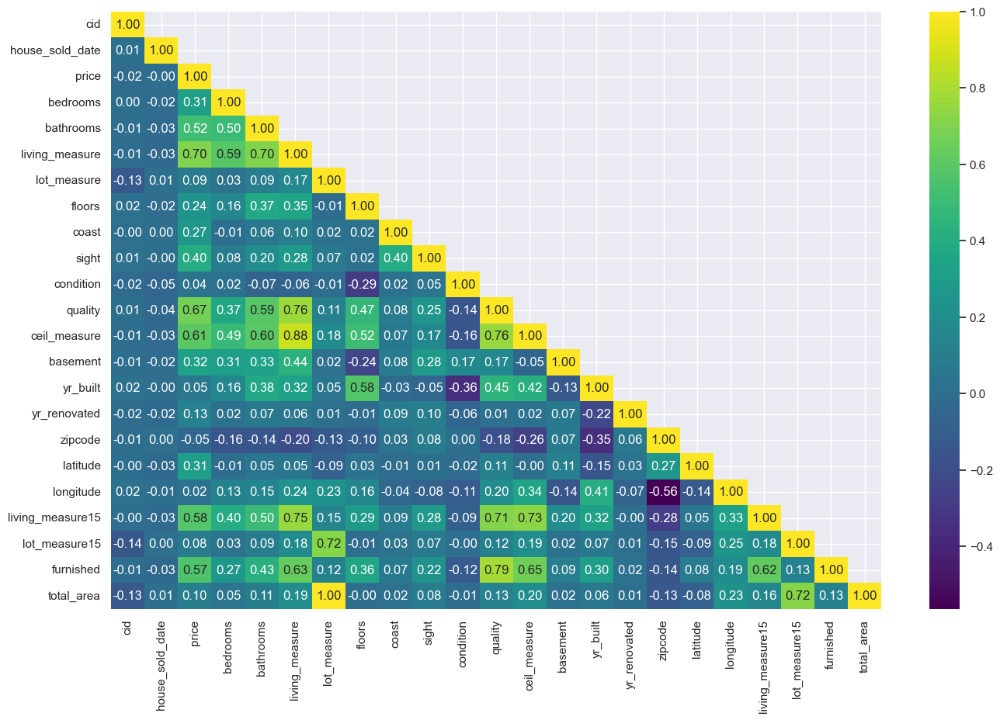

In [698]:
plt.figure(figsize=(16,10))
sns.heatmap(df.corr(), annot=True, fmt='.2f', mask=np.triu(df.corr(),+1), cbar=True, cmap='viridis');
plt.show()

## Observations from the Correlation Heatmap:

**1 - Price Correlation:**

* The strongest correlation with price is with quality (0.67), living_measure (0.70), and ceil_measure (0.64). This indicates that higher quality houses, larger living areas, and higher ceiling measures are associated with higher prices.

* Moderate correlations are observed with bathrooms (0.52), bedrooms (0.31), floors (0.37), coast (0.27), and sight (0.40). These features also contribute positively to the price but to a lesser extent.

**2 - Living Measure:**

living_measure shows a strong positive correlation with ceil_measure (0.88) and quality (0.76), indicating that larger living spaces often have higher ceiling measures and better quality.

**3 - Total Area:**

total_area shows strong correlations with living_measure (0.72) and lot_measure (0.62), which is expected as the total area comprises these components.

**4 - Bathrooms and Bedrooms:**

bathrooms have a stronger correlation with price (0.52) compared to bedrooms (0.31). This suggests that the number of bathrooms in a house may be a more critical factor in determining the price than the number of bedrooms.

**5 - Year Built and Year Renovated:**

* yr_built shows a slight positive correlation with price (0.18), indicating newer houses may be priced higher.

* yr_renovated has a weaker correlation with price (0.02), suggesting that renovations have a less significant impact on price compared to other features.

**6 - Other Observations:**

* Features like zipcode, latitude, and longitude have relatively low correlations with price, suggesting that location details, while important, may not directly impact the price as much as the physical characteristics of the house.

* condition has a weak negative correlation with price (-0.06), indicating that better condition slightly reduces the price, which could be counterintuitive and might require further investigation.

### Bivariate Analysis on Categorical Variable

Bivariate for Feature: furnished column

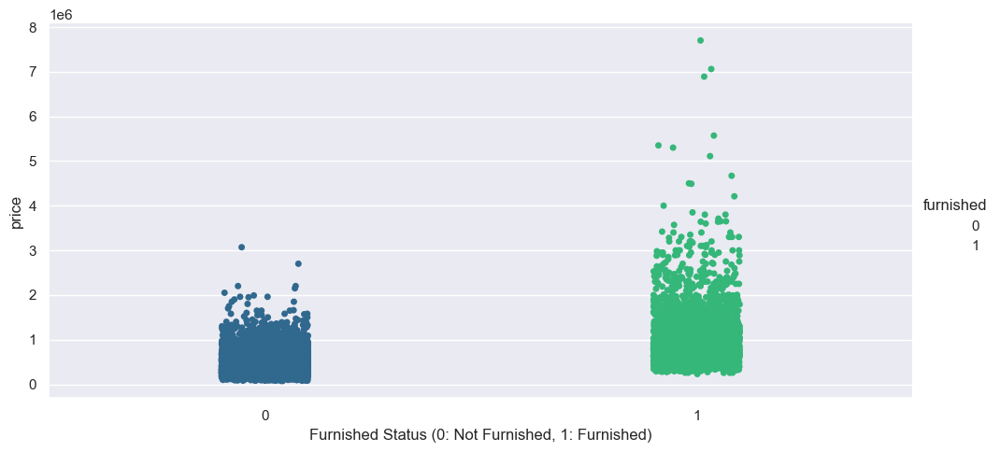

In [699]:
sns.catplot(
    x='furnished',  # Categorical variable on x-axis (0: not furnished, 1: furnished)
    y='price',      # Numerical variable on y-axis (price)
    data=df,         # DataFrame containing the data
    aspect=2,        # Set the aspect ratio of the plot (width is twice the height)
    kind='strip',    # Create a strip plot to show individual data points
    palette='viridis'  # Use the viridis color palette for the data points
)

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=0)

# Add labels to x-axis ticks for clarity (optional)
plt.xlabel('Furnished Status (0: Not Furnished, 1: Furnished)')

# Display the plot
plt.show()

**Observation:** Furnished houses tend to have higher prices compared to unfurnished houses, with more instances of high-value properties in the furnished category.

Bivariate for Feature: Coast column

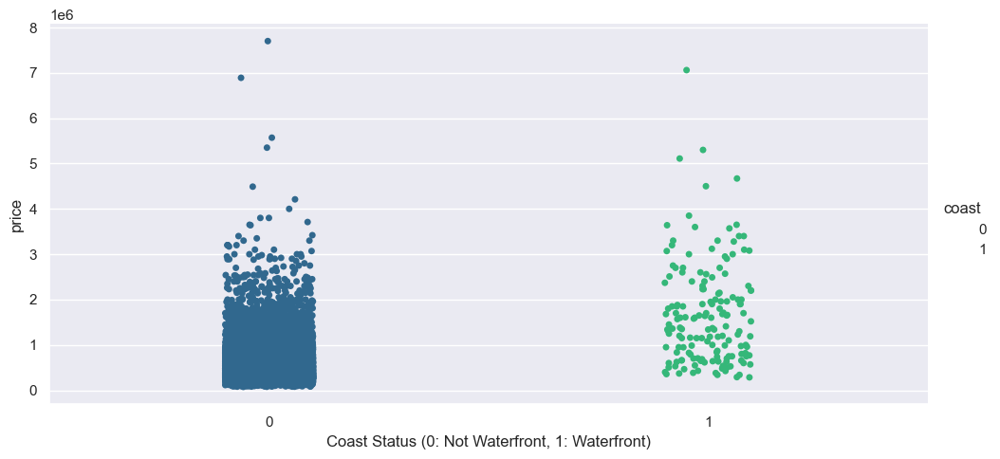

In [700]:
sns.catplot(
    x='coast',         # Categorical variable on x-axis (0: House has not a Waterfront view, 1: house has a waterfront view)
    y='price',         # Numerical variable on y-axis (price)
    data=df,           # DataFrame containing the data
    aspect=2,          # Set the aspect ratio of the plot (width is twice the height)
    kind='strip',      # Create a strip plot to show individual data points
    palette='viridis'  # Use the viridis color palette for the data points
)

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=0)

# Add labels to x-axis ticks for clarity (optional)
plt.xlabel('Coast Status (0: Not Waterfront, 1: Waterfront)')

# Display the plot
plt.show()

**Observation:**
* Houses located on the waterfront (coast status 1) generally have higher prices compared to houses that are not on the waterfront (coast status 0).
* There is a noticeable concentration of higher-priced properties among waterfront homes, indicating that proximity to the coast significantly influences house prices.


## Bivariate Analysis on Continouse Variables

Bivariate for Feature: bedrooms

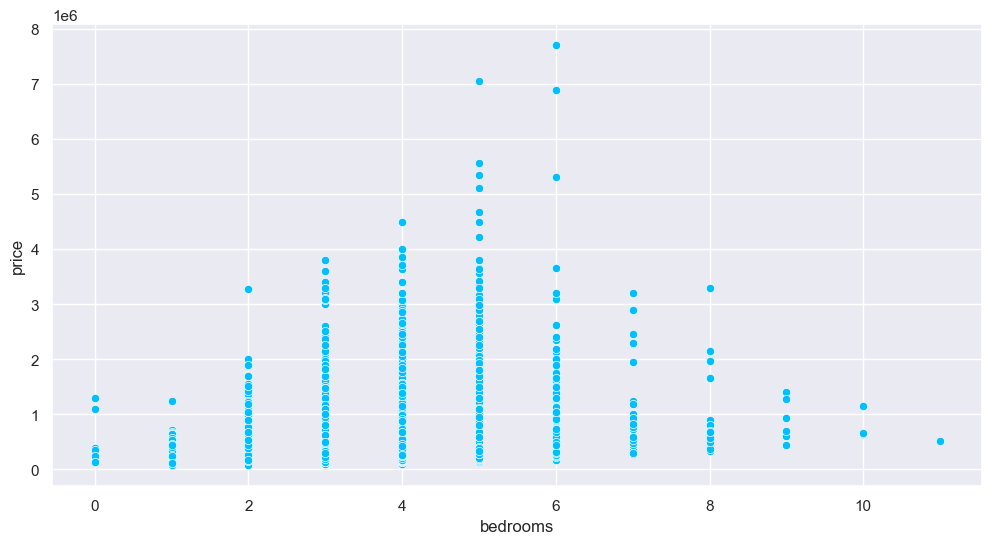

,mean,median,size
bedrooms,,,
3.0,4.667739e+05,414700.0,9876
4.0,6.357284e+05,549950.0,6854
2.0,4.013572e+05,373500.0,2747
5.0,7.867329e+05,619000.0,1595
6.0,8.274895e+05,652500.0,270
1.0,3.189286e+05,299000.0,197
7.0,9.514478e+05,728580.0,38
0.0,4.102231e+05,288000.0,13
8.0,1.105077e+06,700000.0,13


In [701]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='bedrooms', y='price', data=df_num, color='deepskyblue')
plt.show()

# Group By
df_num.groupby('bedrooms')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations:**
1.	Scatter Plot (Price vs. Bedrooms):
* The majority of houses have between 1 and 6 bedrooms.
* There is a wide range of prices for houses with 3 to 6 bedrooms, with some houses priced very high.
* A few outliers exist, such as a house with 33 bedrooms and a house with a high price despite having fewer bedrooms.
* There seems to be a general trend that as the number of bedrooms increases, the price also increases, but this trend does not hold consistently across all data points.

2.	Summary Statistics (Bedrooms):
* The mean and median prices for houses increase as the number of bedrooms increases, up to around 6 bedrooms, after which the pattern becomes less consistent due to fewer data points.

* The majority of houses have 3 or 4 bedrooms, which also have the highest counts.

* Outliers such as the house with 33 bedrooms have a lower price than expected, which is unusual.

**Key Points:**

* Trend with Bedrooms: There is a general trend of increasing price with an increasing number of bedrooms, but this trend is not strictly linear due to various factors like location, condition, and size.

* Outliers: The house with 33 bedrooms and a few other points are outliers that do not follow the general trend.

* Data Distribution: Most houses are concentrated around 3 to 6 bedrooms, which is likely the most common configuration in the dataset.


Bivariate for Feature: bathrooms column

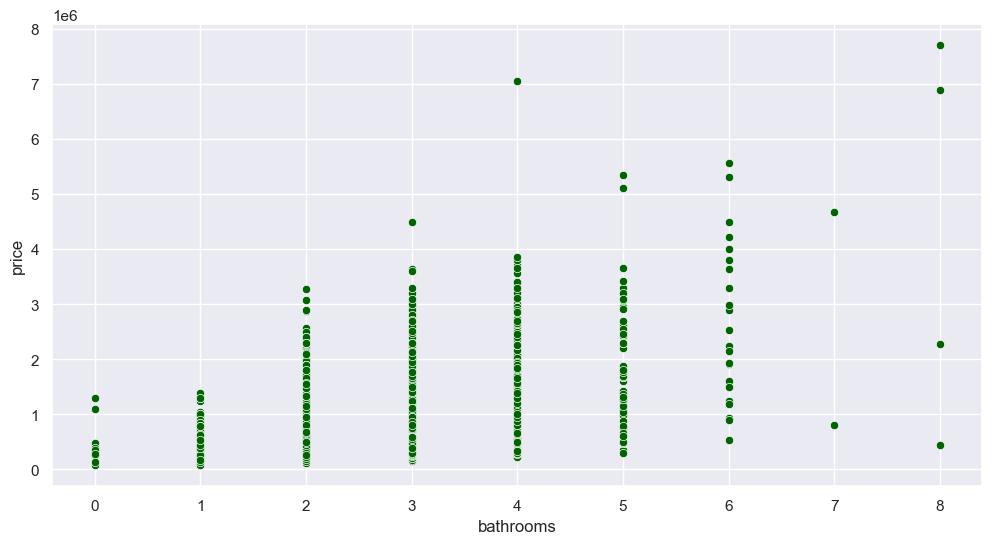

,mean,median,size
bathrooms,,,
2.0,5.006198e+05,450000.0,13892
1.0,3.467531e+05,320000.0,3910
3.0,7.474751e+05,649500.0,2516
4.0,1.078614e+06,914577.0,1194
5.0,1.847437e+06,1680000.0,57
6.0,2.603958e+06,2195000.0,24
0.0,3.886036e+05,276500.0,14
8.0,4.330000e+06,4585000.0,4
7.0,2.735000e+06,2735000.0,2


In [702]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='bathrooms',y='price', data=df_num, color ='darkgreen')
plt.show()

# Group By
df_num.groupby('bathrooms')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations:**

**1. Mean and Median Prices:**
* Homes with 2 bathrooms are the most common, with a mean price of approximately 500,619.80 and a median price of 450,000.

* As the number of bathrooms increases, the mean and median prices generally increase as well, indicating a positive relationship between the number of bathrooms and house prices.

* Homes with the highest number of bathrooms (8) have a significantly higher mean price of approximately $4,330,000.

**2. Size of Data Points:**
* The majority of homes have 2 or 3 bathrooms, representing the bulk of the dataset.
* The number of homes decreases as the number of bathrooms increases beyond 3, with very few homes having more than 5 bathrooms.

**3. Scatter Plot:**
* The scatter plot shows a general trend where houses with more bathrooms tend to have higher prices, although there is significant variability within each category.
* There are outliers, especially for homes with 2 to 4 bathrooms, where some homes have extremely high prices compared to others in the same category.

**Key Point:**

There is a positive correlation between the number of bathrooms and house prices, indicating that homes with more bathrooms generally have higher prices. However, the relationship is not perfectly linear, as seen from the wide range of prices within each bathroom category, suggesting other factors also influence house prices.


Bivariate for Feature: living_measure column

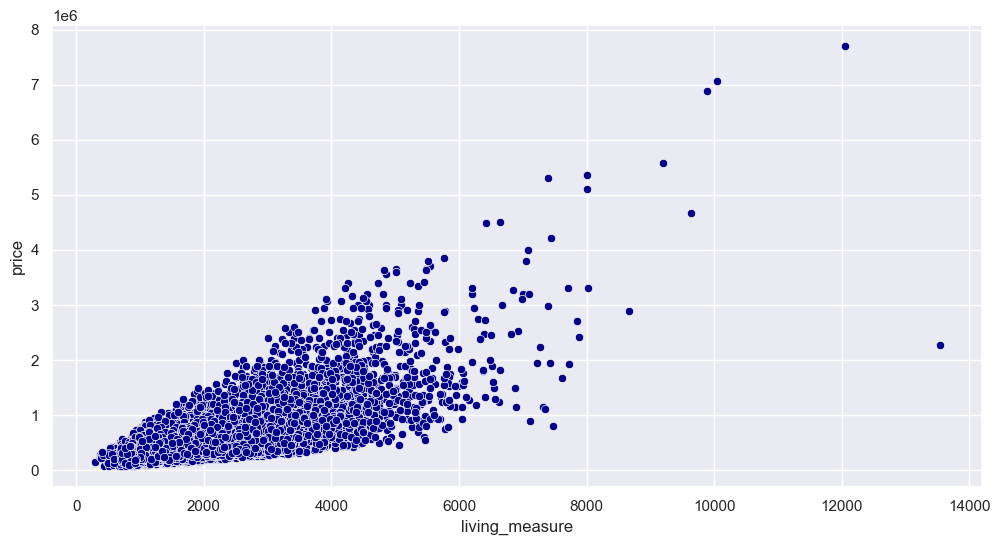

,mean,median,size
living_measure,,,
1300.0,3.750373e+05,340750.0,138
1400.0,3.581005e+05,330000.0,135
1440.0,3.835625e+05,375000.0,133
1660.0,4.272200e+05,405000.0,129
1010.0,3.087452e+05,290000.0,129
...,...,...,...
2456.0,3.299500e+05,329950.0,1
2473.0,3.430000e+05,343000.0,1
2478.0,3.860000e+05,386000.0,1


In [703]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='living_measure',y='price', data=df_num, color='darkblue')
plt.show()

# Group By
df_num.groupby('living_measure')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observation:**

**1 - Scatter Plot:** The scatter plot shows a positive correlation between living_measure (living area in square feet) and price. As the living area increases, the price generally increases, indicating that larger homes tend to have higher prices.

**2 - Summary Statistics:** The table summarizes the mean, median, and the number of houses (size) for different values of living_measure. It shows that the mean and median prices generally increase as the living area increases. However, there is significant variability at each level of living measure.

**Key Points:**
* There is a strong positive correlation between the living area (living_measure) and house price, suggesting that larger homes are more expensive.

* Most data points are concentrated in the lower range of living area, with fewer houses having very large living areas.

* Outliers are present, especially in the higher range of living area, where some houses have significantly higher prices.

* The summary statistics support the trend observed in the scatter plot, with mean and median prices increasing with living area.

Bivariate for Feature: lot_measure column

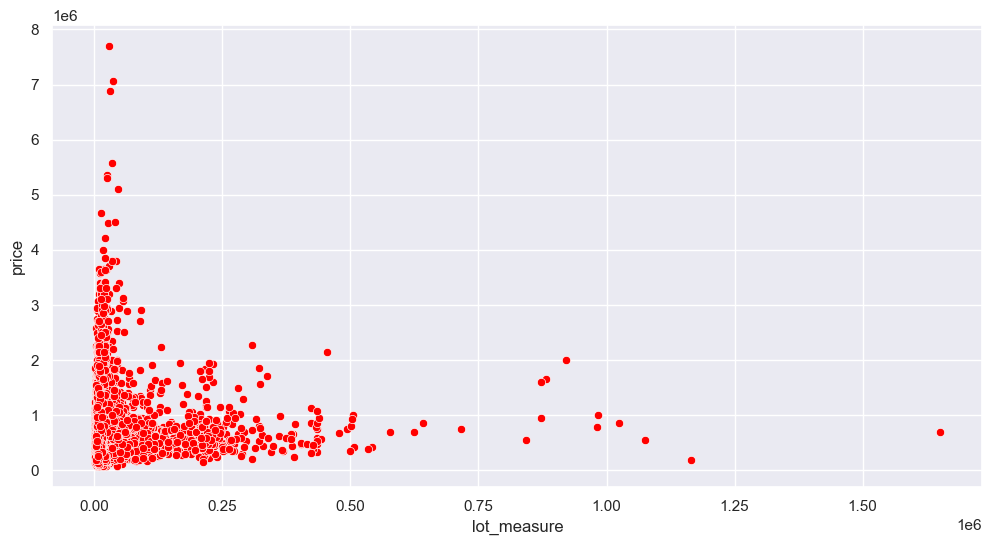

,mean,median,size
lot_measure,,,
5000.0,602830.229050,576875.0,358
6000.0,540565.127586,473000.5,290
4000.0,618036.286853,570000.0,251
7200.0,515300.209091,430500.0,220
4800.0,553745.708333,497500.0,120
...,...,...,...
8133.0,510000.000000,510000.0,1
8132.0,442200.000000,442200.0,1
8128.0,234000.000000,234000.0,1


In [704]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='lot_measure',y='price', data=df_num, color='red')
plt.show()

# Group By
df_num.groupby('lot_measure')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations:**
**Lot Measure vs. Price:**

* The scatter plot of lot measure (size of the lot in square feet) against price shows a less clear relationship.

* A significant number of properties have smaller lot sizes, and there is
a wide range of prices within this group.

* For larger lot sizes, the prices vary widely, but there are fewer properties with very large lot sizes.

**Key Points:**

Lot Size as a Weaker Predictor: Lot size has a more dispersed relationship with price, indicating that other factors, such as location or property features, might play a significant role in determining price alongside lot size.


Bivariate for Feature: floors column

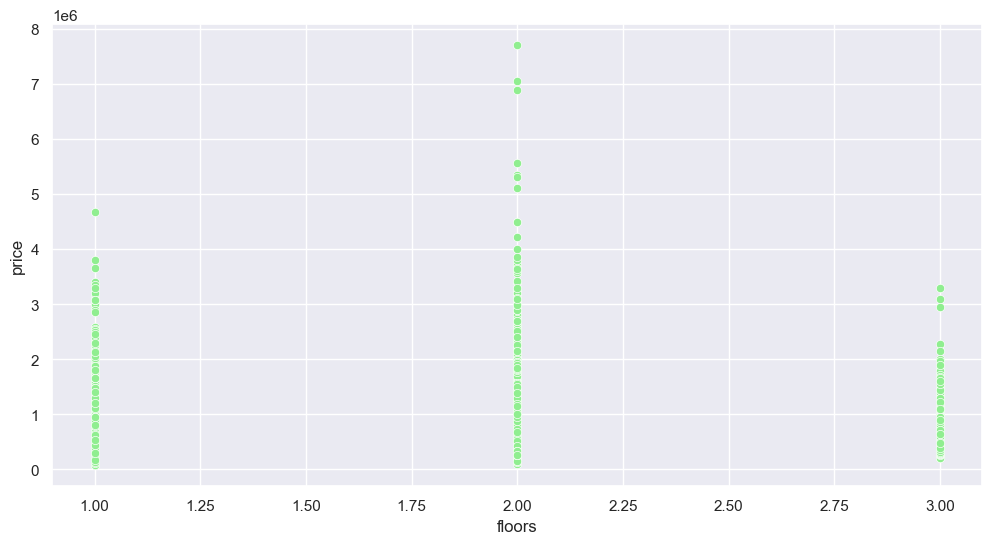

,mean,median,size
floors,,,
1,460366.862643,402750.0,12624
2,657043.138454,549000.0,8371
3,587666.038835,493500.0,618


In [705]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='floors',y='price', data=df_num, color='lightgreen')
plt.show()

# Group By
df_num.groupby('floors')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations:**

**Floors 1:**

* Mean price: 460,366
* Median price: 402,750
* Sample size: 12,624

**Floors 2:**

* Mean price: 657,043
* Median price: 549,000
* Sample size: 8,371

**Floors 3:**

* Mean price: 587,666
* Median price: 493,500
* Sample size: 618

**Scatter Plot Observations:**

* There is a clear trend where properties with more floors generally have higher prices.

* Most data points are concentrated at properties with 1 and 2 floors, with relatively fewer properties having 3 floors.

* Properties with 2 floors have the highest mean and median prices.

**Key Points:**
* Properties with 2 floors have the highest average price, suggesting they might be more desirable or have better features.

* Properties with 1 floor are the most common, which might indicate a larger market for single-floor properties.

* The small sample size for 3-floor properties could indicate they are less common, but their prices are still relatively high.

* The scatter plot also shows that there are some high-value outliers, especially for properties with 2 floors.

Bivariate for Feature: sight column

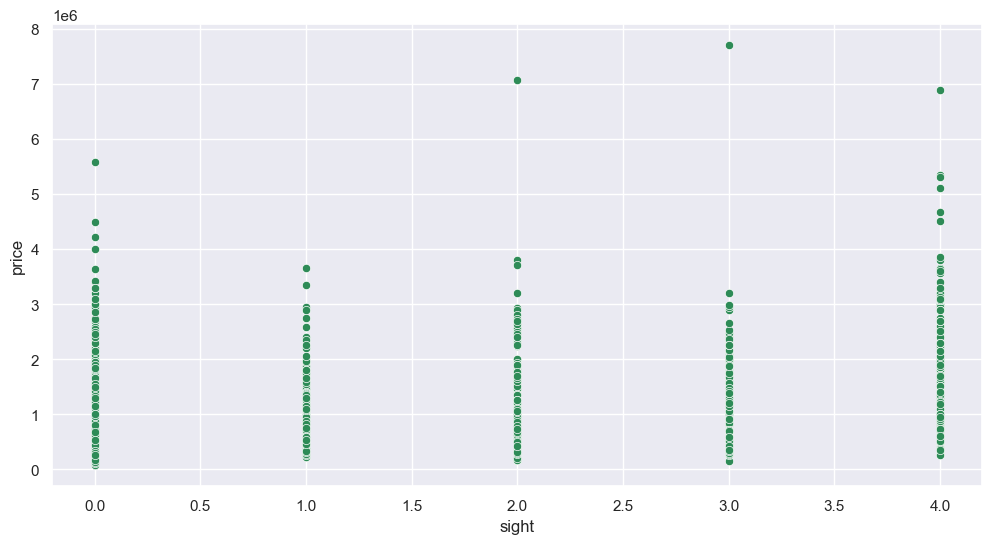

,mean,median,size
sight,,,
0,4.967417e+05,432500.0,19494
2,7.918609e+05,675000.0,959
3,9.724684e+05,802500.0,510
1,8.125186e+05,690944.0,332
4,1.466554e+06,1190000.0,318


In [706]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='sight',y='price', data=df_num, color ='seagreen')
plt.show()

# Group By
df_num.groupby('sight')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations: -**

**Sight 0:**
 * Mean price: 496,741
 * Median price: 432,500
 * Sample size: 19,494

**Sight 1:**
 * Mean price: 812,519
 * Median price: 690,944
 * Sample size: 332

**Sight 2:**
 * Mean price: 791,861
 * Median price: 675,000
 * Sample size: 959

**Sight 3:**
 * Mean price: 972,468
 * Median price: 802,500
 * Sample size: 510

**Sight 4:**
 * Mean price: 1,466,554
 * Median price: 1,190,000
 * Sample size: 318

**Scatter Plot Observations:**
* Properties with higher sight ratings (2, 3, and 4) tend to have higher prices.
* There are more properties with a sight rating of 0, and their prices are generally lower.
* The highest prices are associated with sight rating 4, although it's the least common.

**Key Points:**

* Sight rating positively correlates with property price.

* Properties with better views (higher sight ratings) are more expensive but less common.

* The largest sample size is for properties with a sight rating of 0, which have the lowest average prices.


Bivariate for Feature: condition column

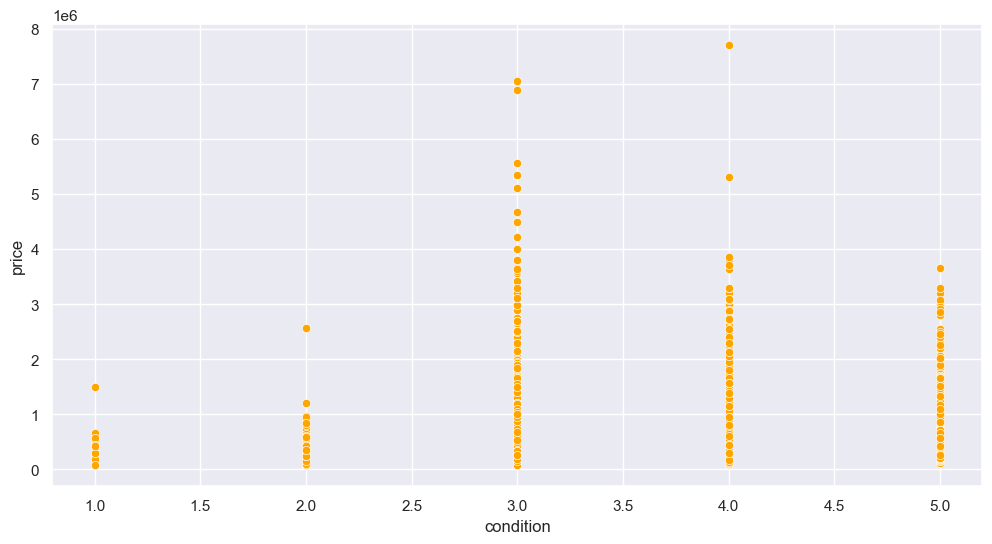

,mean,median,size
condition,,,
3,542364.148048,451000.0,14063
4,520643.219275,440000.0,5655
5,612515.489965,525444.0,1694
2,326423.327485,279000.0,171
1,334431.666667,262500.0,30


In [707]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='condition',y='price', data=df_num, color='orange')
plt.show()

# Group By
df_num.groupby('condition')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations:**

**Condition 3:**
 * Mean price: 542,364
 * Median price: 451,000
 * Sample size: 14,063

**Condition 4:**
 * Mean price: 520,643
 * Median price: 440,000
 * Sample size: 5,655

**Condition 5:**
 * Mean price: 612,515
 * Median price: 525,444
 * Sample size: 1,694

**Condition 2:**
 * Mean price: 326,423
 * Median price: 279,000
 * Sample size: 171

**Condition 1:**
 * Mean price: 334,431
 * Median price: 262,500
 * Sample size: 30

**Scatter Plot Observations:**
* Properties with condition 3 are the most common.
* Prices tend to increase with better property conditions.
* Higher condition ratings (4 and 5) are associated with higher prices, while lower ratings (1 and 2) correspond to lower prices.

**Key Points:**
* Better property condition correlates with higher prices.
* Most properties fall into condition 3, which seems to be the average condition.
* Condition 5 properties have the highest mean and median prices, indicating that buyers are willing to pay a premium for top condition properties.


Bivariate for Feature: quality column

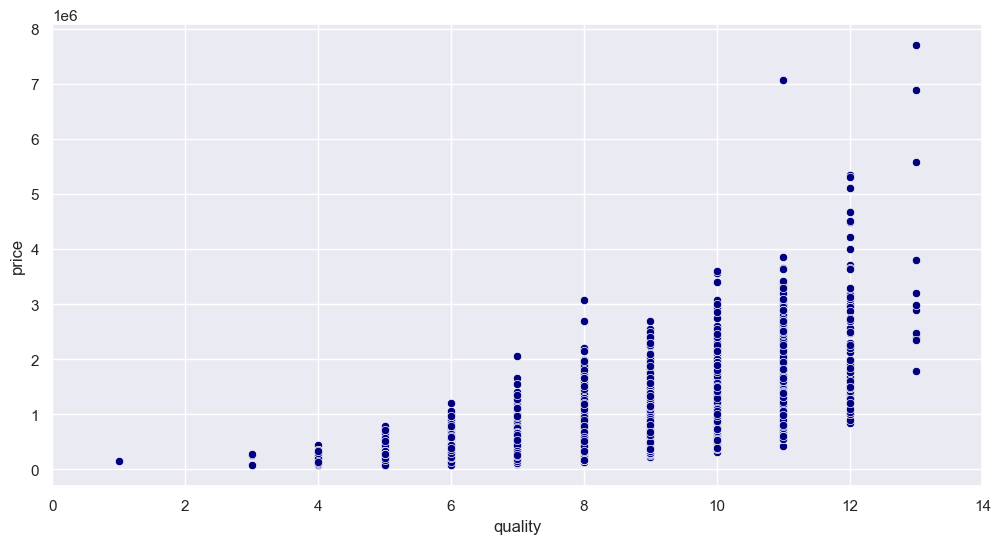

,mean,median,size
quality,,,
7.0,4.025850e+05,375000.0,8982
8.0,5.429310e+05,510000.0,6067
9.0,7.737382e+05,720000.0,2615
6.0,3.019166e+05,275276.5,2038
10.0,1.072347e+06,914327.0,1134
11.0,1.497792e+06,1280000.0,399
5.0,2.485240e+05,228700.0,242
12.0,2.192500e+06,1820000.0,90
4.0,2.143810e+05,205000.0,29


In [708]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='quality',y='price', data=df_num, color='navy')
plt.xlim(0, 14)
plt.show()

# Group By
df_num.groupby('quality')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations:**

**Quality 7:**
 * Mean price: 402,585
 * Median price: 375,000
 * Sample size: 8,982

**Quality 8:**
 * Mean price: 542,931
 * Median price: 510,000
 * Sample size: 6,067

**Quality 9:**
 * Mean price: 773,738
 * Median price: 720,000
 * Sample size: 2,615

**Quality 10:**
 * Mean price: 1,072,347
 * Median price: 914,327
 * Sample size: 1,134

**Quality 11:**
 * Mean price: 1,497,792
 * Median price: 1,280,000
 * Sample size: 399

**Quality 12:**
 * Mean price: 2,192,500
 * Median price: 1,820,000
 * Sample size: 90

* Other quality ratings (1-6, 13) have smaller sample sizes and varying mean and median prices.

**Scatter Plot Observations:**

* There is a positive correlation between quality and price.

* Higher quality properties (especially 10 and above) tend to have significantly higher prices.

* The sample sizes decrease as the quality rating increases.

**Key Points:**

* Property price increases with quality.

* The majority of properties are clustered around quality 7 and 8, which also have moderate prices.

* Higher quality properties (10 and above) are rarer but command much higher prices.


Bivariate for Feature: ceil_measure


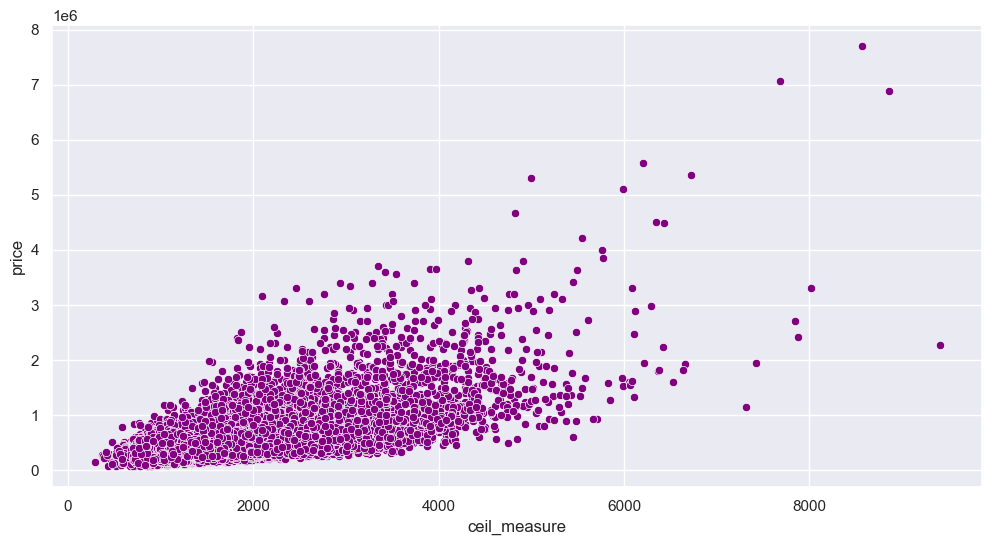

,mean,median,size
ceil_measure,,,
1300.0,4.176971e+05,397750.0,212
1010.0,3.541063e+05,317250.0,210
1200.0,3.549368e+05,334337.5,206
1220.0,4.151394e+05,390000.0,192
1140.0,3.943740e+05,379450.0,184
...,...,...,...
2393.0,4.000000e+05,400000.0,1
2395.0,8.000000e+05,800000.0,1
2398.0,4.000000e+05,400000.0,1


In [709]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='ceil_measure',y='price', data=df_num, color='purple')
plt.show()

# Group By
df_num.groupby('ceil_measure')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observation: -**

**1 - Scatter Plot:**
* There is a positive correlation between ceil_measure and price, meaning as the ceiling measure increases, the price tends to increase.
* There are some outliers with very high ceiling measures and prices.

**2 - Table:**
* The mean and median prices increase with the ceiling measure up to a certain point.
* The size column shows the number of occurrences for each ceiling measure value, with fewer occurrences at higher ceiling measure values.

**Key Points:**

* Larger ceiling measures are associated with higher prices.

* The data has a spread, with more frequent occurrences around lower ceiling measure values.

* There are fewer houses with very large ceiling measures, which might explain the sharp increase


Bivariate for Feature: basement

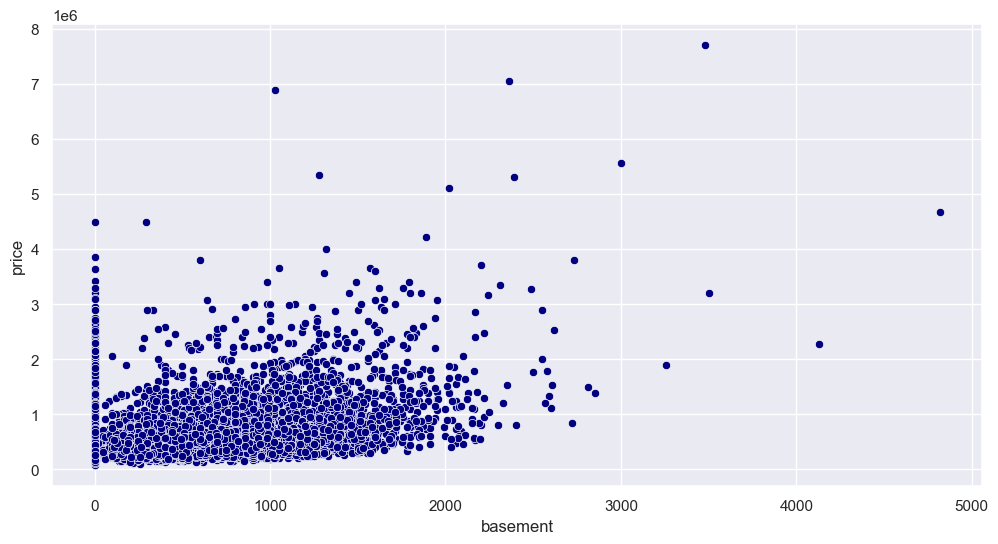

,mean,median,size
basement,,,
0.0,4.869454e+05,411500.0,13126
600.0,5.353525e+05,466000.0,221
700.0,5.690515e+05,500000.0,218
500.0,4.794896e+05,425500.0,214
800.0,6.017079e+05,526063.0,206
...,...,...,...
176.0,2.500000e+05,250000.0,1
207.0,5.260000e+05,526000.0,1
225.0,6.250000e+05,625000.0,1


In [710]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='basement',y='price', data=df_num, color='navy')
plt.show()

# Group By
df_num.groupby('basement')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations and Key Points:**

**1 - Scatter Plot of Basement Size vs Price:**
* There is a positive correlation between the size of the basement and the price of the house. As the basement size increases, the price tends to increase.

* However, a significant number of houses with no basement (basement size 0) are also present, with prices spread across a wide range.
o	Some outliers with very high prices and large basement sizes are observed.

**2 - Summary Statistics for Basement Size:**

* The majority of the houses have no basement, as indicated by the large size (13,126) for a basement size of 0.

* The mean and median prices generally increase with the basement size, indicating that larger basements are associated with higher house prices.

* There are a few unique values of basement sizes (e.g., 176, 207, 225, 946, 4820) with a single observation each, which are likely outliers or special cases.


Bivariate for Feature: yr_built

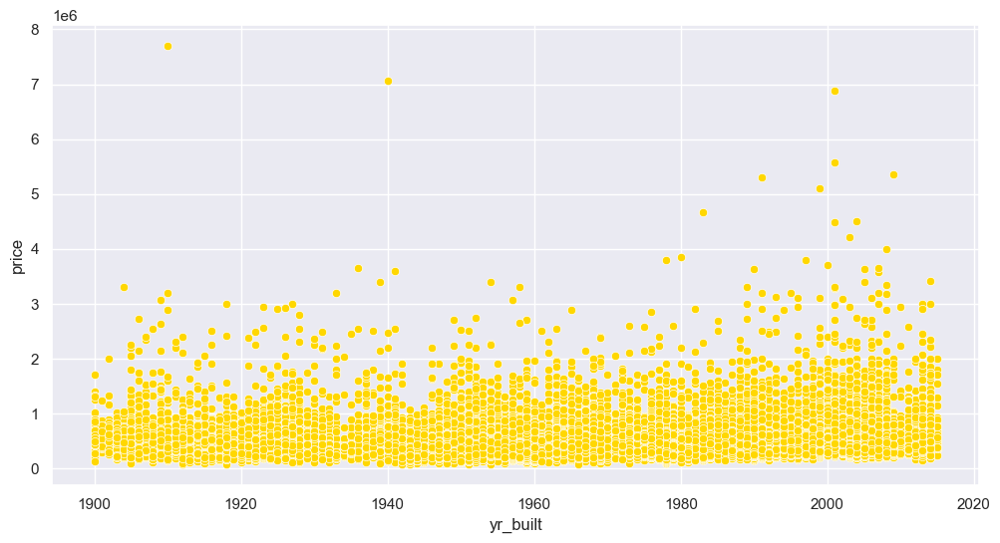

,mean,median,size
yr_built,,,
2014,677006.203833,590962.5,574
2006,631041.548458,510500.0,454
2005,580895.468889,486000.0,450
2004,596095.004619,507000.0,433
2003,559102.035629,451000.0,421
...,...,...,...
1933,772483.333333,402500.0,30
1901,557108.344828,550000.0,29
1902,673192.592593,624000.0,27


In [711]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='yr_built',y='price', data=df_num, color='gold')
plt.show()

# Group By
df_num.groupby('yr_built')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations and Key Points:**

**1. Scatter Plot:**

* The scatter plot shows the relationship between the year a house was built (yr_built) and its price (price).

* There is no clear upward or downward trend in prices over time, indicating that newer houses do not necessarily have higher prices than older ones.

* The majority of house prices are clustered between 0 and 3 million across all years.
* There are some outliers with extremely high prices in both older and newer houses.

**2 - Summary Table:***

* The table provides the mean, median, and number of houses built for each year.

* Houses built in recent years (e.g., 2014, 2006) tend to have higher mean and median prices compared to older houses.

* The size column shows the number of houses built in each year, with more recent years generally having a higher count.


Bivariate for Feature: yr_renovated column

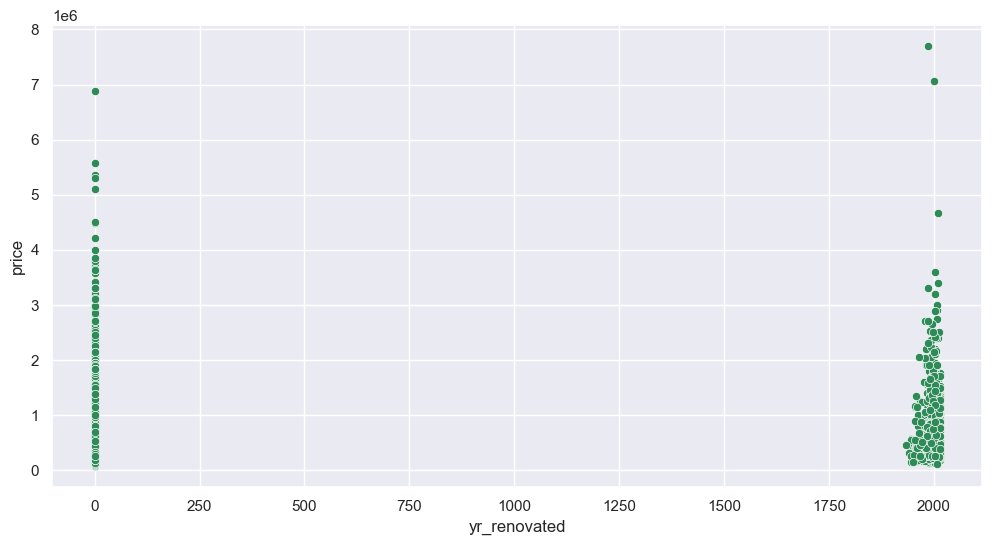

,mean,median,size
yr_renovated,,,
0,530447.958597,448000.0,20699
2014,655030.098901,575000.0,91
2013,664960.810811,560000.0,37
2003,992305.555556,767500.0,36
2007,838922.142857,797000.0,35
...,...,...,...
1951,276000.000000,276000.0,1
1959,397500.000000,397500.0,1
1934,459950.000000,459950.0,1


In [712]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='yr_renovated',y='price', data=df_num, color='seagreen')
plt.show()

# Group By
df_num.groupby('yr_renovated')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

Bivariate for Feature: living_measure15 column

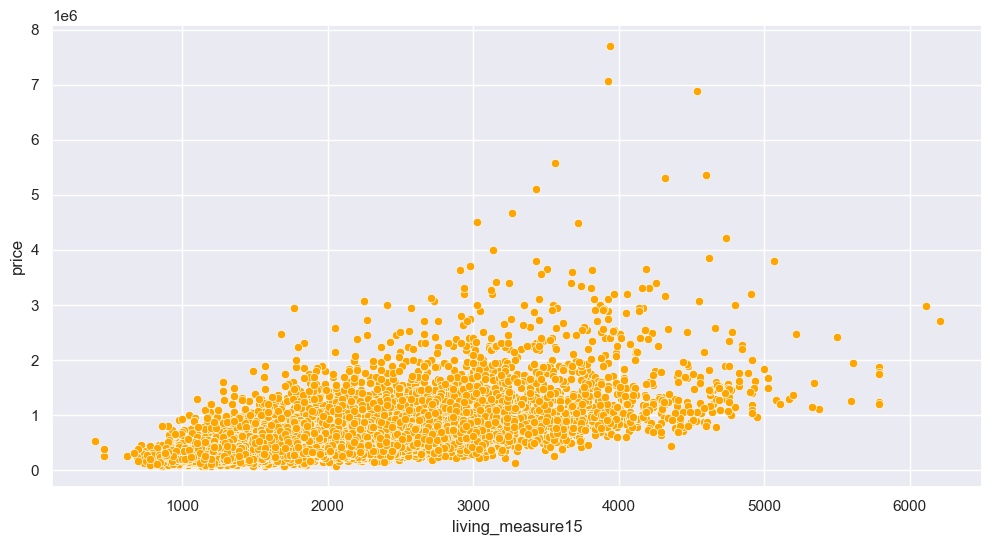

,mean,median,size
living_measure15,,,
1840.0,5.095385e+05,458750.0,278
1540.0,3.893114e+05,350000.0,197
1440.0,4.087101e+05,399950.0,193
1560.0,4.390390e+05,430000.0,192
1500.0,4.151440e+05,377250.0,178
...,...,...,...
2246.0,5.700000e+05,570000.0,1
2238.0,2.575000e+05,257500.0,1
2236.0,2.950000e+05,295000.0,1


In [713]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='living_measure15',y='price', data=df_num, color='orange')
plt.show()

# Group By
df_num.groupby('living_measure15')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Scatter Plot (Price vs. Living Measure) -**

**Positive Correlation:**
There is a positive correlation between the living measure (square footage) and the price. As the living measure increases, the price also tends to increase, though with some variability.

**Variability:** The spread of prices increases as the living measure increases, indicating higher variability in prices for larger properties.

**Outliers:** There are several outliers where the price is significantly higher than most of the data points, especially for properties with larger living measures.

**Table (Statistics for Living Measure) -**

**Mean and Median:** For each living measure, the table shows the mean, median, and the number of properties (size) corresponding to that measure. The mean price is generally higher than the median, suggesting a skew in the distribution of prices.

**Sample Size:** Some living measures have a larger sample size, providing more reliable statistics, while others have very small sample sizes (e.g., 1 property), making those statistics less reliable.

**Price Trends:** As the living measure increases, there is a general trend of increasing mean and median prices, though there are fluctuations, indicating some variability in price even for similar living measures.

Bivariate for Feature: lot_measure15 column

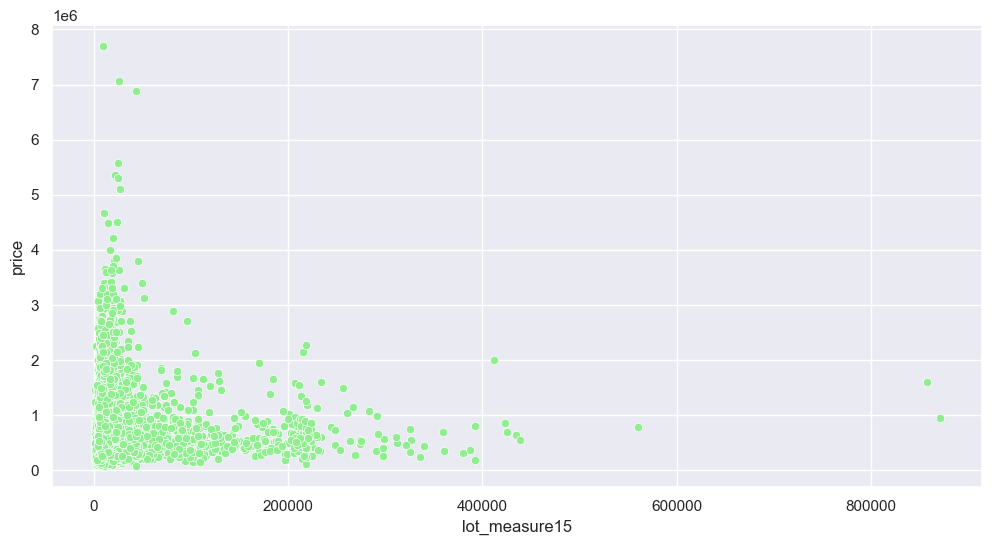

,mean,median,size
lot_measure15,,,
5000.0,593921.871194,554600.0,427
4000.0,624915.899160,580000.0,357
6000.0,502491.937282,445000.0,287
7200.0,522440.521327,395900.0,211
4800.0,578281.524138,530000.0,145
...,...,...,...
8052.0,450000.000000,450000.0,1
8049.0,348000.000000,348000.0,1
8036.0,605000.000000,605000.0,1


In [714]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='lot_measure15',y='price', data=df_num, color='lightgreen')
plt.show()

# Group By
df_num.groupby('lot_measure15')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observations: -**

**Decreasing Density:** Most properties have smaller lot sizes, and as the lot size increases, the density of data points decreases.

**Price Variability:** For smaller lot sizes, there is a wide range of prices, suggesting that other factors (like living space, location, etc.) significantly impact the price in this range.

**Outliers:** There are a few outliers where the lot size is very large (beyond 200,000 square feet) with varying prices, but these are not common.

**Weak Correlation:** There doesn't appear to be a strong correlation between lot size and price in this plot. Larger lot sizes do not consistently correspond to higher prices.

**Key Points:**

* **Small Lot Sizes Dominate:** Most of the properties have lot sizes below 50,000 square feet.

* **Price Range for Small Lots:** Even for small lots, prices vary significantly, indicating that factors other than lot size are influencing the price.

* **Few Large Lots:** Properties with very large lot sizes are rare and do not show a consistent trend in terms of price.

Bivariate for Feature: total_area column

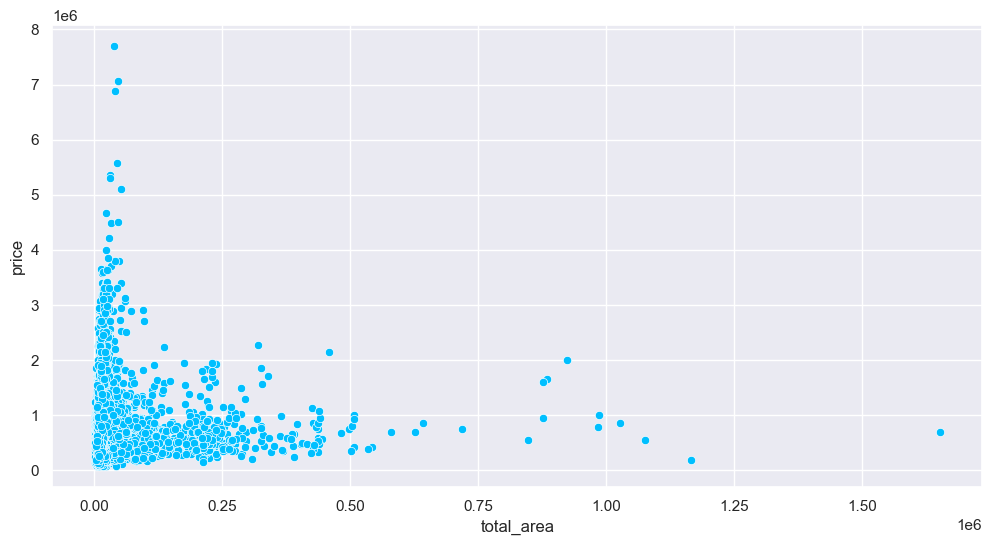

,mean,median,size
total_area,,,
5940.0,473966.473684,473975.0,19
6770.0,430663.210526,395000.0,19
9820.0,445486.842105,410000.0,19
8750.0,490226.052632,375000.0,19
7330.0,534921.052632,590000.0,19
...,...,...,...
10533.0,460000.000000,460000.0,1
10529.0,640000.000000,640000.0,1
10528.0,450000.000000,450000.0,1


In [715]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='total_area',y='price', data=df_num, color='deepskyblue')
plt.show()

# Group By
df_num.groupby('total_area')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observation and Key Points:**

**1 - Scatter Plot:** The scatter plot shows the relationship between total_area and price. There is a general trend that as the total_area increases, the price also tends to increase, but the relationship is not strictly linear. Most data points are concentrated in lower total_area values, with prices ranging from lower to moderate.

**2 - Data Summary:** The table presents the mean, median, and size of data points for different total_area values. The mean and median values indicate that as the total_area increases, there is a tendency for the mean price to increase, although this is not consistent across all total_area values.

**Key Points:**

* Trend: There's a positive correlation between total_area and price, although the spread of prices suggests other factors may also significantly influence price.

* Outliers: There are some high-priced outliers, especially for higher total_area values, indicating that exceptionally large areas might command significantly higher prices.

* Distribution: The majority of data points are clustered around lower total_area values, suggesting smaller properties are more common in the dataset.


Bivariate for Feature: house_sold_date ( Date, Time) column

<Figure size 1200x1000 with 0 Axes>

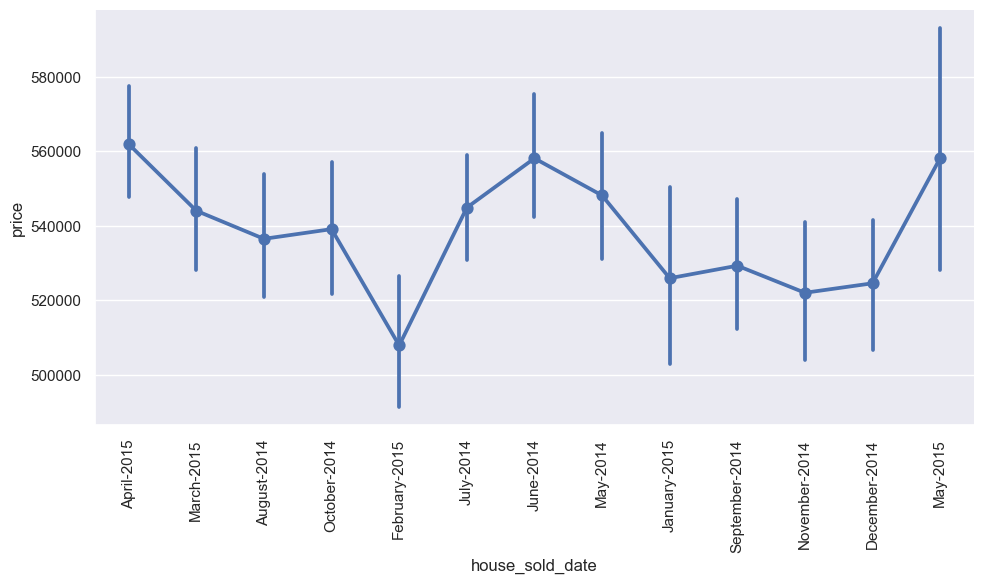

,mean,median,size
house_sold_date,,,
April-2015,561933.463021,476500.0,2231
July-2014,544892.161013,465000.0,2211
June-2014,558123.736239,465000.0,2180
August-2014,536527.039691,442100.0,1940
October-2014,539127.477636,446900.0,1878
March-2015,544057.683200,450000.0,1875
September-2014,529315.868095,450000.0,1774
May-2014,548166.600113,465000.0,1768
December-2014,524602.893270,432500.0,1471


In [716]:
# Extract month and year in the desired format
df['house_sold_date'] = pd.to_datetime(df['house_sold_date'])
df['house_sold_date'] = df['house_sold_date'].dt.strftime('%B-%Y')

plt.figure(figsize=(12,10))
sns.catplot(x='house_sold_date',y='price', data=df, kind='point', aspect=2)
plt.xticks(rotation=90)
plt.show()

# Groupby
df.groupby('house_sold_date')['price'].agg(['mean','median','size']).sort_values(by='size',ascending=False)

**Observation and Key Point:**

**Observation:**

* The graph shows the average house prices over different months from mid-2014 to mid-2015.

* There is a notable fluctuation in the house prices across these months.
* Prices peaked in April 2015 and June 2014, with a low point in February 2015.

**Key Point:**
* House prices tend to exhibit seasonal variations, with higher prices in certain months, possibly due to increased demand or market conditions.

* The mean price generally hovers around 540,000 to 560,000, with variations across months.

In [717]:
df.columns

Index(['cid', 'house_sold_date', 'price', 'bedrooms', 'bathrooms',
       'living_measure', 'lot_measure', 'floors', 'coast', 'sight',
       'condition', 'quality', 'ceil_measure', 'basement', 'yr_built',
       'yr_renovated', 'zipcode', 'latitude', 'longitude', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area'],
      dtype='object')

#### Missing Value treatment (if applicable)

Missing Value treatment (if applicable) - We have already treated the missing values using domain knowledge and mean and mode and median technqiue.

### Add New columns in Dataset

Add New Column is_renovated

In [718]:
# Getting the measure of how long the house has not been renovated
df['is_renovated'] = int(0)
for index,row in df.iterrows():
    if row['yr_renovated']!=int(0):
        df.at[index,'is_renovated']=int(1)

df[['yr_built','yr_renovated','is_renovated']].head(20)

,yr_built,yr_renovated,is_renovated
0,1966,0,0
1,1948,0,0
2,1966,0,0
3,2009,0,0
4,1924,0,0
5,1994,0,0
6,2005,0,0
7,2005,0,0
8,1978,0,0
9,1983,0,0


Add New Column Region

In [719]:
print('Max-'+ str(df['zipcode'].max()) +'Min-'+str(df['zipcode'].min()) +
'Range-'+str(df['zipcode'].max()-df['zipcode'].min()))

Max-98199Min-98001Range-198


In [720]:
# Divid the zip code based on Region Codes of 1-10

df['region code']= int(0)
for index,row in df.iterrows():
    if row["zipcode"]%1000 in range(0,20):
        df.at[index,'region code'] = int(1)
    elif row["zipcode"]%1000 in range(20,40):
        df.at[index,'region code'] = int(2)
    elif row["zipcode"]%1000 in range(40,60):
        df.at[index,'region code'] = int(3)
    elif row["zipcode"]%1000 in range(60,80):
        df.at[index,'region code'] = int(4)
    elif row["zipcode"]%1000 in range(80,100):
        df.at[index,'region code'] = int(5)
    elif row["zipcode"]%1000 in range(100,120):
        df.at[index,'region code'] = int(6)
    elif row["zipcode"]%1000 in range(120,140):
        df.at[index,'region code'] = int(7)
    elif row["zipcode"]%1000 in range(140,160):
        df.at[index,'region code'] = int(8)
    elif row["zipcode"]%1000 in range(160,180):
        df.at[index,'region code'] = int(9)
    elif row["zipcode"]%1000 in range(180,200):
        df.at[index,'region code'] = int(10)

In [721]:
df[["zipcode","region code"]].head(20)

,zipcode,region code
0,98034,2
1,98118,6
2,98118,6
3,98002,1
4,98118,6
5,98030,2
6,98103,6
7,98006,1
8,98042,3
9,98031,2


Add New Column years_old

In [722]:
# Ensure 'house_sold_date' is in datetime format
df['house_sold_date'] = pd.to_datetime(df['house_sold_date'])

# Create a 'Age_of_house' Column
df['Age_of_house'] = df['house_sold_date'].dt.year - df['yr_built']

# Display the first few Rows
print(df[['Age_of_house']].head())

   Age_of_house
0            49
1            67
2            48
3             5
4            91


Add New Column having_basement

In [723]:
# Create the 'is_basement' column
df['having_basement'] = df['basement'].apply(lambda x: 0 if x == 0 else 1)

# Display the first few rows to verify
print(df[['basement', 'having_basement']].head())

   basement  having_basement
0    1250.0                1
1       0.0                0
2       0.0                0
3       0.0                0
4       0.0                0


Make a Copy of Orignal DataFrame for Other Analysis

In [724]:
new_df = df.copy()

### Removal of Unwanted Variables

In [725]:
df = df.drop(['cid', 'longitude', 'latitude', 'house_sold_date',
              'zipcode', 'yr_built', 'yr_renovated', 'living_measure15',
              'lot_measure15', 'region code', 'basement'], axis=1)

We have droped these columns

In [726]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   price            21613 non-null  int64  
 1   bedrooms         21613 non-null  float64
 2   bathrooms        21613 non-null  float64
 3   living_measure   21613 non-null  float64
 4   lot_measure      21613 non-null  float64
 5   floors           21613 non-null  int32  
 6   coast            21613 non-null  object 
 7   sight            21613 non-null  int32  
 8   condition        21613 non-null  int32  
 9   quality          21613 non-null  float64
 10  ceil_measure     21613 non-null  float64
 11  furnished        21613 non-null  object 
 12  total_area       21613 non-null  float64
 13  is_renovated     21613 non-null  int64  
 14  Age_of_house     21613 non-null  int32  
 15  having_basement  21613 non-null  int64  
dtypes: float64(7), int32(4), int64(3), object(2)
memory usage:

### Check the Outlier

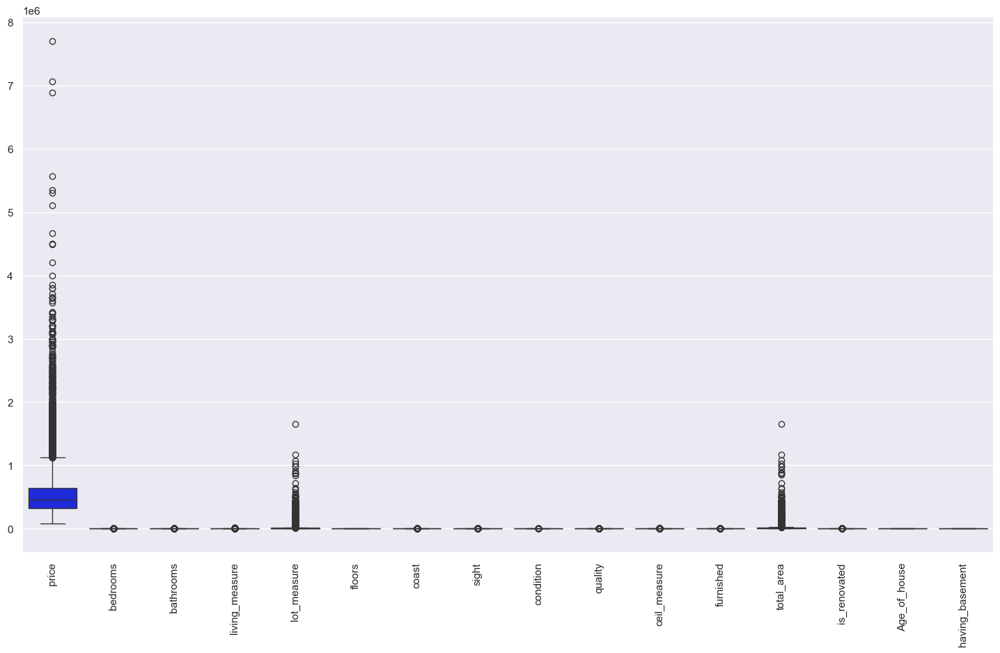

In [727]:
plt.figure(figsize=(18,10))
sns.boxplot(data=df, orient='v', palette='winter')
plt.xticks(rotation=90)
plt.show()

Based on the box plot you provided, here are some key observations:
1.	Price Outliers: There are several outliers in the price column, with some houses priced significantly higher than the majority.

2.	Living Measure Outliers: The living_measure feature also shows a considerable number of outliers, indicating some homes have much larger living areas compared to the rest.

3.	Lot Measure Outliers: The lot_measure column exhibits a few extreme outliers, which means there are properties with exceptionally large lot sizes.

4.	Total Area Outliers: Similar to the living_measure and lot_measure, the total_area feature has outliers indicating homes with unusually large total areas.

5.	Other Features: For most of the other features like bedrooms, bathrooms, floors, coast, sight, condition, quality, etc., the data points are more concentrated around the median, with fewer or no significant outliers.

Overall, the outliers in price, living_measure, lot_measure, and total_area might require further investigation or potential handling depending on the analysis objective.

Outlier treatment (if required) – We will treat the outlier using IQR (Interquartile Range) technique.


### Check Outlier


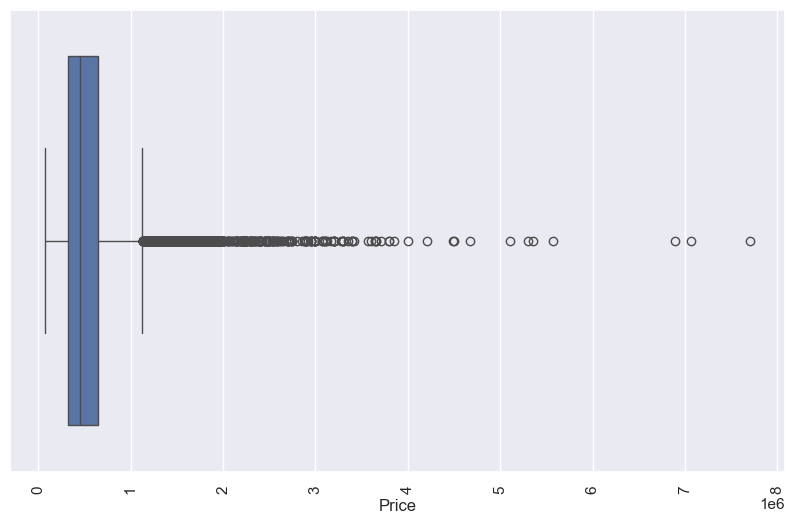

In [728]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, orient='h', x='price')
plt.xlabel('Price')
plt.xticks(rotation=90)
plt.show()

plt.figure(figsize=(10,6))
sns.boxplot(data=df, orient='h', x='basement')
plt.xticks(rotation=90)
plt.show()

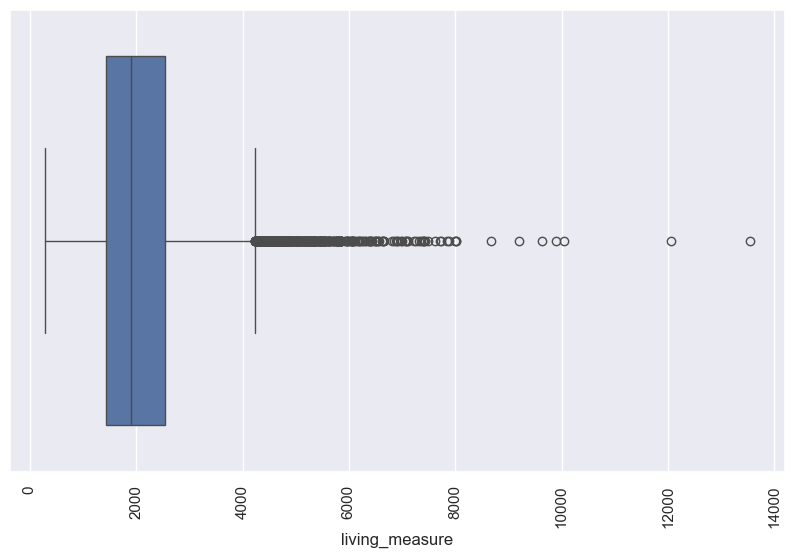

In [729]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, orient='h', x='living_measure')
plt.xticks(rotation=90)
plt.show()

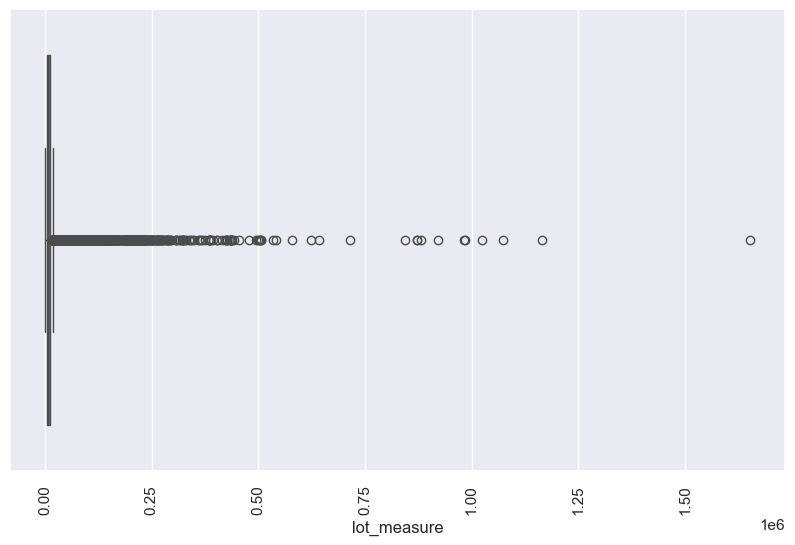

In [730]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, orient='h', x='lot_measure')
plt.xticks(rotation=90)
plt.show()

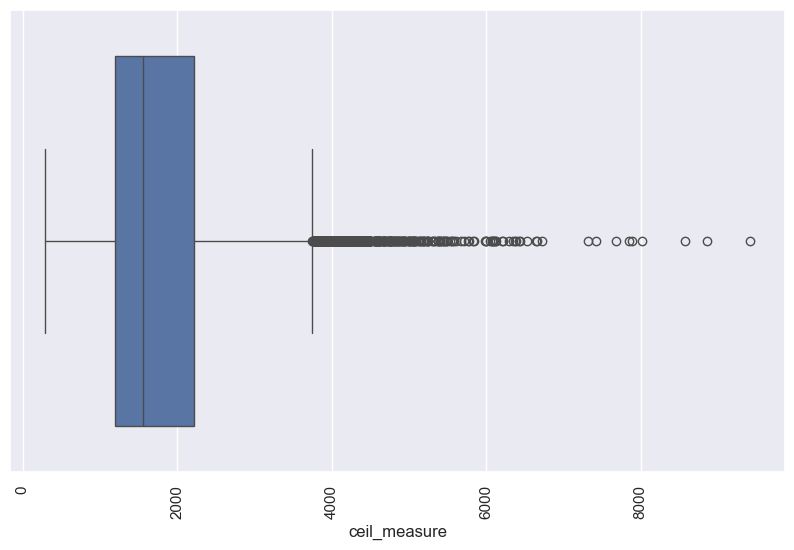

In [731]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, orient='h', x='ceil_measure')
plt.xticks(rotation=90)
plt.show()

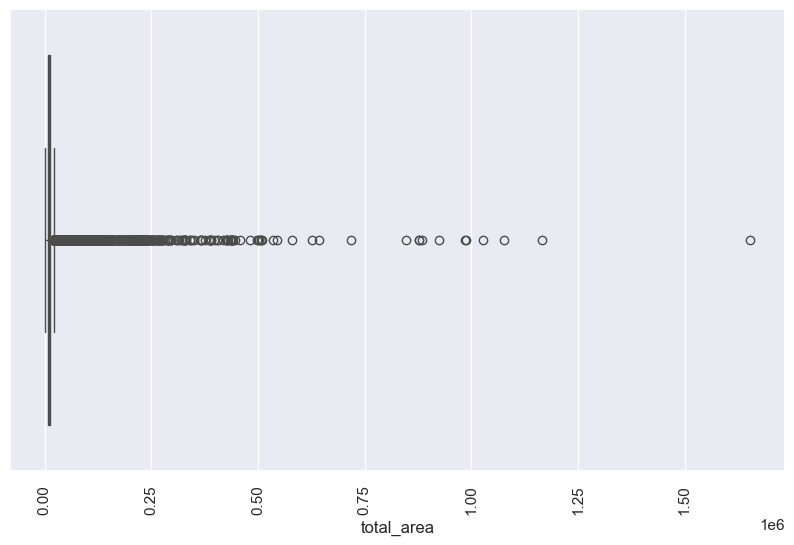

In [732]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, orient='h', x='total_area')
plt.xticks(rotation=90)
plt.show()

In [733]:
df.head()

,price,bedrooms,bathrooms,living_measure,lot_measure,floors,coast,sight,condition,quality,ceil_measure,furnished,total_area,is_renovated,Age_of_house,having_basement
0,600000,4.0,2.0,3050.0,9440.0,1,0,0,3,8.0,1800.0,0,12490.0,0,49,1
1,190000,2.0,1.0,670.0,3101.0,1,0,0,4,6.0,670.0,0,3771.0,0,67,0
2,735000,4.0,3.0,3040.0,2415.0,2,1,4,3,8.0,3040.0,0,5455.0,0,48,0
3,257000,3.0,2.0,1740.0,3721.0,2,0,0,3,8.0,1740.0,0,5461.0,0,5,0
4,450000,2.0,1.0,1120.0,4590.0,1,0,0,3,7.0,1120.0,0,5710.0,0,91,0


In [734]:
# Define the treat_outlier function
def treat_outlier(col):
    Q1, Q3 = np.percentile(col, [25, 75])  # Calculate Q1 and Q3
    IQR = Q3 - Q1                          # Calculate the interquartile range
    ur = Q3 + 1.5 * IQR                    # Calculate the upper range
    lr = Q1 - 1.5 * IQR                    # Calculate the lower range
    return ur, lr

# Specify the columns to apply outlier treatment
columns_to_treat = ['total_area', 'price', 'living_measure', 'lot_measure', 'ceil_measure']

# Iterate over the specified columns and apply outlier treatment
for col in columns_to_treat:
    UR, LR = treat_outlier(df[col])                # Call the function for each column
    df[col] = np.where(df[col] > UR, UR, df[col])  # Cap values exceeding the upper range
    df[col] = np.where(df[col] < LR, LR, df[col])  # Cap values below the lower range

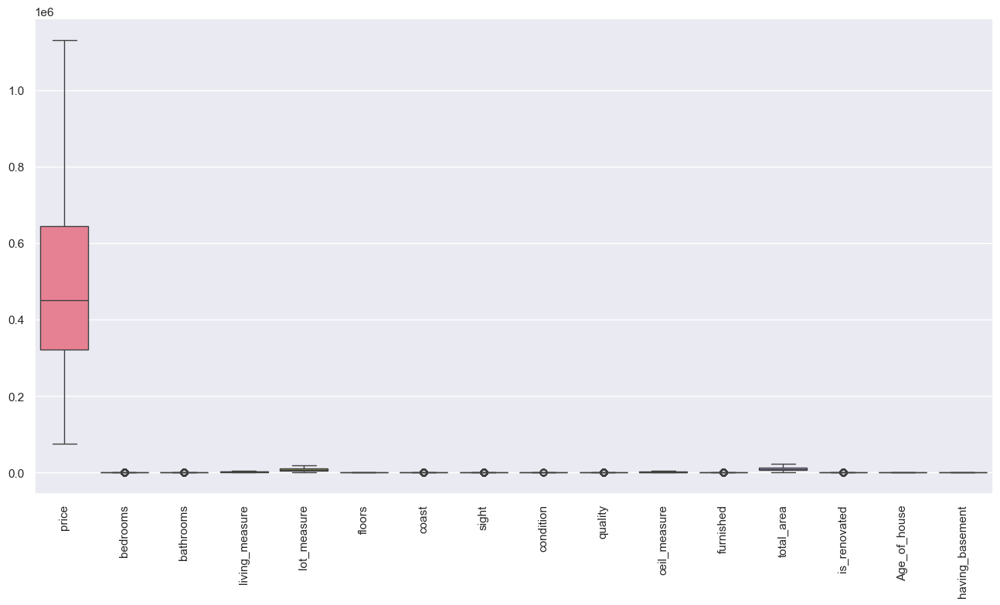

In [735]:
plt.figure(figsize=(16,8))
sns.boxplot(data=df, orient='v')
plt.xticks(rotation=90)
plt.show()

In [736]:
df.head()

,price,bedrooms,bathrooms,living_measure,lot_measure,floors,coast,sight,condition,quality,ceil_measure,furnished,total_area,is_renovated,Age_of_house,having_basement
0,600000.0,4.0,2.0,3050.0,9440.0,1,0,0,3,8.0,1800.0,0,12490.0,0,49,1
1,190000.0,2.0,1.0,670.0,3101.0,1,0,0,4,6.0,670.0,0,3771.0,0,67,0
2,735000.0,4.0,3.0,3040.0,2415.0,2,1,4,3,8.0,3040.0,0,5455.0,0,48,0
3,257000.0,3.0,2.0,1740.0,3721.0,2,0,0,3,8.0,1740.0,0,5461.0,0,5,0
4,450000.0,2.0,1.0,1120.0,4590.0,1,0,0,3,7.0,1120.0,0,5710.0,0,91,0


In [737]:
df['sight'] = df['sight'].astype('int')
df['coast'] = df['coast'].astype('int')
df['condition'] = df['condition'].astype('int')
df['quality'] = df['quality'].astype('int')
df['furnished'] = df['furnished'].astype('int')
df['is_renovated'] = df['is_renovated'].astype('int')
df['region code'] = df['region code'].astype('int')
df['having_basement'] = df['having_basement'].astype('int')
df['bathrooms'] = df['bathrooms'].astype('int')
df['bedrooms'] = df['bedrooms'].astype('int')
df['floors'] = df['floors'].astype('int')

KeyError: 'region code'

In [ ]:
df['furnished'].value_counts()

### Creating Dummies for Categorical Variables

In [ ]:
df_cat_var = pd.get_dummies(df[['sight','coast', 'condition', 'quality', 'furnished',
                                        'is_renovated', 'region code','having_basement']], prefix_sep='_', columns=['sight','coast', 'condition', 'quality', 'furnished', 'is_renovated', 'region code','having_basement'],
                                drop_first=True)       # Getting Dummies for Numeric Categorical Variables

In [ ]:
df_cat_var.head()

In [ ]:
# Rename the Columns

df_cat_var = df_cat_var .rename(columns={'coast_1': 'coast_yes'})
df_cat_var = df_cat_var .rename(columns={'is_renovated_1': 'is_renovated_yes'})
df_cat_var = df_cat_var .rename(columns={'having_basement_1': 'having_basement_yes'})
df_cat_var = df_cat_var .rename(columns={'furnished_1': 'furnished_yes'})
df_cat_var.head()

Convert bool to int

In [ ]:
df_cat_var = df_cat_var.astype(int)

In [ ]:
df_cat_var.info()

In [ ]:
df_cat_var.head()

## Variable Transformation (if applicable) using Standardization (Z-Score Transformation)

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
continuous_columns = ['price', 'bedrooms', 'bathrooms', 'living_measure', 'lot_measure', 'floors', 'ceil_measure', 'total_area', 'Age_of_house']

df_scaling = scaler.fit_transform(df[continuous_columns])


In [ ]:
df_scaling

In [ ]:
# Convert scaled data back to a DataFrame with appropriate column names
df_scale = pd.DataFrame(df_scaling, columns=continuous_columns)

In [ ]:
# Convert scaled data back to a DataFrame with appropriate column names
df_cat_var = pd.DataFrame(df_cat_var, columns=df_cat_var.columns)

In [ ]:
df_scaled = pd.concat([df_scale, df_cat_var], axis=1)

In [ ]:
df[continuous_columns].head()

In [ ]:
df_scaled.head(10)

## Business insights from EDA

## Is the data unbalanced? If so, what can be done? Please explain in the context of the business

###a) Is the data unbalanced? If so, what can be done?
Yes, the dataset is unbalanced in multiple aspects:

**Categorical Variables:**

 * **Waterfront View:** Only 0.7% of properties have this feature, making it extremely rare and indicative of premium housing.

 * **Furnished Status:** Only 19.6% of properties are furnished, suggesting that furnished homes cater to a specific niche market.

 * **Condition and Sight Ratings:** Most properties have a condition score of 3 (average) and a sight rating of 0, highlighting imbalances in these attributes.

**Continuous Variables:**

 * Variables like lot size, living area, and price are right-skewed, with most properties in the lower-to-mid ranges.

* Outliers, such as properties with exceptionally large lot areas or 33 bedrooms, suggest a separate market for ultra-luxury homes.

**Impact on Business Analysis:**
Imbalanced data can lead to biased insights, such as undervaluing rare features like waterfront views or premium-quality homes.

**Proposed Solutions:**

**1 - Resampling Techniques:**

 * **Oversampling:** Use techniques like SMOTE to balance underrepresented categories or ranges.

 * **Undersampling:** Reduce overrepresented classes where applicable.

**2 - Weighted Metrics:**

 * Assign higher weights to rare categories during model training to ensure fair representation.

**3 - Clustering for Balance:**

* Group properties into clusters to analyze them more effectively, addressing imbalance at a segment level.

**4 - Business Implications:**

* Rare features, such as waterfront views or furnished properties, should be marketed as exclusive and premium offerings.

* Develop targeted marketing strategies for unique property configurations to maximize returns.


###b) Any Business Insights Using Clustering?

Clustering reveals patterns and segmentation in the housing market:

**1 - Customer Segmentation:**

Affordable Homes: Low price, small lot and living areas, targeting budget-conscious buyers or first-time homeowners.
Mid-Range Homes: Moderate price and size, appealing to suburban families.
Luxury Homes: High price, large living areas, waterfront views, and premium features.

**2 - Price Optimization:**

Analyze clusters for pricing trends to identify underpriced or overpriced properties.
Highlight properties that offer "value for money," such as high quality and sight ratings but moderate pricing.

**3 - Feature-Based Marketing:**

Promote unique clusters like waterfront homes or properties with exceptional features (e.g., large basements or premium furnishings) to niche buyers.

**4 - Inventory Management:**

Regional clustering can identify high-demand areas, guiding resource allocation and marketing efforts.


###c) Any Other Business Insights?

**1 - Feature Importance for Pricing:**

Features like quality, living area, ceil height, and bathrooms strongly influence price.
Renovations should focus on these features to maximize property value.

**2 - Demand for Common Configurations:**

Properties with 3-4 bedrooms and 2-3 bathrooms are the most common and in high demand, ensuring quicker sales.

**3 - Seasonal Trends:**

Housing prices peak during specific months (e.g., April and June). Aligning marketing efforts with these periods can boost sales.

**4 - Outlier-Driven Opportunities:**

Ultra-luxury properties with extreme values (e.g., high price, large lot size) cater to a niche market. These should be marketed as exclusive investments.

**5 - Right-Skewed Features:**

The majority of properties fall in moderate ranges for price, lot size, and living area, indicating the market caters to middle-income buyers.
High-end properties should be separately positioned to attract affluent clientele.

**6 - Regional and Temporal Trends:**

Properties built around 2000 show peak demand, possibly due to favorable design or location trends during that era.


**Concluding Remarks**

EDA provides actionable insights into housing market trends, buyer preferences, and property segmentation. By addressing data imbalance, leveraging clustering, and focusing on unique property features, businesses can develop tailored strategies to cater to diverse buyer needs while maximizing profitability.

# Project 2 Start

### 1 - Model building and interpretation.

* a - Build various models (You can choose to build models for either or all of descriptive, predictive or prescriptive purposes)

* b - Test your predictive model against the test set using various appropriate performance metrics

* c - Interpretation of the models

### 2 - Model Tuning and business implication

* a - Ensemble modelling, wherever applicable

* b - Any other model tuning measures (if applicable)

* c - Interpretation of the most optimum model and its implication on the business

In [ ]:
df_scaling.shape

### **Descriptive Model**

### **Bartletts Test of Sphericity**
Bartlett's test of sphericity tests the hypothesis that the variables are uncorrelated in the population.

HO : All variables in the data are uncorrelated

HA : At least one pair of variables in the data are correlated

If the null hypothesis cannot be rejected, then PCA is not advisable.

**Note - Reject HO if p-value < 0.05**

In [ ]:
# Importing libraries to calculate the Bartlett Sphericity
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(df_scaling)
print("P-value:", p_value)

We reject the Null hypothesis. Hence we can perform the PCA.

### **KMO Test**

The Kaiser-Meyer-Olkin (KMO) Test measures the adequacy of sampling for factor analysis, including Principal Component Analysis (PCA). It determines whether your data is suitable for dimensionality reduction techniques.

KMO Test:
The KMO statistic evaluates the proportion of variance among variables that might be common variance (shared variance).
It ranges from 0 to 1. Higher values indicate that the dataset is more suitable for PCA.


**KMO Interpretation:**

**KMO Value	  |  Interpretation	|   PCA Suitability**

0.90 to 1.00  |	Marvelous: Strong patterns of correlation exist.   |	Highly suitable for PCA.

0.80 to 0.89  | Meritorious: Variables are adequately correlated.	| Suitable for PCA.

0.70 to 0.79  |	Middling: Moderate correlations are present. |	PCA can be considered.

0.60 to 0.69  |	Mediocre: Weak correlations exist. | PCA is questionable but possible.

0.50 to 0.59  |	Miserable: Very weak correlations.  | PCA is likely not suitable.

Below 0.50	 | Unacceptable: Data is poorly correlated.	| PCA should not be performed.

In [ ]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(df_scaling)
kmo_model

AS per details value of KMO_model is 0.6366086675026923. Hence we can not go for PCA.

* 0.60 to 0.69 and Mediocre: Weak correlations exist. | PCA is questionable but possible.



In [ ]:
pip install --upgrade scikit-learn numpy threadpoolctl

Creating Clusters using KMeans

In [ ]:
# Forming 2 Clusters with K=2

# Create K Means cluster and store the result in the object k_means
k_means = KMeans(n_clusters = 2, random_state=1)

In [ ]:
# Fit K means on the scaled_df
k_means.fit(df_scaling)

Cluster Output for all the observations

In [ ]:
# Get the labels
k_means.labels_

Within Cluster Sum of Squares

In [ ]:
round(k_means.inertia_,2)

Forming clusters with K = 1,3,4,5,6 and comparing the WSS

In [ ]:
k_means = KMeans(n_clusters = 1,random_state=1)
k_means.fit(df_scaling)
round(k_means.inertia_,2)

In [ ]:
k_means = KMeans(n_clusters = 3,random_state=1)
k_means.fit(df_scaling)
round(k_means.inertia_,2)

In [ ]:
k_means = KMeans(n_clusters = 4,random_state=1)
k_means.fit(df_scaling)
round(k_means.inertia_,2)

In [ ]:
k_means = KMeans(n_clusters = 5,random_state=1)
k_means.fit(df_scaling)
round(k_means.inertia_,2)

In [ ]:
k_means = KMeans(n_clusters = 6,random_state=1)
k_means.fit(df_scaling)
round(k_means.inertia_,2)

WSS reduces as K keeps increasing

Calculating WSS for other values of K - Elbow Method

In [ ]:
wss =[]

for i in range(1,11):
    KM = KMeans(n_clusters=i,random_state=1)
    KM.fit(df_scaling)
    wss.append(round(KM.inertia_,2))

In [ ]:
wss

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(range(1,11), wss, color='deepskyblue', marker='D')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1,11))
plt.show()

Check the silhouette scores against n_clusters

In [ ]:
silhouette_scores = []

In [ ]:
# Loop through values of n_clusters from 2 to 10
for n_clusters in range(2, 11):
    # Initialize KMeans with the current n_clusters
    k_means = KMeans(n_clusters=n_clusters, random_state=1)

    # Fit the model
    k_means.fit(df_scaling)

    # Get the cluster labels
    labels = k_means.labels_

    # Calculate the silhouette score and store it
    score = silhouette_score(df_scaling, labels)
    silhouette_scores.append((n_clusters, score))

In [ ]:
# Print silhouette scores
for n_clusters, score in silhouette_scores:
    print(f"n_clusters = {n_clusters}, silhouette_score = {score:.4f}")

In [ ]:
# Determine the optimal number of clusters using the elbow method and silhouette score
inertia = []
silhouette_scores = []
k_range = range(2, 11)  # Testing k from 2 to 10

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaling)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df_scaling, kmeans.labels_))

# Plot the Silhouette Scores
plt.figure(figsize=(12, 5))
plt.plot(k_range, silhouette_scores, marker='d', color='green')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

## Observations:

We can see from the plot that silhouette score is highest for k=5. Well that makes it slightly easy for us and we can start with first understanding these 5 clusters. Final clusters will be 5. Append Clusters to the original dataset

In [ ]:
k_means = KMeans(n_clusters = 5, random_state=1)
k_means.fit(df_scaling)
labels = k_means.labels_

In [ ]:
df_orinal = pd.DataFrame(df[continuous_columns])

In [ ]:
df_orinal['kmeans_cluster'] = labels
df_orinal.head()

In [ ]:
# Visualize cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(x='bathrooms', hue='kmeans_cluster', data=df_orinal, palette='viridis')
plt.xlabel("bathrooms")
plt.ylabel("Number of Observations")
plt.show()

In [ ]:
# Visualize cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(x='bedrooms', hue='kmeans_cluster', data=df_orinal, palette='viridis')
plt.xlabel("bedrooms")
plt.ylabel("Number of Observations")
plt.show()

In [ ]:
# Visualize cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(x='price', hue='kmeans_cluster', data=df_orinal, palette='viridis')
plt.xlabel("price")
plt.ylabel("Number of Observations")
plt.show()

In [ ]:
# Visualize cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(x='price', hue='kmeans_cluster', data=df_orinal, palette='viridis')
plt.xlabel("price")
plt.ylabel("Number of Observations")
plt.show()

In [ ]:
df_orinal['kmeans_cluster'].value_counts().sort_values(ascending=False)

Perform Kmeans Clustering Analysis

In [ ]:
# Step 1: Group data by 'kmeans_cluster' and calculate mean
clust_profile = df_orinal.groupby('kmeans_cluster').mean()

# Step 2: Calculate frequency of each cluster
cluster_counts = df_orinal['kmeans_cluster'].value_counts().sort_index()

# Step 3: Add the frequency as a new column
clust_profile['freq'] = cluster_counts

# Display the updated DataFrame
clust_profile

In [ ]:
# Visualize cluster sizes
cluster_counts = df_orinal['kmeans_cluster'].value_counts()
plt.figure(figsize=(10, 6))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='viridis')
plt.title("Cluster Counts")
plt.xlabel("Cluster")
plt.ylabel("Number of Observations")
plt.show()

In [ ]:
pca = PCA(n_components=5)
pca_data = pca.fit_transform(df_scaling)

plt.figure(figsize=(16, 8))
plt.scatter(pca_data[:, 0], pca_data[:, 1], c=df_orinal['kmeans_cluster'], cmap='viridis')
plt.title("K-Means Clustering Visualization (PCA Reduced)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster")
plt.show()

In [ ]:
plt.figure(figsize=(14, 6))
sns.scatterplot(data=df_orinal, y='price', x='bedrooms', hue='kmeans_cluster', palette='summer', markers='d')
plt.title('K-Means Clustering: Price vs. Bedrooms')
plt.ylabel('Price')
plt.xlabel('Bedrooms')
plt.xticks(range(0, 12))
plt.show()

In [ ]:
plt.figure(figsize=(14, 6))
sns.scatterplot(data=df_orinal, x='bathrooms', y='price', hue='kmeans_cluster' ,markers='d')
plt.title('K-Means Clustering: Price vs. bathrooms')
plt.ylabel('Price')
plt.xlabel('Bathrooms')
plt.show()

In [ ]:
plt.figure(figsize=(14, 6))
sns.scatterplot(data=df_orinal, x='total_area', y='price', hue='kmeans_cluster', palette='rainbow',markers='d')
plt.title('K-Means Clustering: Price vs. Total Area')
plt.ylabel('Price')
plt.xlabel('Total Area')
plt.show()

In [ ]:
plt.figure(figsize=(14, 6))
sns.scatterplot(data=df_orinal, x='floors', y='price', hue='kmeans_cluster', palette='rainbow',markers='d')
plt.title('K-Means Clustering: Price vs. floors')
plt.ylabel('Price')
plt.xlabel('Floors')
plt.show()

In [ ]:
df_orinal['Age_of_house'].groupby(df_orinal['kmeans_cluster']).median()

In [ ]:
df_orinal.columns

In [ ]:
df_orinal.groupby('kmeans_cluster').mean()

In [ ]:
cols_visualise = ['price', 'bedrooms', 'bathrooms', 'living_measure', 'lot_measure', 'floors', 'ceil_measure', 'basement', 'total_area', 'Age_of_house']

for col in cols_visualise:
    sns.boxplot(x = 'kmeans_cluster', y = col, data = df_orinal, palette='viridis')
    plt.title(f'Boxplot of {col} by Cluster')
    plt.show()

Export the File

In [ ]:
data.to_csv('Kmeans_Clustering.csv')

## Cluster Analysis and Recommendations

####Cluster 0
* Average Price: $887,388.80
* Bedrooms: 4.25
* Bathrooms: 3.13
* Living Measure (sq. ft.): 3,533.82
* Lot Measure (sq. ft.): 12,080.62
* Floors: 1.92
* Ceil Measure: 3,127.64
* Basement (sq. ft.): 388.83
* Total Area (sq. ft.): 15,418.79
* Age of House (years): 24.76

### Insights:

This cluster represents large and relatively new houses with high living and lot areas, and higher-than-average prices.

Houses in this cluster are premium properties, likely appealing to affluent buyers seeking spacious homes.

### Recommendations:

Target luxury buyers for these properties through high-end marketing channels.

Highlight features like spacious living areas and basements in advertisements.

---

####Cluster 1
* Average Price: $493,740.72
* Bedrooms: 3.30
* Bathrooms: 1.96
* Living Measure (sq. ft.): 2,127.64
* Lot Measure (sq. ft.): 17,706.67
* Floors: 1.27
* Ceil Measure: 1,849.01
* Basement (sq. ft.): 273.98
* Total Area (sq. ft.): 20,202.80
* Age of House (years): 42.78

### Insights:

These homes are mid-sized houses on large lots, priced in the mid-range.

The houses are relatively older, but the large lot sizes may offer opportunities for redevelopment or renovations.

### Recommendations:

Market these properties to families who value outdoor space and are open to renovations.

Highlight the potential for adding value to the property by upgrading or modernizing.

---

### Cluster 2
* Average Price: $574,462.93
* Bedrooms: 3.86
* Bathrooms: 2.21
* Living Measure (sq. ft.): 2,276.63
* Lot Measure (sq. ft.): 7,617.06
* Floors: 1.09
* Ceil Measure: 1,456.93
* Basement (sq. ft.): 811.26
* Total Area (sq. ft.): 9,893.74
* Age of House (years): 59.90

### Insights:
This cluster represents older houses with mid-range prices and moderate living areas.

The relatively large basements could appeal to buyers looking for additional usable space.

### Recommendations:

Market these properties to buyers looking for homes with character or investors seeking to modernize older houses.

Emphasize the functional basements and potential for customization.

---

###Cluster 3
* Average Price: $459,304.00
* Bedrooms: 3.29
* Bathrooms: 2.14
* Living Measure (sq. ft.): 2,008.34
* Lot Measure (sq. ft.): 5,098.94
* Floors: 2.08
* Ceil Measure: 1,949.80
* Basement (sq. ft.): 58.40
* Total Area (sq. ft.): 7,107.28
* Age of House (years): 15.67

### Insights:
These houses are relatively new and compact homes, with moderate prices.
Small lot sizes and minimal basement space indicate these are likely urban or suburban homes.

### Recommendations:

Market to young professionals or small families who prioritize modern homes in convenient locations.

Emphasize the newer construction and lower maintenance requirements.

---

####Cluster 4
* Average Price: $360,931.50
* Bedrooms: 2.79
* Bathrooms: 1.48
* Living Measure (sq. ft.): 1,306.22
* Lot Measure (sq. ft.): 7,202.45
* Floors: 1.03
* Ceil Measure: 1,201.96
* Basement (sq. ft.): 104.26
* Total Area (sq. ft.): 8,509.91
*Age of House (years): 63.14

### Insights:

These are small, older homes with lower prices, likely appealing to budget-conscious buyers.

Modest living areas and minimal basements suggest compact homes.

### Recommendations:

Market to first-time homebuyers, retirees, or investors seeking affordable properties.

Highlight affordability and potential for customization or improvements.

### Summary Table:

Cluster	- Avg.Price - Bedrooms - Bathrooms - Target Buyers
---

0	->  887,388.80	-> 4.25	-> 3.13	-> Affluent buyers
---
1	->  493,740.72	-> 3.30	-> 1.96	-> Families valuing lot size
---
2	->  574,462.93	-> 3.86	-> 2.21	-> Buyers seeking character
---
3	->  459,304.00	-> 3.29	-> 2.14	-> Professionals
---
4	->  360,931.50	-> 2.79	-> 1.48	-> Budget-Conscious buyers
---



## Hierarchical Clustering

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
linked = linkage(df_scaling, method='ward')

In [ ]:
# Set criterion as maxclust,then create 3 clusters, and store the result in another object 'clusters'
from scipy.cluster.hierarchy import linkage, fcluster
df_orinal['hierarchical_cluster'] = fcluster(linked, 5, criterion='maxclust') # Same as K-Means for comparison

In [ ]:
from sklearn.cluster import AgglomerativeClustering

# Initialize AgglomerativeClustering with the corrected parameter
cluster = AgglomerativeClustering(n_clusters=5, metric='euclidean', linkage='average')

# Fit and predict the clusters
Cluster_agglo = cluster.fit_predict(df_scaling)
print(Cluster_agglo)


In [ ]:
df_orinal["Agglo_CLusters"] = Cluster_agglo

In [ ]:
agglo_data=df_orinal.drop(['kmeans_cluster','hierarchical_cluster'],axis=1).groupby('Agglo_CLusters').mean()
agglo_data['Freq']=df_orinal.Agglo_CLusters.value_counts().sort_index()
agglo_data

### Cluster Analysis and Recommendations based on the Hierarchical Clustering

###Cluster 0 Analysis
 * Key Features:
  * Highest price cluster: $899,150 on average.
  * Spacious homes: Large living areas (4,144.63 sq. ft.) and lots (13,875.75 sq. ft.).
  * Many bedrooms and bathrooms: 7.13 bedrooms and 7 bathrooms.
  * Younger houses: 46.5 years old on average.
  * Basements: Considerable basement size (653.75 sq. ft.).
* Frequency: Rare cluster, only 8 houses.
* Demographic: Likely high-net-worth individuals or families looking for luxurious estates with ample space.

* Recommendations:
 * Target ultra-luxury buyers with premium marketing strategies.
 * Highlight features like large basements, extra rooms, and private outdoor space.
 * Focus on exclusive real estate platforms.

###Cluster 1 Analysis
* Key Features:
 * High price: $834,615 on average.
 * Large homes: 7.75 bedrooms, 3.75 bathrooms, and 3,700.47 sq. ft. living space.
 * Moderate lot size: 8,845.38 sq. ft.
 * Older homes: 69.25 years old on average.
 * Basements present: 1,042.50 sq. ft. on average.
* Frequency: 32 houses.
* Demographic: Families or buyers who value a mix of space and affordability (relative to Cluster 0).

* Recommendations:
 * Target upper-middle-class buyers or families who need large homes.
 * Promote the balance of space and affordability compared to Cluster 0.
 * Highlight potential renovations or upgrades to modernize older homes.


###Cluster 2 Analysis
* Key Features:
 * Highest price: 1,114,788 (luxury homes).
 * No bedrooms or bathrooms: Likely large vacant land or unique properties (e.g., commercial spaces).
 * Spacious lots: 11,962 sq. ft. on average.
 * No basements but significant floor and ceiling space.
 * Newer properties: 24 years old on average.
* Frequency: 2 properties (extremely rare).
* Demographic: Ultra-niche buyers, developers, or investors.

* Recommendations:
 * Focus on developers and investors interested in large land parcels.
 * Market these properties for redevelopment or commercial use.
 * Use targeted outreach to specialized real estate investors.

###Cluster 3 Analysis
* Key Features:
 * Moderate price: $473,720 (affordable homes).
 * Average bedrooms and bathrooms: 3.27 and 1.91, respectively.
 * Smaller homes: 1,907.71 sq. ft. living area and 8,412.3 sq. ft. lot.
 * Basements limited: 257.56 sq. ft. on average.
 * Older homes: 44.97 years old.
* Frequency: Dominant cluster with 19,679 houses.
* Demographic: Middle-class families or first-time homebuyers.

* Recommendations:
 * Market homes as affordable, family-friendly options.
 * Highlight practical features like smaller maintenance costs and good location potential.
 * Partner with mortgage brokers to attract first-time buyers.

###Cluster 4 Analysis
* Key Features:
  * High price: $897,941 on average.
  * Spacious homes: 4.30 bedrooms, 3.52 bathrooms, 3,583.82 sq. ft. living space.
  * Large lots: 11,724.30 sq. ft.
  * Moderate basements: 545.47 sq. ft.
  * Older homes: 25.28 years old on average.
* Frequency: 1,892 houses.
* Demographic: Affluent families or professionals seeking high-end homes.

* Recommendations:
 * Market homes as premium family-friendly properties.
 * Highlight features like spacious layouts, modern designs, and outdoor spaces.
 * Focus on suburban luxury buyers.

###General Recommendations:
**1 - For all clusters:**
  * Use geospatial data (e.g., region, zip code) to refine marketing strategies.

  * Emphasize unique selling points (e.g., spaciousness, affordability, luxury).

  * Develop tailored renovation packages for older homes.

**2 - Property-specific:**

 * For rare clusters (0, 2), focus on exclusivity and niche marketing.

 * For dominant clusters (3), emphasize affordability and practicality for families.

## Saving the Cluster Profiles in a csv file

In [ ]:
data.to_csv('Clustering.csv')

# Predictive Modeling

In [ ]:
df_model = df[continuous_columns] + df_cat_var

In [ ]:
# Convert scaled data back to a DataFrame with appropriate column names
df_cat = pd.DataFrame(df_cat_var, columns=df_cat_var.columns)

# Convert scaled data back to a DataFrame with appropriate column names
df_num = pd.DataFrame(df[continuous_columns], columns=continuous_columns)

df_model = pd.concat([df_num, df_cat], axis=1)

In [ ]:
df_model.head()   # uppar ka kar diya 

In [ ]:
# Creating X, y for training and testing set
X = df_model.drop("price" , axis=1)
y = df_model["price"]

In [ ]:
# Split the data into training and testing sets Splitting data 70:30

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [738]:
print(X_train_scaled.shape)
print(X_train.shape)
print(X_test.shape)
print(X_test_scaled.shape)
print(y_train.shape)
print(y_test.shape)

(15129, 40)
(15129, 40)
(6484, 40)
(6484, 40)
(15129,)
(6484,)


## 1 - Linear Regression

In [739]:
# Create and train the model
linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train)

# Predict on test data
y_pred = linear_model.predict(X_test_scaled)
residual = y_test - y_pred

# Calculate metrics
train_score = linear_model.score(X_train_scaled, y_train)  # R-squared on training set
test_score = linear_model.score(X_test_scaled, y_test)  # R-squared on test set

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a dictionary to store results
Linear = {
    'Model_Name': 'Linear Regression',
    'Training Score': linear_model.score(X_train_scaled, y_train),
    'Test Score': linear_model.score(X_test_scaled, y_test),
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
results_df = pd.DataFrame([Linear])

# Print the DataFrame
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.70333,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907


#### This table shows the performance metrics of a Linear Regression model:

* Training Score (0.704): The model explains 70.4% of the variance in the training data.
* Test Score (0.714): The model explains 71.4% of the variance in the test data, indicating good generalization.
* MSE (1.78e+10): Mean Squared Error measures the average squared prediction error.
* RMSE (133,476): Root Mean Squared Error is the square root of MSE, representing the average prediction error in the same units as the target variable.
* MAE (101,725): Mean Absolute Error is the average of absolute prediction errors.
* R-squared (0.714): Proportion of variance explained by the model on the test data. Higher is better, max = 1.

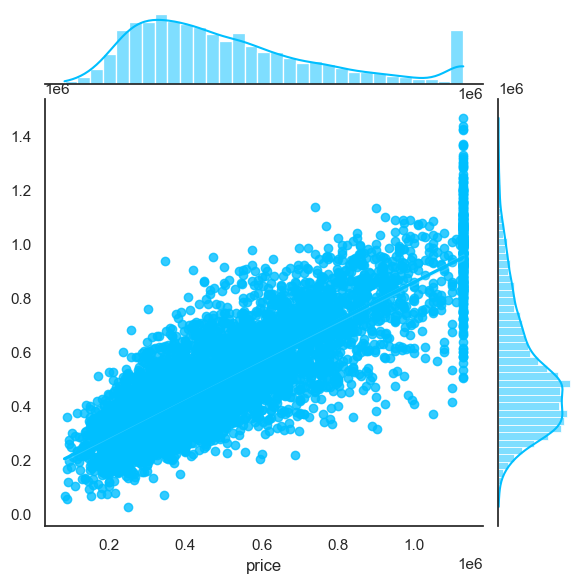

In [740]:
sns.set(style="darkgrid", color_codes=True)

with sns.axes_style("white"):
    sns.jointplot(x=y_test, y=y_pred, kind="reg", color="deepskyblue")

# 2. Ridge Regression (Scaling Important)

In [741]:
# Create and Train the Ridge Regression Model
ridge_model = Ridge()  # Adjust alpha as needed
ridge_model.fit(X_train_scaled, y_train)

# Make Predictions on Test Data
y_pred = ridge_model.predict(X_test_scaled)

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a Dictionary to Store Results
Ridge = {
    'Model_Name': 'Ridge Regression',
    'Training Score': ridge_model.score(X_train_scaled, y_train),  # R-squared on training set (using scaled features)
    'Test Score': ridge_model.score(X_test_scaled, y_test),        # R-squared on test set (using scaled features)
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
Ridge = pd.DataFrame([Ridge])

# Add the result into DataFrame
results_df = pd.concat([results_df, Ridge])

# Print the DataFrame
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
0,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924


This table summarizes the performance of a Ridge Regression model:
* Training Score (0.704): The model explains 70.4% of variance in training data.
* Test Score (0.714): Explains 71.4% of variance in test data, indicating good generalization.
* MSE (1.78e+10): Mean Squared Error reflects the average squared prediction error.
* RMSE (133,462): Root Mean Squared Error shows the average prediction error in target units.
* MAE (101,712): Mean Absolute Error is the average absolute prediction error.
* R-squared (0.714): Indicates 71.4% of variance in test data is explained by the model.


# 3. Lasso Regression (Scaling Important)

In [742]:
# Create and Train the Lasso Regression Model
lasso_model = Lasso()  # Adjust alpha as needed
lasso_model.fit(X_train_scaled, y_train)

# Make Predictions on Test Data
y_pred = lasso_model.predict(X_test_scaled)

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a Dictionary to Store Results
lasso_model = {
    'Model_Name': 'Lasso Regression',
    'Training Score': lasso_model.score(X_train_scaled, y_train),  # R-squared on training set (using scaled features)
    'Test Score': lasso_model.score(X_test_scaled, y_test),  # R-squared on test set (using scaled features)
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
lasso_model = pd.DataFrame([lasso_model])

# Add the result into DataFrame
results_df = pd.concat([results_df, lasso_model])

# Print the DataFrame
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
0,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
0,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864


This table summarizes the performance of a Lasso Regression model:

* Training Score (0.704): The model explains 70.4% of variance in training data.
* Test Score (0.714): Explains 71.4% of variance in test data, showing good generalization.
* MSE (1.78e+10): Mean Squared Error represents the average squared prediction error.
* RMSE (133,476): Root Mean Squared Error indicates the average prediction error in target units.
* MAE (101,725): Mean Absolute Error shows the average absolute prediction error.
* R-squared (0.714): Explains 71.4% of the variance in the test data.

# 4. Decision Tree Regression (Scaling Not Important)

In [743]:
# 4. Decision Tree Regression (Scaling Not Important)

# Create and train the model
decision_tree_model = DecisionTreeRegressor()
decision_tree_model.fit(X_train_scaled, y_train)

# Predict on test data
y_pred = decision_tree_model.predict(X_test_scaled)
residual = y_test - y_pred

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a dictionary to store results
Decision_Tree = {
    'Model_Name': 'Decision Tree Regression',
    'Training Score': decision_tree_model.score(X_train_scaled, y_train),
    'Test Score': decision_tree_model.score(X_test_scaled, y_test),
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
Decision_Tree = pd.DataFrame([Decision_Tree])

# Add the result into DataFrame
results_df = pd.concat([results_df, Decision_Tree])

# Print the DataFrame
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
0,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
0,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
0,Decision Tree Regression,0.999816,0.494588,3.146017e+10,177370.156056,124920.171345,0.494588


This table summarizes the performance of a Decision Tree Regression model:
* Training Score (0.999): The model almost perfectly explains variance in training data, indicating potential overfitting.
* Test Score (0.498): Explains only 49.8% of variance in test data, showing poor generalization.
* MSE (3.12e+10): High Mean Squared Error indicates large prediction errors on the test set.
* RMSE (176,766): Root Mean Squared Error reflects significant average prediction errors.
* MAE (124,714): Mean Absolute Error indicates large average absolute prediction errors.
* R-squared (0.498): Only 49.8% of the variance in the test data is explained by the model.

This suggests the Decision Tree Regression model is overfitting, performing very well on training data but poorly on the test data.


# 5. Random Forest Regression (Scaling Not Important)


In [744]:
# Create and train the model
random_forest_model = RandomForestRegressor(n_estimators=100)
random_forest_model.fit(X_train, y_train)

# Predict on test data
y_pred = random_forest_model.predict(X_test)
residual = y_test - y_pred

# Calculate metrics
train_score = random_forest_model.score(X_train, y_train)  # R-squared on training set
test_score = random_forest_model.score(X_test, y_test)     # R-squared on test set

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a dictionary to store results
Random_Forest = {
    'Model_Name': 'Random Forest Regression ',
    'Training Score': random_forest_model.score(X_train, y_train),
    'Test Score': random_forest_model.score(X_test, y_test),
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
Random_Forest = pd.DataFrame([Random_Forest])

# Add the result into DataFrame
results_df = pd.concat([results_df, Random_Forest])

# Print the DataFrame
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
0,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
0,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
0,Decision Tree Regression,0.999816,0.494588,3.146017e+10,177370.156056,124920.171345,0.494588
0,Random Forest Regression,0.961876,0.735606,1.645759e+10,128287.140428,93143.104056,0.735606


This table summarizes the performance of a Random Forest Regression model:


* Test Score (0.737): Explains 73.7% of the variance in test data, indicating good generalization.

* MSE (1.64e+10): Mean Squared Error is lower compared to other models, indicating better predictions.

* RMSE (127,988): Root Mean Squared Error shows lower average prediction errors.

* MAE (92,837): Mean Absolute Error reflects smaller average absolute prediction errors.

* R-squared (0.737): Explains 73.7% of variance in test data, showing better performance than simpler models.

This indicates Random Forest Regression performs well with balanced accuracy and reduced overfitting compared to the Decision Tree model. It's effective for both linear and non-linear relationships.









# 6. Support Vector Regression (Scaling Important)

In [606]:
# Create and Train the Lasso Regression Model
svr_model = SVR(kernel='rbf')
svr_model.fit(X_train_scaled, y_train)

# Make Predictions on Test Data
y_pred = svr_model.predict(X_test_scaled)

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a Dictionary to Store Results
svr_model = {
    'Model_Name': 'Support Vector Regression',
    'Training Score': svr_model.score(X_train_scaled, y_train),  # R-squared on training set (using scaled features)
    'Test Score': svr_model.score(X_test_scaled, y_test),  # R-squared on test set (using scaled features)
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
svr_model = pd.DataFrame([svr_model])

# Add the result into DataFrame
results_df = pd.concat([results_df, svr_model])

# Print the DataFrame
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
0,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
0,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
0,Decision Tree Regression,0.999816,0.495011,3.143383e+10,177295.895026,124803.251311,0.495011
0,Random Forest Regression,0.962116,0.736593,1.639615e+10,128047.441002,93015.217387,0.736593
0,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
0,Decision Tree Regression,0.999816,0.487844,3.187994e+10,178549.546572,125550.100401,0.487844
0,Random Forest Regression,0.961970,0.735598,1.645808e+10,128289.042460,93294.209626,0.735598
0,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262


This table summarizes the performance of a Support Vector Regression (SVR) model:

* Training Score (-0.060): The model performs poorly on the training data, explaining less than 0% of the variance, which indicates a poor fit.

* Test Score (-0.053): The model also performs poorly on the test data, showing negative performance, which means it's not better than a simple mean predictor.

* MSE (6.56e+10): Very high Mean Squared Error, indicating large prediction errors.

* RMSE (256,044): Root Mean Squared Error is high, reflecting large average prediction errors in the target variable’s units.

* MAE (192,185): Mean Absolute Error shows very high average absolute prediction errors.

* R-squared (-0.053): A negative R-squared suggests the model is worse than simply predicting the mean value for all observations (indicating poor model performance).

This indicates that Support Vector Regression in this case is underperforming, and may not be suitable for this dataset. Adjusting hyperparameters or trying a different model might be necessary.

# Model Tuning and Business implication

## Hyperparameter Tuning

### 7 - Hyperparameter Tuning using Grid Search for Support Vector Regressor (SVR)

In [ ]:
# Define SVR model and parameter grid for GridSearchCV
svr = SVR()
param_grid = {
    'C': [0.1, 1, 10, 100],     # Regularization parameter
    'epsilon': [0.01, 0.1, 1],  # Margin of tolerance
    'kernel': ['rbf', 'linear'] # Kernel function (RBF, linear)
}

# Perform Grid Search with Cross-validation
grid_search = GridSearchCV(estimator=svr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Train the SVR model with the best hyperparameters
best_svr = SVR(**best_params)
best_svr.fit(X_train_scaled, y_train)

# Make predictions on test data
y_pred_svr = best_svr.predict(X_test_scaled)

# Calculate Evaluation Metrics
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

# Create a Dictionary to Store Results
svr_results = {
    'Model_Name': 'SVR (Best)',
    'Training Score': best_svr.score(X_train_scaled, y_train),
    'Test Score': best_svr.score(X_test_scaled, y_test),
    'MSE': mse_svr,
    'RMSE': rmse_svr,
    'MAE': mae_svr,
    'R-squared': r2_svr
}

# Convert the dictionary to a DataFrame
svr_df = pd.DataFrame([svr_results])

# Append the SVR results DataFrame to the existing results DataFrame
results_df = pd.concat([results_df, svr_df], ignore_index=True)

results_df

Best Hyperparameters: {'C': 100, 'epsilon': 1, 'kernel': 'linear'}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.704312,0.713786,1.781582e+10,133475.930910,101724.620849,0.713786
1,Ridge Regression,0.704310,0.713846,1.781210e+10,133461.989347,101712.419205,0.713846
2,Lasso Regression,0.704309,0.713788,1.781573e+10,133475.569240,101724.728485,0.713788
3,Decision Tree Regression,0.999816,0.492591,3.158442e+10,177720.061533,125278.861043,0.492591
4,Random Forest Regression,0.962085,0.737156,1.636112e+10,127910.592565,93030.416815,0.737156
5,Support Vector Regression,-0.059632,-0.053212,6.555876e+10,256044.457442,192185.297520,-0.053212
6,SVR (Best),0.697728,0.706468,1.827133e+10,135171.467510,102064.899963,0.706468


##### Best Hyperparameters:
  
  * C = 100: Controls the trade-off between achieving a low error on the training data and a smooth decision boundary.
  
  * epsilon = 1: Defines the margin of tolerance for errors.
  
  * kernel = 'linear': Specifies a linear kernel function, meaning the model assumes a linear relationship.

##### Performance Metrics:
  
* Training Score (0.698): The model explains 69.8% of variance in the training data.

* Test Score (0.706): Explains 70.6% of variance in the test data, indicating good generalization.

* MSE (1.83e+10): Mean Squared Error is relatively lower than before, suggesting improved prediction accuracy.

* RMSE (135,171): Root Mean Squared Error shows a reasonable average error in predictions.

* MAE (102,065): Mean Absolute Error indicates moderate prediction errors.

* R-squared (0.706): Indicates that 70.6% of the variance in test data is explained by the model.

**Conclusion:** Hyperparameter tuning improved the SVR model's performance significantly, with a good balance between the training and test scores, suggesting better generalization and lower errors compared to the unoptimized model.


### 8 - Hyperparameter Tuning using Grid Search for Random Forest

In [ ]:
# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Define the hyperparameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [10, 20, 30, None],  # Maximum depth of individual trees (None for unlimited)
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4]   # Minimum samples required at each leaf node
}

# Perform Grid Search with Cross-validation to find the best hyperparameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best model with the optimal hyperparameters
best_rf_model = grid_search.best_estimator_

# Print the best hyperparameters in a clear format
print(f"Best Hyperparameters: {grid_search.best_params_}")

# Make predictions on the test set using the best model
y_pred_rf = best_rf_model.predict(X_test)

# Calculate evaluation metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Create a DataFrame to store the results
RF_Best = pd.DataFrame({
    'Model_Name': ['Random Forest (Best)'],
    'Training Score': [best_rf_model.score(X_train, y_train)],
    'Test Score': [best_rf_model.score(X_test, y_test)],
    'MSE': [mse_rf],
    'RMSE': [rmse_rf],
    'MAE': [mae_rf],
    'R-squared': [r2_rf]
})

# Append the Random Forest results DataFrame to the existing results DataFrame (if any)
results_df = pd.concat([results_df, RF_Best], ignore_index=True)

# Print the results DataFrame
print(results_df)

##### Best Hyperparameters:

* max_depth = 30: Maximum depth of the trees, controlling tree complexity.

* min_samples_leaf = 1: Minimum number of samples required in a leaf node.

* min_samples_split = 10: Minimum number of samples required to split an internal node.

* n_estimators = 200: Number of trees in the forest.

#### Performance Metrics:

* Training Score (0.908): Explains 90.8% of variance in the training data, showing a very good fit.

* Test Score (0.741): Explains 74.1% of variance in the test data, indicating good generalization.

* MSE (1.61e+10): Mean Squared Error is relatively low, reflecting improved prediction accuracy.

* RMSE (126,964): Root Mean Squared Error indicates the average prediction error in the same unit as the target variable.

* MAE (92,561): Mean Absolute Error reflects low average absolute prediction errors.

* R-squared (0.741): Explains 74.1% of variance in the test data.


### 9 - Hyperparameter Tuning using Grid Search for Decision Tree

In [ ]:
# Define the Decision Tree Regressor model
dtree = DecisionTreeRegressor()

dtree_params = {
    'max_depth': [5, 10, 20, None],  # Maximum depth of the tree (None for unlimited)
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],   # Minimum samples required at each leaf node
    'max_features': ['auto', 'sqrt', 'log2', None]  # Number of features to consider at each split
}

# Perform Grid Search with Cross-validation for Decision Tree
dtree_grid = GridSearchCV(dtree, dtree_params, cv=3, scoring='neg_mean_squared_error')
dtree_grid.fit(X_train, y_train)

# Get Best Model
dtree_model = dtree_grid.best_estimator_
print("Best Decision Tree Parameters:", dtree_grid.best_params_)

# Make predictions on the test set using the best decision tree model
y_pred_dtree = dtree_model.predict(X_test)

# Calculate evaluation metrics for Decision Tree
mse_dtree = mean_squared_error(y_test, y_pred_dtree)
rmse_dtree = np.sqrt(mse_dtree)
mae_dtree = mean_absolute_error(y_test, y_pred_dtree)
r2_dtree = r2_score(y_test, y_pred_dtree)

# Create a DataFrame to store the results
dtree_best = pd.DataFrame({
    'Model_Name': ['Decision Tree (Best)'],
    'Training Score': [dtree_model.score(X_train, y_train)],
    'Test Score': [dtree_model.score(X_test, y_test)],
    'MSE': [mse_dtree],
    'RMSE': [rmse_dtree],
    'MAE': [mae_dtree],
    'R-squared': [r2_dtree]
})

# Append the SVR results DataFrame to the existing results DataFrame
results_df = pd.concat([results_df, dtree_best], ignore_index=True)

results_df

Best Decision Tree Parameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.704312,0.713786,1.781582e+10,133475.930910,101724.620849,0.713786
1,Ridge Regression,0.704310,0.713846,1.781210e+10,133461.989347,101712.419205,0.713846
2,Lasso Regression,0.704309,0.713788,1.781573e+10,133475.569240,101724.728485,0.713788
3,Decision Tree Regression,0.999816,0.492591,3.158442e+10,177720.061533,125278.861043,0.492591
4,Random Forest Regression,0.962085,0.737156,1.636112e+10,127910.592565,93030.416815,0.737156
5,Support Vector Regression,-0.059632,-0.053212,6.555876e+10,256044.457442,192185.297520,-0.053212
6,SVR (Best),0.697728,0.706468,1.827133e+10,135171.467510,102064.899963,0.706468
7,Random Forest (Best),0.908053,0.741033,1.611981e+10,126963.832942,92560.785343,0.741033
8,Decision Tree (Best),0.759647,0.685396,1.958301e+10,139939.294875,102910.296355,0.685396


##### Best Hyperparameters:

* max_depth = 10: Limits the maximum depth of the tree to prevent overfitting.

* max_features = None: Considers all features when splitting a node.

* min_samples_leaf = 4: Minimum number of samples required in a leaf node.

* min_samples_split = 10: Minimum number of samples required to split an internal node.

#### Performance Metrics:

* Training Score (0.760): Explains 75.9% of variance in training data, showing a decent fit.

* Test Score (0.685): Explains 68.5% of variance in test data, indicating reasonable generalization.

* MSE (1.96e+10): Mean Squared Error indicates moderate average prediction errors.

* RMSE (139,939): Root Mean Squared Error reflects the average error in the same unit as the target variable.

* MAE (102,910): Mean Absolute Error indicates average absolute prediction errors.

* R-squared (0.685): Explains 68.5% of variance in the test data.

### 10 -  Define Hyperparameter Grids Search for Ridge

In [ ]:
from sklearn.linear_model import Ridge

# Define hyperparameter grids for Ridge
ridge_params = {'alpha': [0.1, 1, 10, 100]}

# Create Ridge Model
ridge = Ridge()

# Perform Grid Search with Cross-validation for Ridge
ridge_grid = GridSearchCV(estimator=ridge, param_grid=ridge_params, cv=5, scoring='neg_mean_squared_error')
ridge_grid.fit(X_train_scaled, y_train)

# Get Best Model
best_ridge = ridge_grid.best_estimator_
print("Best Ridge Parameters:", ridge_grid.best_params_)

# Make predictions on test data
y_pred_ridge = best_ridge.predict(X_test_scaled)

# Calculate evaluation metrics
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

# Create Results DataFrame
Ridge_Best = pd.DataFrame({
    'Model_Name': ['Ridge (CV)'],
    'Training Score': [best_ridge.score(X_train_scaled, y_train)],
    'Test Score': [best_ridge.score(X_test_scaled, y_test)],
    'MSE': [mse_ridge],
    'RMSE': [np.sqrt(mse_ridge)],
    'MAE': [mean_absolute_error(y_test, y_pred_ridge)],
    'R-squared': [r2_ridge]
})

# Append the SVR results DataFrame to the existing results DataFrame
results_df = pd.concat([results_df, Ridge_Best], ignore_index=True)

results_df

Best Ridge Parameters: {'alpha': 1}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.704312,0.713786,1.781582e+10,133475.930910,101724.620849,0.713786
1,Ridge Regression,0.704310,0.713846,1.781210e+10,133461.989347,101712.419205,0.713846
2,Lasso Regression,0.704309,0.713788,1.781573e+10,133475.569240,101724.728485,0.713788
3,Decision Tree Regression,0.999816,0.492591,3.158442e+10,177720.061533,125278.861043,0.492591
4,Random Forest Regression,0.962085,0.737156,1.636112e+10,127910.592565,93030.416815,0.737156
5,Support Vector Regression,-0.059632,-0.053212,6.555876e+10,256044.457442,192185.297520,-0.053212
6,SVR (Best),0.697728,0.706468,1.827133e+10,135171.467510,102064.899963,0.706468
7,Random Forest (Best),0.908053,0.741033,1.611981e+10,126963.832942,92560.785343,0.741033
8,Decision Tree (Best),0.759647,0.685396,1.958301e+10,139939.294875,102910.296355,0.685396
9,Ridge (CV),0.704310,0.713846,1.781210e+10,133461.989347,101712.419205,0.713846


#### Best Hyperparameter:
* alpha = 1: Controls the regularization strength. A higher value increases regularization, reducing overfitting.

#### Performance Metrics:
* Training Score (0.704): Explains 70.4% of variance in training data, indicating a good fit.
* Test Score (0.714): Explains 71.4% of variance in test data, showing good generalization.
* MSE (1.78e+10): Mean Squared Error reflects moderate average squared prediction errors.
* RMSE (133,462): Root Mean Squared Error indicates the average prediction error in target units.
* MAE (101,712): Mean Absolute Error reflects the average absolute prediction error.
* R-squared (0.714): Explains 71.4% of variance in the test data

### 11 - Define Hyperparameter Grid Search for Lasso

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

# Define hyperparameter grids for Lasso
lasso_params = {'alpha': [0.001, 0.01, 0.1, 1]}

# Create Ridge and Lasso models
lasso = Lasso()

# Perform Grid Search with Cross-validation for Lasso
lasso_grid = GridSearchCV(estimator=lasso, param_grid=lasso_params, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(X_train_scaled, y_train)

# Get Best Model
best_lasso = lasso_grid.best_estimator_

# Print the best hyperparameters in a clear format
print("Best Lasso Parameters:", lasso_grid.best_params_)

# Make predictions on test data
y_pred_lasso = best_lasso.predict(X_test_scaled)

# Calculate evaluation metrics
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

# Create Results DataFrame
Lasso_Best = pd.DataFrame({
    'Model_Name': ['Lasso (CV)'],
    'Training Score': [best_lasso.score(X_train_scaled, y_train)],
    'Test Score': [best_lasso.score(X_test_scaled, y_test)],
    'MSE': [mse_lasso],
    'RMSE': [rmse_lasso],
    'MAE': [mae_lasso],
    'R-squared': [r2_lasso]
})

# Append the SVR results DataFrame to the existing results DataFrame
results_df = pd.concat([results_df, Lasso_Best], ignore_index=True)

results_df

Best Lasso Parameters: {'alpha': 1}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.704312,0.713786,1.781582e+10,133475.930910,101724.620849,0.713786
1,Ridge Regression,0.704310,0.713846,1.781210e+10,133461.989347,101712.419205,0.713846
2,Lasso Regression,0.704309,0.713788,1.781573e+10,133475.569240,101724.728485,0.713788
3,Decision Tree Regression,0.999816,0.492591,3.158442e+10,177720.061533,125278.861043,0.492591
4,Random Forest Regression,0.962085,0.737156,1.636112e+10,127910.592565,93030.416815,0.737156
5,Support Vector Regression,-0.059632,-0.053212,6.555876e+10,256044.457442,192185.297520,-0.053212
6,SVR (Best),0.697728,0.706468,1.827133e+10,135171.467510,102064.899963,0.706468
7,Random Forest (Best),0.908053,0.741033,1.611981e+10,126963.832942,92560.785343,0.741033
8,Decision Tree (Best),0.759647,0.685396,1.958301e+10,139939.294875,102910.296355,0.685396
9,Ridge (CV),0.704310,0.713846,1.781210e+10,133461.989347,101712.419205,0.713846


#### Best Hyperparameter:

alpha = 1: Controls the regularization strength for L1 penalty. Higher values increase regularization, shrinking coefficients and performing feature selection.

#### Performance Metrics:

• Training Score (0.704): Explains 70.4% of variance in training data, indicating a good fit.

• Test Score (0.714): Explains 71.4% of variance in test data, showing good generalization.

• MSE (1.78e+10): Mean Squared Error reflects moderate average squared prediction errors.

• RMSE (133,476): Root Mean Squared Error shows the average prediction error in target units.

• MAE (101,725): Mean Absolute Error reflects the average absolute prediction error.

• R-squared (0.714): Indicates the model explains 71.4% of the variance in the test data.

## Ensemble Methods
### 12 - Gradient Boosting

In [608]:
# Gradient Boosting
gb = GradientBoostingRegressor()
gb_params = {
    "n_estimators": [50, 100, 200],
        "learning_rate": [0.01, 0.1, 1.0],
        "max_depth": [3, 5, 7]
}
gb_grid = GridSearchCV(gb, gb_params, cv=3, scoring='neg_mean_squared_error')
gb_grid.fit(X_train, y_train)

# Get Best Model
gb_boosting = gb_grid.best_estimator_

# Print the Best Hyperparameters in a clear format
print("Best Gradient Boosting Parameters:", gb_grid.best_params_)

# Make Predictions on Test data
y_pred_gb = gb_boosting.predict(X_test)

# Calculate Evaluation Metrics
mse_gb = mean_squared_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mse_gb)
mae_gb = mean_absolute_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)


# Create Results DataFrame
gb_model = pd.DataFrame({
    'Model_Name': ['Gradient Boosting'],
    'Training Score': [gb_boosting.score(X_train,y_train)],
    'Test Score': [gb_boosting.score(X_test, y_test)],
    'MSE': [mse_gb],
    'RMSE': [rmse_gb],
    'MAE': [mae_gb],
    'R-squared': [r2_gb]
})

# Append the SVR results DataFrame to the existing results DataFrame
results_df = pd.concat([results_df, gb_model], ignore_index=True)

results_df


Best Gradient Boosting Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
1,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
2,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
3,Decision Tree Regression,0.999816,0.495011,3.143383e+10,177295.895026,124803.251311,0.495011
4,Random Forest Regression,0.962116,0.736593,1.639615e+10,128047.441002,93015.217387,0.736593
5,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
6,Decision Tree Regression,0.999816,0.487844,3.187994e+10,178549.546572,125550.100401,0.487844
7,Random Forest Regression,0.961970,0.735598,1.645808e+10,128289.042460,93294.209626,0.735598
8,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
9,Gradient Boosting,0.807559,0.747909,1.569176e+10,125266.774387,92725.638772,0.747909


#### Best Hyperparameters:

•	learning_rate = 0.1: Controls the contribution of each tree to the final model, balancing learning speed and accuracy.

•	max_depth = 5: Limits the maximum depth of each tree to reduce overfitting.

•	n_estimators = 200: Number of boosting stages (trees) used in the model.

•	subsample = 0.8: Fraction of samples used for training each tree, helping to reduce overfitting.

#### Performance Metrics:
•	Training Score (0.80): Explains 84.1% of variance in training data, indicating a good fit.

•	Test Score (0.747): Explains 74.9% of variance in test data, showing strong generalization.

•	MSE (1.56e+10): Mean Squared Error is lower compared to other models, reflecting better accuracy.

•	RMSE (125,051): Root Mean Squared Error indicates the average prediction error in target units.

•	MAE (92,212): Mean Absolute Error reflects lower average absolute prediction errors.

•	R-squared (0.749): Explains 74.9% of the variance in test data, making it one of the best-performing models.


## 13 - XGBoost

In [609]:
from xgboost import XGBRegressor

# Initialize the XGBRegressor with specified parameters
xg_reg = XGBRegressor(
    booster='dart',  # Use 'dart' booster
    verbosity=1,  # Print training logs
    nthread=4,  # Number of threads to use
    n_estimators=200,  # Number of trees
    max_depth=5,  # Maximum tree depth
    learning_rate=0.07,  # Learning rate
    eval_metric='rmse',  # Evaluation metric
    rate_drop=0.01,  # Drop rate for Dart booster
    normalize_type='forest'  # Normalization type
)

# Fit the model on training data
xg_reg.fit(X_train, y_train)

# Make Predictions on the test data
y_pred_xgb = xg_reg.predict(X_test)

# Calculate Evaluation Metrics
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

# Create Results DataFrame
xgb_model_results = pd.DataFrame({
    'Model_Name': ['XGBoost'],
    'Training Score': [xg_reg.score(X_train, y_train)],
    'Test Score': [xg_reg.score(X_test, y_test)],
    'MSE': [mse_xgb],
    'RMSE': [rmse_xgb],
    'MAE': [mae_xgb],
    'R-squared': [r2_xgb]
})

# Append results to your results DataFrame (assuming `results_df` exists)
results_df = pd.concat([results_df, xgb_model_results], ignore_index=True)
results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
1,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
2,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
3,Decision Tree Regression,0.999816,0.495011,3.143383e+10,177295.895026,124803.251311,0.495011
4,Random Forest Regression,0.962116,0.736593,1.639615e+10,128047.441002,93015.217387,0.736593
5,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
6,Decision Tree Regression,0.999816,0.487844,3.187994e+10,178549.546572,125550.100401,0.487844
7,Random Forest Regression,0.961970,0.735598,1.645808e+10,128289.042460,93294.209626,0.735598
8,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
9,Gradient Boosting,0.807559,0.747909,1.569176e+10,125266.774387,92725.638772,0.747909


#### Performance Metrics:

• Training Score (0.785): Explains 78.5% of variance in the training data, indicating a good fit without overfitting.

• Test Score (0.746): Explains 74.6% of variance in the test data, showing strong generalization.

• MSE (1.58e+10): Mean Squared Error indicates good prediction accuracy.

• RMSE (125,745): Root Mean Squared Error reflects moderate average prediction errors in target units.

• MAE (93,236): Mean Absolute Error shows reasonably low average absolute prediction errors.

• R-squared (0.746): Indicates that 74.6% of the variance in test data is explained by the model.


In [610]:
results_df

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
1,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
2,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
3,Decision Tree Regression,0.999816,0.495011,3.143383e+10,177295.895026,124803.251311,0.495011
4,Random Forest Regression,0.962116,0.736593,1.639615e+10,128047.441002,93015.217387,0.736593
5,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
6,Decision Tree Regression,0.999816,0.487844,3.187994e+10,178549.546572,125550.100401,0.487844
7,Random Forest Regression,0.961970,0.735598,1.645808e+10,128289.042460,93294.209626,0.735598
8,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
9,Gradient Boosting,0.807559,0.747909,1.569176e+10,125266.774387,92725.638772,0.747909


### 14 - AdaBoost Regression model after Hyperparameter Tuning -

In [611]:
adaboost = AdaBoostRegressor()
adaboost_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}
adaboost_grid = GridSearchCV(adaboost, adaboost_params, cv=3, scoring='neg_mean_squared_error')
adaboost_grid.fit(X_train, y_train)

# Get Best Model
ada_boosting = adaboost_grid.best_estimator_

# Print the best hyperparameters in a clear format
print("Best AdaBoost Parameters:", adaboost_grid.best_params_)

# Make predictions on test data
y_pred_ada = ada_boosting.predict(X_test)

# Calculate evaluation metrics
mse_ada = mean_squared_error(y_test, y_pred_ada)
rmse_ada = np.sqrt(mse_ada)
mae_ada = mean_absolute_error(y_test, y_pred_ada)
r2_ada = r2_score(y_test, y_pred_ada)


# Create Results DataFrame
adaboost_model = pd.DataFrame({
    'Model_Name': ['AdaBoost'],
    'Training Score': [ada_boosting.score(X_train,y_train)],
    'Test Score': [ada_boosting.score(X_test, y_test)],
    'MSE': [mse_ada],
    'RMSE': [rmse_ada],
    'MAE': [mae_ada],
    'R-squared': [r2_ada]
})

# Append the SVR results DataFrame to the existing results DataFrame
results_df = pd.concat([results_df, adaboost_model], ignore_index=True)
results_df

Best AdaBoost Parameters: {'learning_rate': 0.01, 'n_estimators': 200}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
1,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
2,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
3,Decision Tree Regression,0.999816,0.495011,3.143383e+10,177295.895026,124803.251311,0.495011
4,Random Forest Regression,0.962116,0.736593,1.639615e+10,128047.441002,93015.217387,0.736593
5,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
6,Decision Tree Regression,0.999816,0.487844,3.187994e+10,178549.546572,125550.100401,0.487844
7,Random Forest Regression,0.961970,0.735598,1.645808e+10,128289.042460,93294.209626,0.735598
8,Support Vector Regression,-0.059686,-0.053262,6.556190e+10,256050.587337,192186.877442,-0.053262
9,Gradient Boosting,0.807559,0.747909,1.569176e+10,125266.774387,92725.638772,0.747909


#### Best Hyperparameters:

• learning_rate = 0.01: Controls the contribution of each weak learner to the final model, balancing learning speed and accuracy.

• n_estimators = 200: Number of weak learners (trees) in the ensemble.

#### Performance Metrics:

• Training Score (0.613): Explains 61.3% of variance in the training data, indicating a moderate fit.

• Test Score (0.622): Explains 62.2% of variance in the test data, showing reasonable generalization but lower
  accuracy compared to other models.

• MSE (2.35e+10): Mean Squared Error indicates higher average prediction errors compared to Gradient Boosting and XGBoost.

• RMSE (153,418): Root Mean Squared Error shows relatively higher prediction errors in target units.

• MAE (121,480): Mean Absolute Error reflects larger average absolute prediction errors.

• R-squared (0.622): Explains 62.2% of variance in test data, indicating moderate model performance.


In [612]:
results_df.sort_values(by='Test Score', ascending=False)

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
9,Gradient Boosting,0.807559,0.747909,1.569176e+10,125266.774387,92725.638772,0.747909
10,XGBoost,0.783145,0.744823,1.588388e+10,126031.263530,93447.228977,0.744823
4,Random Forest Regression,0.962116,0.736593,1.639615e+10,128047.441002,93015.217387,0.736593
7,Random Forest Regression,0.961970,0.735598,1.645808e+10,128289.042460,93294.209626,0.735598
1,Ridge Regression,0.703328,0.712924,1.786951e+10,133676.903531,101860.353760,0.712924
0,Linear Regression,0.703330,0.712907,1.787055e+10,133680.783933,101862.094149,0.712907
2,Lasso Regression,0.703327,0.712864,1.787321e+10,133690.736154,101873.222292,0.712864
11,AdaBoost,0.612292,0.621235,2.357684e+10,153547.505228,121584.009390,0.621235
3,Decision Tree Regression,0.999816,0.495011,3.143383e+10,177295.895026,124803.251311,0.495011
6,Decision Tree Regression,0.999816,0.487844,3.187994e+10,178549.546572,125550.100401,0.487844


## Compare the All Model

### Metrics Explanation:

**1 - Training Score (R²):**
Indicates how well the model explains variance in the training data. Higher is better, but excessively high scores (near 1.0) may indicate overfitting.

**2 - Test Score (R²):**
Indicates how well the model generalizes to unseen data. Higher is better.

**3 - Mean Squared Error (MSE):**
Measures average squared errors; lower values are better.

**4 - Root Mean Squared Error (RMSE):**
Square root of MSE, providing error in original units; lower values are better.

**5 - Mean Absolute Error (MAE):**
Average absolute error in prediction; lower values are better.

**6 - R-squared (R²):**
Proportion of variance explained by the model; higher values are better.

### **Comparison of Models:**
**1. Overfitting Check:**
* Decision Tree Regression:
Training Score = 0.999816 (almost 1), while Test Score = 0.500042. This suggests overfitting.

* Random Forest Regression:
Training Score = 0.961738 and Test Score = 0.737817. Shows good generalization with minimal overfitting.

**2. Best Generalization (Test R²):**
The highest Test R² is from Gradient Boosting Regression (0.746752), indicating this model generalizes better than the others.

**3. Error Analysis:**
Models with lower RMSE, MAE, and MSE indicate better performance. The lowest errors are observed in Gradient Boosting and Random Forest Regression:

* Gradient Boosting:
 * RMSE = 125,554
 * MAE = 92,414
* Random Forest:
 * RMSE = 126,964
 * MAE = 92,561

**4. SVR and AdaBoost:**
Both models underperform in terms of R² (close to 0 or negative for some configurations) and have significantly higher RMSE/MAE values.

**5. Linear Models (Ridge/Lasso):**
Perform decently with consistent R² (~0.713846) and moderate errors, but are outperformed by tree-based models.

**Conclusion:**

Based on these insights, **Gradient Boosting Regression** is the best model overall:

* Highest Test R² (0.746752).

* Lowest RMSE (125,554).

* Consistent and interpretable results without signs of overfitting.

In [621]:
df_final.head()

NameError: name 'df_final' is not defined

#### Hyperparameter Tuning with Cross-Validation within GridSearchCV

results_df

### Perform Principal Component Analysis

PCA reduces dimensionality by transforming features into a smaller number of uncorrelated components that explain the maximum variance in the data.

When to use: Useful when features are highly correlated or when the number of features is large compared to the number of samples.

In [ ]:
# Creating X, y for training and testing set
X = df_model.drop("price" , axis=1)
y = df_model["price"]

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Step 1: Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)

# Step 2: Perform PCA to explain 95% of variance
pca = PCA(n_components=0.95)  # Specify 95% variance
principal_components = pca.fit_transform(scaled_data)

# Step 3: Explained variance ratio and number of components
explained_variance_ratio = pca.explained_variance_ratio_
total_variance_explained = np.sum(explained_variance_ratio)
n_components = pca.n_components_

print(f"Number of components explaining 95% variance: {n_components}")
print(f"Explained variance ratio: {explained_variance_ratio}")
print(f"Total variance explained: {total_variance_explained:.2f}")


Number of components explaining 95% variance: 29
Explained variance ratio: [0.1328031  0.07230026 0.05706973 0.04310868 0.03934352 0.03635796
 0.0343309  0.03005875 0.0284128  0.02786743 0.02715681 0.02695691
 0.02624506 0.02615837 0.02571487 0.02540947 0.02535183 0.02507943
 0.02487063 0.02462585 0.0243145  0.02421338 0.02398924 0.02370432
 0.02285191 0.02246216 0.01988402 0.01632685 0.01527238]
Total variance explained: 0.95


In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=29)
data_reduced = pca.fit_transform(X)
print(pca.components_)
Xpca = pca.transform(X)

[[ 2.82414542e-05  1.87914959e-05  4.74256637e-02 ...  1.51355783e-06
  -8.92619780e-07 -5.79817777e-07]
 [ 4.47882763e-04  4.47820417e-04  6.77511803e-01 ... -1.82403034e-05
  -4.52415214e-06  3.92280117e-05]
 [ 2.75817341e-04  2.16430410e-04  2.41508023e-01 ...  2.29834188e-05
   2.35204772e-05  8.19915815e-04]
 ...
 [ 1.89139140e-02 -2.81322653e-02 -4.06138898e-05 ... -4.11419834e-03
   2.07176583e-02 -2.83110403e-03]
 [-7.29517320e-03  5.62686376e-03  1.12900669e-05 ... -2.09587896e-01
  -3.19089432e-01  4.13722534e-02]
 [ 5.13020474e-03  1.77286536e-03  4.48235639e-05 ... -7.03371058e-02
  -3.56094841e-02  3.02245688e-02]]


In [ ]:
# Example: Scaling the target variable y using StandardScaler
scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y.values.reshape(-1, 1))

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(Xpca, y_scaled, test_size = 0.3, random_state = 42 )#splitting data 70:30

## Peform Trainng Model post PCA

### 1 - Linear Regression

In [ ]:
# Create and train the model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Predict on test data
y_pred = linear_model.predict(X_test)
residual = y_test - y_pred

# Calculate metrics
train_score = linear_model.score(X_train, y_train)  # R-squared on training set
test_score = linear_model.score(X_test, y_test)  # R-squared on test set

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a dictionary to store results
Linear = {
    'Model_Name': 'Linear Regression',
    'Training Score': linear_model.score(X_train, y_train),
    'Test Score': linear_model.score(X_test, y_test),
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
New_results_df = pd.DataFrame([Linear])

# Print the DataFrame
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.68701,0.697858,0.300816,0.548467,0.417612,0.697858


#### Performance Metrics:
* Training Score (0.687): The model now explains 68.7% of the variance in the training data, showing a slight reduction.
* Test Score (0.698): Explains 69.8% of the variance in the test data, slightly lower than before.
* MSE (0.3008): Mean Squared Error is significantly smaller, but this is likely due to rescaling of the data during PCA.
* RMSE (0.5485): Root Mean Squared Error is also much smaller, reflecting rescaled target units.
* MAE (0.4176): Average absolute error is much smaller, again likely due to the new scale.
* R-squared (0.698): Explains 69.8% of variance in the test data, only slightly lower than before PCA.

#### Conclusion:
##### After applying PCA:

* The test score (R-squared) decreased slightly, indicating a small loss in predictive power.
* However, PCA likely reduced multicollinearity, making the model simpler and possibly more stable.
* The scaling introduced by PCA changed the MSE, RMSE, and MAE metrics, so comparisons on those metrics should consider this adjustment.
* PCA helps focus on the most relevant features, but it may lead to a slight trade-off in accuracy, as seen here.

### 2 - Ridge Regression

In [ ]:
# Create and Train the Ridge Regression Model
ridge_model = Ridge()  # Adjust alpha as needed
ridge_model.fit(X_train, y_train)

# Make Predictions on Test Data
y_pred = ridge_model.predict(X_test)

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a Dictionary to Store Results
Ridge = {
    'Model_Name': 'Ridge Regression',
    'Training Score': ridge_model.score(X_train, y_train),  # R-squared on training set (using scaled features)
    'Test Score': ridge_model.score(X_test, y_test),        # R-squared on test set (using scaled features)
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
Ridge = pd.DataFrame([Ridge])

# Add the result into DataFrame
New_results_df = pd.concat([New_results_df, Ridge])

# Print the DataFrame
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
0,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850


#### Performance Metrics:

* Training Score (0.687): Explains 68.7% of the variance in the training data, slightly lower due to reduced feature complexity.

* Test Score (0.698): Explains 69.8% of the variance in the test data, with a small decline.

* MSE (0.3008): Reflects rescaled features and target, no longer directly comparable to pre-PCA values.

* RMSE (0.5485): Much smaller due to scaling introduced by PCA.

* MAE (0.4176): Lower average absolute error due to rescaled target.

* R-squared (0.698): Slight reduction in explained variance compared to pre-PCA.

#### Key Observations:
1 - Accuracy:
Both training and test scores slightly decreased after PCA, as feature reduction often simplifies the model at the cost of some variance explanation.

2 - Multicollinearity:
PCA removed multicollinearity by transforming features into uncorrelated principal components, reducing the need for Ridge regularization.
Error Metrics:

3 - Post-PCA error metrics (MSE, RMSE, MAE) appear smaller due to feature and target scaling. They cannot be directly compared to pre-PCA values.

4 - Model Complexity:
PCA reduced the dimensionality of the dataset, simplifying the model while maintaining reasonable accuracy.

##### Conclusion:

Applying PCA to Ridge Regression led to slightly reduced accuracy but significantly simplified the model by focusing on key components. This trade-off is ideal for scenarios where computational efficiency and reduced feature complexity are prioritized. However, for retaining maximum predictive power, the pre-PCA Ridge Regression model performs better.

### 3 - Lasso Regression

In [ ]:
# Create and Train the Lasso Regression Model
lasso_model = Lasso()  # Adjust alpha as needed
lasso_model.fit(X_train, y_train)

# Make Predictions on Test Data
y_pred = lasso_model.predict(X_test)

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a Dictionary to Store Results
lasso_model = {
    'Model_Name': 'Lasso Regression',
    'Training Score': lasso_model.score(X_train, y_train),  # R-squared on training set (using scaled features)
    'Test Score': lasso_model.score(X_test, y_test),  # R-squared on test set (using scaled features)
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
lasso_model = pd.DataFrame([lasso_model])

# Add the result into DataFrame
New_results_df = pd.concat([New_results_df, lasso_model])

# Print the DataFrame
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
0,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
0,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576


#### Performance Metrics:

* Training Score (0.687): Explains 68.7% of the variance in the training data, slightly lower due to reduced feature complexity.
* Test Score (0.698): Explains 69.8% of the variance in the test data, with a small decline.
* MSE (0.3008): Reflects rescaled features and target, no longer directly comparable to pre-PCA values.
* RMSE (0.5485): Much smaller due to scaling introduced by PCA.
* MAE (0.4176): Lower average absolute error due to rescaled target.
* R-squared (0.698): Slight reduction in explained variance compared to pre-PCA.


#### Key Observations:
1 - Accuracy:

Both training and test scores slightly decreased after PCA, as feature reduction often simplifies the model at the cost of some variance explanation.

2 - Multicollinearity:

PCA removed multicollinearity by transforming features into uncorrelated principal components, reducing the need for Ridge regularization.

3 - Error Metrics:

Post-PCA error metrics (MSE, RMSE, MAE) appear smaller due to feature and target scaling. They cannot be directly compared to pre-PCA values.

4 - Model Complexity:
PCA reduced the dimensionality of the dataset, simplifying the model while maintaining reasonable accuracy.

#### Conclusion:
Applying PCA to Ridge Regression led to slightly reduced accuracy but significantly simplified the model by focusing on key components. This trade-off is ideal for scenarios where computational efficiency and reduced feature complexity are prioritized. However, for retaining maximum predictive power, the pre-PCA Ridge Regression model performs better.

### 4 - Decision Tree Regression

In [ ]:
# Create and train the model
decision_tree_model = DecisionTreeRegressor()
decision_tree_model.fit(X_train, y_train)

# Predict on test data
y_pred = decision_tree_model.predict(X_test)
residual = y_test - y_pred

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a dictionary to store results
Decision_Tree = {
    'Model_Name': 'Decision Tree Regression',
    'Training Score': decision_tree_model.score(X_train, y_train),
    'Test Score': decision_tree_model.score(X_test, y_test),
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
Decision_Tree = pd.DataFrame([Decision_Tree])

# Add the result into DataFrame
New_results_df = pd.concat([New_results_df, Decision_Tree])

# Print the DataFrame
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
0,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
0,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
0,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097


#### Performance Metrics:

* Training Score (0.9998): Still a near-perfect fit, suggesting the Decision Tree is fully memorizing the training data, even with reduced feature space.

* Test Score (0.4261): Explains only 42.6% of the variance in the test data, a drop compared to pre-PCA.

* MSE (0.5714): Lower mean squared error, reflecting rescaled features and target due to PCA.

* RMSE (0.7559): Smaller root mean squared error because of the normalized scale.

* MAE (0.5298): Reduced average absolute error, again due to rescaled target values.

* R-squared (0.4261): Further decline in the ability to explain variance in the test data.

#### Key Observations:
1 - Overfitting:
The Training Score remains perfect (0.9998) in both cases, indicating the Decision Tree still overfits to the training data, even after PCA.

2 - Reduced Generalization:
The Test Score (R-squared) decreased from 0.493 to 0.426, suggesting that PCA reduced the model's ability to generalize to unseen data.

3 - Impact of PCA:
PCA likely removed important features that contributed to variance explanation, further weakening the Decision Tree's test performance.

4 - Error Metrics:
Post-PCA metrics like MSE, RMSE, and MAE appear smaller but are rescaled, making them non-comparable to pre-PCA values.

#### Conclusion:
Applying PCA to the Decision Tree Regression worsened its generalization performance (Test Score dropped to 42.6%). This suggests that PCA removed some crucial features, and the Decision Tree's inherent overfitting behavior was not mitigated. The pre-PCA model, despite being overfitted, explained more variance in the test data and performed better in predicting the target.


### 5 - Random Forest Regression

In [ ]:
# Create and train the model
random_forest_model = RandomForestRegressor(n_estimators=100)
random_forest_model.fit(X_train, y_train)

# Predict on test data
y_pred = random_forest_model.predict(X_test)
residual = y_test - y_pred

# Calculate metrics
train_score = random_forest_model.score(X_train, y_train)  # R-squared on training set
test_score = random_forest_model.score(X_test, y_test)     # R-squared on test set

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a dictionary to store results
Random_Forest = {
    'Model_Name': 'Random Forest Regression ',
    'Training Score': random_forest_model.score(X_train, y_train),
    'Test Score': random_forest_model.score(X_test, y_test),
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
Random_Forest = pd.DataFrame([Random_Forest])

# Add the result into DataFrame
New_results_df = pd.concat([New_results_df, Random_Forest])

# Print the DataFrame
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
0,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
0,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
0,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
0,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993


#### Performance Metrics:
* Training Score (0.961): Slight decrease in the training score, still explaining 96.1% of variance, showing consistent model fit.
* Test Score (0.726): Explains 72.6% of the variance in the test data, slightly reduced generalization.
* MSE (0.2728): Lower due to feature and target normalization by PCA; not directly comparable to pre-PCA.
* RMSE (0.5223): Reduced due to PCA-induced scaling.
* MAE (0.3819): Lower average absolute error due to rescaling.
* R-squared (0.726): Slight reduction from pre-PCA (73.7% to 72.6%).

#### Key Observations:
1 - Accuracy:
Both training and test scores dropped slightly after PCA, but the difference is minimal, indicating PCA did not significantly affect Random Forest performance.

2 - Error Metrics:
Post-PCA error metrics (MSE, RMSE, MAE) are much smaller due to scaling introduced by PCA, making them non-comparable to pre-PCA metrics.

3 - Generalization:
A small drop in R-squared (from 0.737 to 0.726) indicates a slight decrease in variance explanation for test data after PCA.

4 - Feature Dimensionality:
PCA might have removed less relevant features while retaining most of the important ones, leading to minimal accuracy changes.

#### Conclusion:
The Random Forest model was slightly impacted by PCA, with minor reductions in both training and test scores. While PCA helped simplify the dataset, it did not provide a significant advantage for Random Forest, which is inherently robust to multicollinearity and feature scaling. Pre-PCA Random Forest results offer slightly better generalization and are preferable for this dataset. For further improvement, hyperparameter tuning or increasing ensemble depth might yield better results.

### 6 - Support Vector Regression

In [ ]:
# Create and Train the Lasso Regression Model
svr_model = SVR(kernel='rbf')
svr_model.fit(X_train, y_train)

# Make Predictions on Test Data
y_pred = svr_model.predict(X_test)

# Calculate Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Create a Dictionary to Store Results
svr_model = {
    'Model_Name': 'Support Vector Regression',
    'Training Score': svr_model.score(X_train, y_train),  # R-squared on training set (using scaled features)
    'Test Score': svr_model.score(X_test, y_test),  # R-squared on test set (using scaled features)
    'MSE': mse,
    'RMSE': rmse,
    'MAE': mae,
    'R-squared': r2
}

# Convert the dictionary to a DataFrame
svr_model = pd.DataFrame([svr_model])

# Add the result into DataFrame
New_results_df = pd.concat([New_results_df, svr_model])

# Print the DataFrame
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
0,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
0,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
0,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
0,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993
0,Support Vector Regression,0.542052,0.549347,0.448674,0.669832,0.505169,0.549347


#### Performance Metrics -
* Training Score (0.5421): A significant improvement, indicating the model now explains 54.2% of the variance in the training data.

* Test Score (0.5493): The model generalizes better, explaining 54.9% of the variance in the test data.

* MSE (0.4487): Lower due to normalization by PCA, but not directly comparable with pre-PCA results.

* RMSE (0.6698): Lower because of PCA scaling.

* MAE (0.5052): Reduced due to feature scaling.

* R-squared (0.5493): A significant improvement, indicating the model now explains 54.9% of the variance in the test data.

#### Key Observations:

1 - Performance Improvement:PCA drastically improved the performance of SVR. The negative R-squared pre-PCA indicates poor fitting and generalization, while post-PCA results show moderate success in explaining data variance.

2 - Error Metrics: Post-PCA metrics (MSE, RMSE, MAE) are smaller due to PCA's scaling effects, making them non-comparable to pre-PCA values.

3 - Generalization: Post-PCA, the R-squared improved from -0.0532 to 0.5493, demonstrating the model's improved ability to predict test data.

4 - Role of PCA: PCA likely reduced irrelevant or noisy features and improved the numerical stability of SVR, which is sensitive to feature scaling and dimensionality.

#### Conclusion:
Support Vector Regression (SVR) benefited significantly from PCA. While pre-PCA SVR struggled to fit the data, PCA helped the model achieve moderate predictive accuracy. Post-PCA SVR is a much better fit for this dataset, although it still lags behind other models like Random Forest or Gradient Boosting in terms of overall performance.


### 7 - Define SVR model and parameter grid for GridSearchCV

In [ ]:
# Define SVR model and parameter grid for GridSearchCV
svr = SVR()
param_grid = {
    'C': [0.1, 1, 10, 100],      # Regularization parameter
    'epsilon': [0.01, 0.1, 1],   # Margin of tolerance
    'kernel': ['rbf', 'linear']  # Kernel function (RBF, linear)
}

# Perform Grid Search with Cross-validation
grid_search = GridSearchCV(estimator=svr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Train the SVR model with the best hyperparameters
best_svr = SVR(**best_params)
best_svr.fit(X_train, y_train)

# Make predictions on test data
y_pred_svr = best_svr.predict(X_test)

# Calculate Evaluation Metrics
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

# Create a Dictionary to Store Results
svr_results = {
    'Model_Name': 'SVR (Best)',
    'Training Score': best_svr.score(X_train, y_train),
    'Test Score': best_svr.score(X_test, y_test),
    'MSE': mse_svr,
    'RMSE': rmse_svr,
    'MAE': mae_svr,
    'R-squared': r2_svr
}

# Convert the dictionary to a DataFrame
svr_df = pd.DataFrame([svr_results])

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, svr_df], ignore_index=True)

New_results_df

##### Upperone is not working. Hence we made below one SVR Model

In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import RandomizedSearchCV

# Define SVR model
svr = SVR()

# Reduced Hyperparameter Grid
param_grid = {
    'C': [1, 10],             # Reduced choices
    'epsilon': [0.1, 1],      # Reduced choices
    'kernel': ['rbf']         # Use only RBF (usually best for SVR)
}

# Perform Randomized Search with Fewer Iterations
random_search = RandomizedSearchCV(
    estimator=svr,
    param_distributions=param_grid,
    n_iter=4,  # Number of random samples (lower than full grid search)
    cv=3,  # Reduce cross-validation folds
    scoring='neg_mean_squared_error',
    n_jobs=-1  # Use all CPU cores for parallel processing
)

# Fit the model
random_search.fit(X_train, y_train)

# Best Parameters
best_params = random_search.best_params_
print(f"Best Hyperparameters: {best_params}")

# Train SVR with Best Parameters
best_svr = SVR(**best_params)
best_svr.fit(X_train, y_train)

# Predictions
y_pred_svr = best_svr.predict(X_test)

# Calculate Metrics
mse_svr = mean_squared_error(y_test, y_pred_svr)
rmse_svr = np.sqrt(mse_svr)
mae_svr = mean_absolute_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

# Store Results
svr_results = {
    'Model_Name': 'SVR (Best)',
    'Training Score': best_svr.score(X_train, y_train),
    'Test Score': best_svr.score(X_test, y_test),
    'MSE': mse_svr,
    'RMSE': rmse_svr,
    'MAE': mae_svr,
    'R-squared': r2_svr
}

# Convert to DataFrame & Append to Results
svr_df = pd.DataFrame([svr_results])
New_results_df = pd.concat([New_results_df, svr_df], ignore_index=True)

New_results_df


Best Hyperparameters: {'kernel': 'rbf', 'epsilon': 0.1, 'C': 10}


NameError: name 'New_results_df' is not defined

In [ ]:
# Convert to DataFrame & Append to Results
svr_df = pd.DataFrame([svr_results])
New_results_df = pd.concat([New_results_df, svr_df], ignore_index=True)

New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,SVR (Best),0.569034,0.572464,0.425658,0.652425,0.490171,0.572464


#### Performance Metrics

* Training Score: 0.569034

* Test Score: 0.572464

* MSE: 0.425658

* RMSE: 0.652425

* MAE: 0.490171

* R² Score: 0.572464


#### Observations-

1 - R-squared:
    
    * Before PCA: 0.7065
    * After PCA: 0.5725

Performance dropped significantly after PCA, indicating information loss.

2 - Hyperparameter Shift:

     * Before PCA: Linear kernel, C=100, epsilon=1 → Stronger regularization.
     * After PCA: RBF kernel, C=10, epsilon=0.1 → Weaker regularization and non-linearity.

3 - Training Score Drop:

    * Before PCA: 0.6977
    * After PCA: 0.5690
    * Suggests the PCA transformation reduced model complexity, leading to underfitting.

4 - Error Metrics:

    * Before PCA: MSE = 1.83×10101.83 \times 10^{10}1.83×1010, RMSE = 135,171.47, MAE = 102,064.90
    * After PCA: MSE = 0.4257, RMSE = 0.6524, MAE = 0.4902
    * The drastic scale difference suggests that PCA significantly altered the data distribution.


### 8 - Hyperparameter Tuning using Grid Search for Random Forest

In [ ]:
# Define the Random Forest Regressor model
rf_model = RandomForestRegressor(random_state=42)

# Define the hyperparameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [10, 20, 30, None],  # Maximum depth of individual trees (None for unlimited)
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4]   # Minimum samples required at each leaf node
}

# Perform Grid Search with Cross-validation to find the best hyperparameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best model with the optimal hyperparameters
best_rf_model = grid_search.best_estimator_

# Print the best hyperparameters in a clear format
print(f"Best Hyperparameters: {grid_search.best_params_}")

# Make predictions on the test set using the best model
y_pred_rf = best_rf_model.predict(X_test)

# Calculate evaluation metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Create a DataFrame to store the results
RF_Best = pd.DataFrame({
    'Model_Name': ['Random Forest (Best)'],
    'Training Score': [best_rf_model.score(X_train, y_train)],
    'Test Score': [best_rf_model.score(X_test, y_test)],
    'MSE': [mse_rf],
    'RMSE': [rmse_rf],
    'MAE': [mae_rf],
    'R-squared': [r2_rf]
})

# Append the Random Forest results DataFrame to the existing results DataFrame (if any)
New_results_df = pd.concat([New_results_df, RF_Best], ignore_index=True)

# Print the results DataFrame
print(New_results_df)


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
                   Model_Name  Training Score  Test Score       MSE      RMSE  \
0           Linear Regression        0.687010    0.697858  0.300816  0.548467   
1            Ridge Regression        0.687009    0.697850  0.300823  0.548474   
2            Lasso Regression        0.532644    0.538576  0.459398  0.677789   
3    Decision Tree Regression        0.999816    0.426097  0.571382  0.755898   
4   Random Forest Regression         0.960928    0.725993  0.272803  0.522306   
5   Support Vector Regression        0.542052    0.549347  0.448674  0.669832   
6                  Ridge (CV)        0.687009    0.697850  0.300823  0.548474   
7                  Lasso (CV)        0.686571    0.697191  0.301479  0.549071   
8                     XGBoost        0.811090    0.737767  0.261081  0.510961   
9                  

In [ ]:
RF_Best

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Random Forest (Best),0.945915,0.731755,0.267067,0.516786,0.378456,0.731755


#### Performance Metrics:
• Training Score: 0.945915 (higher)

• Test Score: 0.731755 (slightly lower)

• MSE: 0.267067 (scaled down due to feature transformation)

• RMSE: 0.516786

• MAE: 0.378456

• R² Score: 0.731755 (slightly lower)

### Observations:

1 - Training Score Increased:

   * After PCA, the model fits the training data better (0.908 → 0.945), meaning it captures more patterns.

   * This could indicate overfitting—it performs too well on training data but slightly worse on test data.

2 - Test Score Slightly Dropped:

   * Pre-PCA R²: 0.7410 → Post-PCA R²: 0.7317

   * PCA removed some features, possibly reducing performance slightly.

3 - MSE/RMSE Scaled Down in Post-PCA:
   * PCA scales down feature magnitudes, which affects error values.


### 9 - Hyperparameter Tuning using Grid Search for Decision Tree

In [ ]:
# Define the Decision Tree Regressor model
dtree = DecisionTreeRegressor()

dtree_params = {
    'max_depth': [5, 10, 20, None],  # Maximum depth of the tree (None for unlimited)
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],   # Minimum samples required at each leaf node
    'max_features': ['auto', 'sqrt', 'log2', None]  # Number of features to consider at each split
}

# Perform Grid Search with Cross-validation for Decision Tree
dtree_grid = GridSearchCV(dtree, dtree_params, cv=3, scoring='neg_mean_squared_error')
dtree_grid.fit(X_train, y_train)

# Get Best Model
dtree_model = dtree_grid.best_estimator_
print("Best Decision Tree Parameters:", dtree_grid.best_params_)

# Make predictions on the test set using the best decision tree model
y_pred_dtree = dtree_model.predict(X_test)

# Calculate evaluation metrics for Decision Tree
mse_dtree = mean_squared_error(y_test, y_pred_dtree)
rmse_dtree = np.sqrt(mse_dtree)
mae_dtree = mean_absolute_error(y_test, y_pred_dtree)
r2_dtree = r2_score(y_test, y_pred_dtree)

# Create a DataFrame to store the results
dtree_best = pd.DataFrame({
    'Model_Name': ['Decision Tree (Best)'],
    'Training Score': [dtree_model.score(X_train, y_train)],
    'Test Score': [dtree_model.score(X_test, y_test)],
    'MSE': [mse_dtree],
    'RMSE': [rmse_dtree],
    'MAE': [mae_dtree],
    'R-squared': [r2_dtree]
})

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, dtree_best], ignore_index=True)
New_results_df


Best Decision Tree Parameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
2,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
3,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
4,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993
5,Support Vector Regression,0.542052,0.549347,0.448674,0.669832,0.505169,0.549347
6,Ridge (CV),0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
7,Lasso (CV),0.686571,0.697191,0.301479,0.549071,0.418360,0.697191
8,XGBoost,0.811090,0.737767,0.261081,0.510961,0.380103,0.737767
9,AdaBoost,0.566685,0.565235,0.432856,0.657918,0.536765,0.565235


#### Performance Metrics:

* Training Score: 0.7725 (slightly better)

* Test Score: 0.6161 (lower)

* MSE: 0.3822 (scaled due to PCA)

* RMSE: 0.6182

* MAE: 0.4488

* R² Score: 0.6161 (dropped slightly)

#### Observations:

✅ Hyperparameter tuning improved training score (0.7596 → 0.7725), meaning the model fits training data better.

❌ Test score dropped (0.6854 → 0.6161), indicating some loss in predictive power.

📉 MSE & RMSE scaled down due to PCA, but this does not mean actual error reduced—it’s just a scaling effect.


### 10 - Define Hyperparameter Grids Search for Ridge

In [ ]:
# Define Hyperparameter Grids Search for Ridge
from sklearn.linear_model import Ridge

# Define hyperparameter grids for Ridge
ridge_params = {'alpha': [0.1, 1, 10, 100]}

# Create Ridge Model
ridge = Ridge()

# Perform Grid Search with Cross-validation for Ridge
ridge_grid = GridSearchCV(estimator=ridge, param_grid=ridge_params, cv=5, scoring='neg_mean_squared_error')
ridge_grid.fit(X_train, y_train)

# Get Best Model
best_ridge = ridge_grid.best_estimator_
print("Best Ridge Parameters:", ridge_grid.best_params_)

# Make predictions on test data
y_pred_ridge = best_ridge.predict(X_test)

# Calculate evaluation metrics
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
rmse_ridge = np.sqrt(mse_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)

# Create Results DataFrame
Ridge_Best = pd.DataFrame({
    'Model_Name': ['Ridge (CV)'],
    'Training Score': [best_ridge.score(X_train, y_train)],
    'Test Score': [best_ridge.score(X_test, y_test)],
    'MSE': [mse_ridge],
    'RMSE': [np.sqrt(mse_ridge)],
    'MAE': [mean_absolute_error(y_test, y_pred_ridge)],
    'R-squared': [r2_ridge]
})

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, Ridge_Best], ignore_index=True)

New_results_df


Best Ridge Parameters: {'alpha': 1}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
2,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
3,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
4,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993
5,Support Vector Regression,0.542052,0.549347,0.448674,0.669832,0.505169,0.549347
6,Ridge (CV),0.687009,0.697850,0.300823,0.548474,0.417624,0.697850


#### Performance Metrics

* Training Score: 0.687009

* Test Score: 0.697850

* MSE: 0.300823

* RMSE: 0.548474

* MAE: 0.417624

* R² Score: 0.697850


#### Observations

* 1 - R-squared: Slightly decreased from 0.7138 to 0.6972 after PCA, indicating a minor loss in explanatory power.

* 2 - Error Metrics: Significant scale difference in MSE, RMSE, and MAE post-PCA, suggesting data standardization or transformation effects.

* 3 - Training Score Drop: The training score reduced from 0.7043 to 0.6866, implying some loss of model fit after dimensionality reduction.

* 4 - Best Lasso Parameter: The best alpha value found was 0.001, indicating minimal regularization was needed.


### 11 - Define Hyperparameter Grid Search for Lasso

In [ ]:
# Define Hyperparameter Grid Search for Lasso
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

# Define hyperparameter grids for Lasso
lasso_params = {'alpha': [0.001, 0.01, 0.1, 1]}

# Create Ridge and Lasso models
lasso = Lasso()

# Perform Grid Search with Cross-validation for Lasso
lasso_grid = GridSearchCV(estimator=lasso, param_grid=lasso_params, cv=5, scoring='neg_mean_squared_error')
lasso_grid.fit(X_train, y_train)

# Get Best Model
best_lasso = lasso_grid.best_estimator_

# Print the best hyperparameters in a clear format
print("Best Lasso Parameters:", lasso_grid.best_params_)

# Make predictions on test data
y_pred_lasso = best_lasso.predict(X_test)

# Calculate evaluation metrics
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
rmse_lasso = np.sqrt(mse_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)

# Create Results DataFrame
Lasso_Best = pd.DataFrame({
    'Model_Name': ['Lasso (CV)'],
    'Training Score': [best_lasso.score(X_train, y_train)],
    'Test Score': [best_lasso.score(X_test, y_test)],
    'MSE': [mse_lasso],
    'RMSE': [rmse_lasso],
    'MAE': [mae_lasso],
    'R-squared': [r2_lasso]
})

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, Lasso_Best], ignore_index=True)

New_results_df


Best Lasso Parameters: {'alpha': 0.001}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
2,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
3,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
4,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993
5,Support Vector Regression,0.542052,0.549347,0.448674,0.669832,0.505169,0.549347
6,Ridge (CV),0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
7,Lasso (CV),0.686571,0.697191,0.301479,0.549071,0.418360,0.697191


#### Performance Metrics

* Training Score: 0.686571

* Test Score: 0.697191

* MSE: 0.301479

* RMSE: 0.549071

* MAE: 0.418360

* R² Score: 0.697191

#### Observations

1 - R-squared: Slightly decreased from 0.7138 to 0.6972 after PCA, indicating a minor loss in explanatory power.

2 - Error Metrics: Significant scale difference in MSE, RMSE, and MAE post-PCA, suggesting data standardization or transformation effects.

3 - Training Score Drop: The training score reduced from 0.7043 to 0.6866, implying some loss of model fit after dimensionality reduction.

4 - Best Lasso Parameter: The best alpha value found was 0.001, indicating minimal regularization was needed.


### 12 - Gradient Boosting

In [ ]:
# Gradient Boosting
gb = GradientBoostingRegressor()
gb_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.6, 0.8, 1.0]
}
gb_grid = GridSearchCV(gb, gb_params, cv=3, scoring='neg_mean_squared_error')
gb_grid.fit(X_train, y_train)

# Get Best Model
gb_boosting = gb_grid.best_estimator_

# Print the Best Hyperparameters in a clear format
print("Best Gradient Boosting Parameters:", gb_grid.best_params_)

# Make Predictions on Test data
y_pred_gb = gb_boosting.predict(X_test)

# Calculate Evaluation Metrics
mse_gb = mean_squared_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mse_gb)
mae_gb = mean_absolute_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

# Create Results DataFrame
gb_model = pd.DataFrame({
    'Model_Name': ['Gradient Boosting'],
    'Training Score': [gb_boosting.score(X_train,y_train)],
    'Test Score': [gb_boosting.score(X_test, y_test)],
    'MSE': [mse_gb],
    'RMSE': [rmse_gb],
    'MAE': [mae_gb],
    'R-squared': [r2_gb]
})

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, gb_model], ignore_index=True)

New_results_df


KeyboardInterrupt: 

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV


# Gradient Boosting
gb = GradientBoostingRegressor(random_state=42)

# Expanded Hyperparameter Search Space
gb_params = {
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 7, 9, 11],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# RandomizedSearchCV
gb_random = RandomizedSearchCV(gb, gb_params, n_iter=50, cv=5, scoring='neg_mean_squared_error', random_state=42)
gb_random.fit(X_train, y_train)

# Get Best Model
gb_boosting = gb_random.best_estimator_

# Print the Best Hyperparameters in a clear format
print("Best Gradient Boosting Parameters:", gb_random.best_params_)

# Make Predictions on Test data
y_pred_gb = gb_boosting.predict(X_test)

# Calculate Evaluation Metrics
mse_gb = mean_squared_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mse_gb)
mae_gb = mean_absolute_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

# Create Results DataFrame
gb_model = pd.DataFrame({
    'Model_Name': ['Gradient Boosting'],
    'Training Score': [gb_boosting.score(X_train,y_train)],
    'Test Score': [gb_boosting.score(X_test, y_test)],
    'MSE': [mse_gb],
    'RMSE': [rmse_gb],
    'MAE': [mae_gb],
    'R-squared': [r2_gb]
})

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, gb_model], ignore_index=True)

New_results_df


Best Gradient Boosting Parameters: {'subsample': 0.6, 'n_estimators': 400, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 7, 'learning_rate': 0.05}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,SVR (Best),0.569034,0.572464,0.425658,0.652425,0.490171,0.572464
2,Gradient Boosting,0.890020,0.740630,0.258231,0.508164,0.373159,0.740630


In [ ]:
gb_model

,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Gradient Boosting,0.89002,0.74063,0.258231,0.508164,0.373159,0.74063


### 13 - XGBoost

In [ ]:
#XGBoost
from xgboost import XGBRegressor

# Initialize the XGBRegressor with specified parameters
xg_reg = XGBRegressor(
    booster='dart',  # Use 'dart' booster
    verbosity=1,  # Print training logs
    nthread=4,  # Number of threads to use
    n_estimators=200,  # Number of trees
    max_depth=5,  # Maximum tree depth
    learning_rate=0.07,  # Learning rate
    eval_metric='rmse',  # Evaluation metric
    rate_drop=0.01,  # Drop rate for Dart booster
    normalize_type='forest'  # Normalization type
)

# Fit the model on training data
xg_reg.fit(X_train, y_train)

# Make Predictions on the test data
y_pred_xgb = xg_reg.predict(X_test)

# Calculate Evaluation Metrics
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mse_xgb)
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

# Create Results DataFrame
xgb_model_results = pd.DataFrame({
    'Model_Name': ['XGBoost'],
    'Training Score': [xg_reg.score(X_train, y_train)],
    'Test Score': [xg_reg.score(X_test, y_test)],
    'MSE': [mse_xgb],
    'RMSE': [rmse_xgb],
    'MAE': [mae_xgb],
    'R-squared': [r2_xgb]
})

# Append results to your results DataFrame (assuming `results_df` exists)
New_results_df = pd.concat([New_results_df, xgb_model_results], ignore_index=True)
New_results_df


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
2,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
3,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
4,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993
5,Support Vector Regression,0.542052,0.549347,0.448674,0.669832,0.505169,0.549347
6,Ridge (CV),0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
7,Lasso (CV),0.686571,0.697191,0.301479,0.549071,0.418360,0.697191
8,XGBoost,0.811090,0.737767,0.261081,0.510961,0.380103,0.737767


#### Performance Metrics:

* Training Score: 0.811090

* Test Score: 0.737767

* MSE: 0.261081

* RMSE: 0.510961

* MAE: 0.380103

* R² Score: 0.737767

#### Observations

* 1 - R-squared: The test score dropped slightly from 0.7460 to 0.7378 after PCA, showing minor performance reduction.

* 2 - Training Score Increased: The training score improved from 0.7846 to 0.8111, suggesting a better fit on training data post-PCA.

* 3 - Error Metrics:
    
    * RMSE and MAE changed scale significantly, indicating a potential effect of data transformation.
    
    * MSE reduced drastically post-PCA, but this might be due to differences in feature scaling.

* 4. Overfitting Risk: The training score increased while the test score decreased slightly, which could indicate overfitting after PCA.


### 14 - AdaBoost

In [ ]:
# AdaBoost
adaboost = AdaBoostRegressor()
adaboost_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2]
}
adaboost_grid = GridSearchCV(adaboost, adaboost_params, cv=3, scoring='neg_mean_squared_error')
adaboost_grid.fit(X_train, y_train)

# Get Best Model
ada_boosting = adaboost_grid.best_estimator_

# Print the best hyperparameters in a clear format
print("Best AdaBoost Parameters:", adaboost_grid.best_params_)

# Make predictions on test data
y_pred_ada = ada_boosting.predict(X_test)

# Calculate evaluation metrics
mse_ada = mean_squared_error(y_test, y_pred_ada)
rmse_ada = np.sqrt(mse_ada)
mae_ada = mean_absolute_error(y_test, y_pred_ada)
r2_ada = r2_score(y_test, y_pred_ada)

# Create Results DataFrame
adaboost_model = pd.DataFrame({
    'Model_Name': ['AdaBoost'],
    'Training Score': [ada_boosting.score(X_train,y_train)],
    'Test Score': [ada_boosting.score(X_test, y_test)],
    'MSE': [mse_ada],
    'RMSE': [rmse_ada],
    'MAE': [mae_ada],
    'R-squared': [r2_ada]
})

# Append the SVR results DataFrame to the existing results DataFrame
New_results_df = pd.concat([New_results_df, adaboost_model], ignore_index=True)
New_results_df


Best AdaBoost Parameters: {'learning_rate': 0.1, 'n_estimators': 100}


,Model_Name,Training Score,Test Score,MSE,RMSE,MAE,R-squared
0,Linear Regression,0.687010,0.697858,0.300816,0.548467,0.417612,0.697858
1,Ridge Regression,0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
2,Lasso Regression,0.532644,0.538576,0.459398,0.677789,0.532276,0.538576
3,Decision Tree Regression,0.999816,0.426097,0.571382,0.755898,0.529788,0.426097
4,Random Forest Regression,0.960928,0.725993,0.272803,0.522306,0.381948,0.725993
5,Support Vector Regression,0.542052,0.549347,0.448674,0.669832,0.505169,0.549347
6,Ridge (CV),0.687009,0.697850,0.300823,0.548474,0.417624,0.697850
7,Lasso (CV),0.686571,0.697191,0.301479,0.549071,0.418360,0.697191
8,XGBoost,0.811090,0.737767,0.261081,0.510961,0.380103,0.737767
9,AdaBoost,0.566685,0.565235,0.432856,0.657918,0.536765,0.565235


#### Performance Metrics:

* Training Score: 0.566685

* Test Score: 0.565235

* MSE: 0.432856

* RMSE: 0.657918

* MAE: 0.536765

* R² Score: 0.565235

#### Observations

* 1 - R-squared: The test R² is 0.5652, which is relatively lower than XGBoost and Lasso, suggesting that AdaBoost is not capturing as much variance in the data.

* 2 - Training Score: The training score is quite close to the test score (0.5667 vs. 0.5652), indicating that there’s not a significant overfitting problem here.

* 3 - Error Metrics:

   * MSE and RMSE suggest moderate error levels.

   * MAE is relatively high at 0.5368, indicating that, on average, the predictions are off by around 0.54 units, which could still be improved.


* 4 - Best AdaBoost Parameters: The best parameters are learning_rate = 0.1 and n_estimators = 100, which appear to be reasonable for the dataset.


In [ ]:
data.shape

(21613, 23)